Importing Libraries

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2 as cv
import zipfile

Importing and Extracting Dataset

In [ ]:
zip_ref= zipfile.ZipFile('/content/Licplatesdetection_train.zip','r')
zip_ref.extractall('/content')
zip_ref.close()

In [9]:
zip_ref= zipfile.ZipFile('/content/test.zip','r')
zip_ref.extractall('/content')
zip_ref.close()

In [5]:
zip_ref= zipfile.ZipFile('/content/Licplatesrecognition_train.zip','r')
zip_ref.extractall('/content')
zip_ref.close()

#Data Preprocessing

Resizing Images

In [ ]:
def resize_images(input_dir, output_dir, size=(640, 640)):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for img_name in os.listdir(input_dir):
        img_path = os.path.join(input_dir, img_name)
        img = cv.imread(img_path)
        resized_img = cv.resize(img, size)
        cv.imwrite(os.path.join(output_dir, img_name), resized_img)


resize_images(r"/content/license_plates_detection_train", "/content/resized")

Grayscaling Images

In [ ]:
def grayscale(input_dir, output_dir):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for img_name in os.listdir(input_dir):
        img_path = os.path.join(input_dir, img_name)
        img = cv.imread(img_path)
        grayscaled_img = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
        cv.imwrite(os.path.join(output_dir, img_name), grayscaled_img)


grayscale(r"/content/resized", "/content/grayscaled")

Normalizing Images

In [ ]:
def normalized(input_dir, output_dir):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for img_name in os.listdir(input_dir):
        img_path = os.path.join(input_dir, img_name)
        img = cv.imread(img_path)
        normalized_img = cv.normalize(img, None, alpha=0, beta=255, norm_type=cv.NORM_MINMAX)
        cv.imwrite(os.path.join(output_dir, img_name), normalized_img)


normalized(r"/content/grayscaled", "/content/dataset/images/train")

#Data Exploration

Visualizing Images

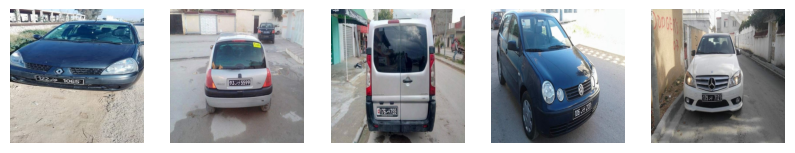

In [ ]:
def visualize_images(image_dir, num_samples=5):
    images = os.listdir(image_dir)[:num_samples]

    plt.figure(figsize=(10, 10))
    for idx, img_name in enumerate(images):
        img = cv.imread(os.path.join(image_dir, img_name))
        plt.subplot(1, num_samples, idx+1)
        plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
        plt.axis("off")

    plt.show()


visualize_images(r"/content/resized")

Loading Bounding Box Coordinates

In [ ]:
df= pd.read_csv('/content/Licplatesdetection_train.csv')
df.head()

,img_id,ymin,xmin,ymax,xmax
0,1.jpg,276,94,326,169
1,10.jpg,311,395,344,444
2,100.jpg,406,263,450,434
3,101.jpg,283,363,315,494
4,102.jpg,139,42,280,222


Converting into YOLO Format

In [ ]:
IMAGE_WIDTH = 640
IMAGE_HEIGHT = 640

# Function to convert bounding box coordinates to YOLO format
def convert_bbox_to_yolo(xmin, ymin, xmax, ymax, img_width, img_height):
    x_center = (xmin + xmax) / 2.0 / img_width
    y_center = (ymin + ymax) / 2.0 / img_height
    width = (xmax - xmin) / img_width
    height = (ymax - ymin) / img_height
    return x_center, y_center, width, height

# Apply conversion to each row in the DataFrame
df['x_center'], df['y_center'], df['width'], df['height'] = zip(
    *df.apply(lambda row: convert_bbox_to_yolo(row['xmin'], row['ymin'], row['xmax'], row['ymax'], IMAGE_WIDTH, IMAGE_HEIGHT), axis=1)
)

# Select only the relevant columns for YOLO format (class_id is assumed to be 0 for license plates)
yolo_df = df[['img_id', 'x_center', 'y_center', 'width', 'height']]
yolo_df['class_id'] = 0  # Assigning '0' as the class for license plates

# Save to a new CSV or text file in YOLO format
for index, row in yolo_df.iterrows():
    label_path = f'/content/dataset/labels/train/{row["img_id"].replace(".jpg", ".txt")}'
    with open(label_path, 'w') as f:
        f.write(f"{row['class_id']} {row['x_center']} {row['y_center']} {row['width']} {row['height']}\n")

print("YOLO format conversion completed.")

<ipython-input-10-3822dac8a7af>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yolo_df['class_id'] = 0  # Assigning '0' as the class for license plates


YOLO format conversion completed.


Splitting Data into Train and Valid Data

In [ ]:
import os
import random
import shutil

# Paths
images_dir = '/content/dataset/images/train'
labels_dir = '/content/dataset/labels/train'

# Create new directories for validation data
val_images_dir = '/content/dataset/images/val'
val_labels_dir = '/content/dataset/labels/val'
os.makedirs(val_images_dir, exist_ok=True)
os.makedirs(val_labels_dir, exist_ok=True)

# Percentage of data to be used for validation
val_percentage = 0.2

# Get a list of all image files
image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg')]

# Randomly shuffle and split the dataset
random.shuffle(image_files)
val_size = int(len(image_files) * val_percentage)
val_files = image_files[:val_size]

# Move validation files to the validation directories
for val_file in val_files:
    # Move the image file
    shutil.move(os.path.join(images_dir, val_file), os.path.join(val_images_dir, val_file))

    # Move the corresponding label file
    label_file = val_file.replace('.jpg', '.txt')
    shutil.move(os.path.join(labels_dir, label_file), os.path.join(val_labels_dir, label_file))

print(f"Moved {val_size} files to validation set.")

Moved 180 files to validation set.


Installing Necessary Package

In [5]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 872.8/872.8 kB 16.2 MB/s eta 0:00:00


Building YOLO Model for License Plate Detection

In [6]:
from ultralytics import YOLO

In [8]:
# Load a YOLOv8 model
model = YOLO("yolov8n.pt")
# Train the model
model.train(data='/content/data.yaml',epochs=50,imgsz=640,batch=16)

100%|██████████| 6.25M/6.25M [00:00<00:00, 74.4MB/s]


Ultralytics YOLOv8.2.95 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=Tr

100%|██████████| 755k/755k [00:00<00:00, 14.6MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/dataset/train/labels... 679 images, 33 backgrounds, 0 corrupt: 100%|██████████| 679/679 [00:00<00:00, 2178.35it/s]

train: New cache created: /content/dataset/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


A new version of Albumentations is available: 1.4.15 (you have 1.4.14). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
val: Scanning /content/dataset/valid/labels... 161 images, 16 backgrounds, 0 corrupt: 100%|██████████| 161/161 [00:00<00:00, 822.66it/s]

val: New cache created: /content/dataset/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.29G      1.106      2.669      1.157          9        640: 100%|██████████| 43/43 [00:17<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.11it/s]

                   all        161        145      0.003          1      0.511        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.23G      1.031      1.594      1.058          8        640: 100%|██████████| 43/43 [00:13<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.30it/s]

                   all        161        145      0.663      0.586      0.535       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.23G       1.04      1.351      1.043         12        640: 100%|██████████| 43/43 [00:13<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

                   all        161        145      0.876      0.821      0.901      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.24G      1.088      1.255      1.105         14        640: 100%|██████████| 43/43 [00:13<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.07it/s]

                   all        161        145      0.904      0.931      0.938      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.23G      1.026      1.089       1.06         12        640: 100%|██████████| 43/43 [00:13<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

                   all        161        145       0.92      0.875      0.925      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.23G      1.002     0.9926      1.071         13        640: 100%|██████████| 43/43 [00:13<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.94it/s]

                   all        161        145      0.846      0.907      0.937      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.23G     0.9469     0.8669      1.036         10        640: 100%|██████████| 43/43 [00:13<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.02it/s]

                   all        161        145      0.921      0.979      0.964      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.23G     0.8993     0.8086      1.013         10        640: 100%|██████████| 43/43 [00:11<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.21it/s]

                   all        161        145      0.933      0.956      0.953      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.22G     0.9044     0.7802      1.009         10        640: 100%|██████████| 43/43 [00:14<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.34it/s]

                   all        161        145      0.955      0.952      0.959      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.23G      0.893      0.765      1.023         14        640: 100%|██████████| 43/43 [00:11<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.51it/s]

                   all        161        145       0.95      0.966      0.972      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.23G     0.8448     0.7222      1.002         14        640: 100%|██████████| 43/43 [00:11<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.96it/s]

                   all        161        145       0.93      0.966      0.961      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.23G     0.8976     0.7747      1.028         12        640: 100%|██████████| 43/43 [00:11<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.47it/s]

                   all        161        145      0.913      0.952      0.957      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.22G     0.8746      0.739      1.003          9        640: 100%|██████████| 43/43 [00:13<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.71it/s]

                   all        161        145      0.939      0.979      0.964      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.23G       0.81      0.696     0.9715         13        640: 100%|██████████| 43/43 [00:13<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.42it/s]

                   all        161        145      0.958      0.972      0.973      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.23G     0.7983     0.6985     0.9851         13        640: 100%|██████████| 43/43 [00:13<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.35it/s]

                   all        161        145      0.939      0.979      0.958      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.23G      0.765     0.6506       0.96          9        640: 100%|██████████| 43/43 [00:13<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.33it/s]

                   all        161        145      0.946      0.975      0.967      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.22G     0.7588     0.6412     0.9601         10        640: 100%|██████████| 43/43 [00:13<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.73it/s]

                   all        161        145      0.952      0.965      0.968      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.23G     0.7698     0.6169     0.9711          8        640: 100%|██████████| 43/43 [00:13<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

                   all        161        145      0.949      0.966      0.964      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.23G     0.7648     0.6168     0.9488         10        640: 100%|██████████| 43/43 [00:12<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.46it/s]

                   all        161        145      0.939      0.964      0.964      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.23G     0.7496     0.5711     0.9454          9        640: 100%|██████████| 43/43 [00:11<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.27it/s]

                   all        161        145      0.952      0.959      0.978      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.22G     0.7079     0.5815     0.9447         11        640: 100%|██████████| 43/43 [00:10<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.72it/s]

                   all        161        145      0.953      0.972      0.972      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.23G     0.7067     0.5585      0.955         10        640: 100%|██████████| 43/43 [00:11<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.66it/s]

                   all        161        145      0.945      0.979       0.97      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.23G     0.7046     0.5907     0.9392          8        640: 100%|██████████| 43/43 [00:12<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.39it/s]

                   all        161        145      0.944      0.979      0.971      0.849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.23G        0.7     0.5439     0.9424         14        640: 100%|██████████| 43/43 [00:16<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.51it/s]

                   all        161        145      0.959      0.972      0.979      0.851



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.22G     0.6984     0.5672     0.9477         14        640: 100%|██████████| 43/43 [00:13<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.31it/s]

                   all        161        145      0.946      0.962      0.978      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.23G     0.6541     0.5251     0.9153          7        640: 100%|██████████| 43/43 [00:13<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.49it/s]

                   all        161        145      0.945      0.979      0.975      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.23G     0.6913     0.5338     0.9259         14        640: 100%|██████████| 43/43 [00:13<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.65it/s]

                   all        161        145      0.952      0.966      0.974      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.23G     0.6616      0.552     0.9246         13        640: 100%|██████████| 43/43 [00:13<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

                   all        161        145      0.947      0.979      0.964      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.22G     0.6687      0.519     0.9315          9        640: 100%|██████████| 43/43 [00:13<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.31it/s]

                   all        161        145      0.952      0.972      0.975      0.871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.23G     0.6326     0.5061      0.924          9        640: 100%|██████████| 43/43 [00:13<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.67it/s]

                   all        161        145      0.953      0.978      0.979      0.856



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.23G     0.6775     0.5048     0.9218          9        640: 100%|██████████| 43/43 [00:12<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.05it/s]

                   all        161        145      0.947      0.978       0.97      0.864



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.23G     0.6225     0.4882     0.9082          6        640: 100%|██████████| 43/43 [00:11<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.38it/s]

                   all        161        145      0.955      0.979      0.973      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.22G     0.6247      0.494     0.9191         12        640: 100%|██████████| 43/43 [00:10<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.86it/s]

                   all        161        145      0.959      0.979      0.962      0.844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.23G     0.6141     0.4871     0.9071         11        640: 100%|██████████| 43/43 [00:11<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.52it/s]

                   all        161        145      0.953      0.971      0.973      0.879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.23G     0.5993     0.4696     0.8984         14        640: 100%|██████████| 43/43 [00:12<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

                   all        161        145      0.955      0.972      0.979      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.23G     0.6029     0.4936     0.9101         12        640: 100%|██████████| 43/43 [00:13<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.33it/s]

                   all        161        145      0.945      0.986      0.976      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.22G     0.6263      0.491     0.9195          6        640: 100%|██████████| 43/43 [00:13<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.02it/s]

                   all        161        145      0.959      0.972      0.975      0.879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.23G     0.5732       0.45     0.8876         11        640: 100%|██████████| 43/43 [00:13<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.46it/s]

                   all        161        145      0.959      0.971      0.975      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.23G     0.5817     0.4597     0.9071         10        640: 100%|██████████| 43/43 [00:15<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

                   all        161        145      0.952      0.968      0.973      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.23G     0.5694     0.4587     0.9001         16        640: 100%|██████████| 43/43 [00:13<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.50it/s]

                   all        161        145      0.958      0.972      0.965      0.874


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.22G     0.4687     0.3675     0.8644          7        640: 100%|██████████| 43/43 [00:14<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.81it/s]

                   all        161        145      0.943      0.979      0.968      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.23G     0.4716     0.3629     0.8651          6        640: 100%|██████████| 43/43 [00:13<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.54it/s]

                   all        161        145      0.957      0.979      0.976      0.891



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.23G     0.4724     0.3572     0.8683          7        640: 100%|██████████| 43/43 [00:12<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.57it/s]

                   all        161        145      0.947      0.985      0.977      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.23G     0.4537     0.3401     0.8536          6        640: 100%|██████████| 43/43 [00:10<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.91it/s]

                   all        161        145       0.96      0.983      0.975      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.22G     0.4469     0.3332      0.851          7        640: 100%|██████████| 43/43 [00:11<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.35it/s]

                   all        161        145      0.959      0.977      0.978      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.23G     0.4442     0.3262     0.8445          7        640: 100%|██████████| 43/43 [00:13<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.77it/s]

                   all        161        145      0.955      0.979      0.976      0.897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.23G     0.4384     0.3275     0.8587          8        640: 100%|██████████| 43/43 [00:12<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.50it/s]

                   all        161        145      0.955      0.972      0.974      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.23G     0.4212     0.3218     0.8452          7        640: 100%|██████████| 43/43 [00:13<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.64it/s]

                   all        161        145       0.94      0.993      0.975      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.22G     0.4234     0.3166     0.8472          7        640: 100%|██████████| 43/43 [00:12<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.46it/s]

                   all        161        145      0.948      0.986      0.979      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.23G      0.397     0.3091     0.8435          7        640: 100%|██████████| 43/43 [00:11<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.76it/s]

                   all        161        145      0.952      0.993      0.977      0.911



50 epochs completed in 0.217 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.95 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.68it/s]


                   all        161        145      0.948      0.986      0.979      0.912
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms loss, 4.3ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b9a1e67a050>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

Evaluating Model on Test Data

In [ ]:
# Run inference on a folder of test images
results = model.predict(source='/content/test/test',save=True)


image 1/210 /content/test/test/1000.jpg: 448x640 1 license_plate, 10.2ms
image 2/210 /content/test/test/1001.jpg: 640x384 1 license_plate, 10.7ms
image 3/210 /content/test/test/1002.jpg: 640x480 1 license_plate, 7.4ms
image 4/210 /content/test/test/1003.jpg: 384x640 1 license_plate, 7.4ms
image 5/210 /content/test/test/1004.jpg: 640x384 1 license_plate, 8.0ms
image 6/210 /content/test/test/1005.jpg: 640x384 1 license_plate, 6.7ms
image 7/210 /content/test/test/1006.jpg: 640x480 1 license_plate, 10.1ms
image 8/210 /content/test/test/1007.jpg: 640x384 1 license_plate, 7.0ms
image 9/210 /content/test/test/1008.jpg: 384x640 1 license_plate, 8.8ms
image 10/210 /content/test/test/1009.jpg: 384x640 1 license_plate, 8.7ms
image 11/210 /content/test/test/1010.jpg: 640x384 1 license_plate, 8.1ms
image 12/210 /content/test/test/1011.jpg: 640x384 1 license_plate, 6.4ms
image 13/210 /content/test/test/1012.jpg: 480x640 1 license_plate, 7.1ms
image 14/210 /content/test/test/1013.jpg: 640x480 1 lice

Visualizing Test Data

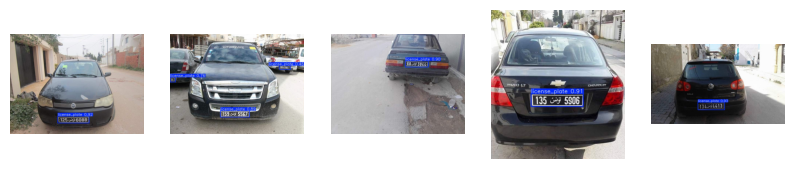

In [ ]:
def visualize_images(image_dir, num_samples=5):
    images = os.listdir(image_dir)[:num_samples]

    plt.figure(figsize=(10, 10))
    for idx, img_name in enumerate(images):
        img = cv.imread(os.path.join(image_dir, img_name))
        plt.subplot(1, num_samples, idx+1)
        plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
        plt.axis("off")

    plt.show()


visualize_images(r"/content/runs/detect/train2")

Install Tesseract and Libraries

In [28]:
!pip install pytesseract

In [29]:
!sudo apt-get install tesseract-ocr

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 49 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 0s (14.5 MB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debco

Processing 562.jpg


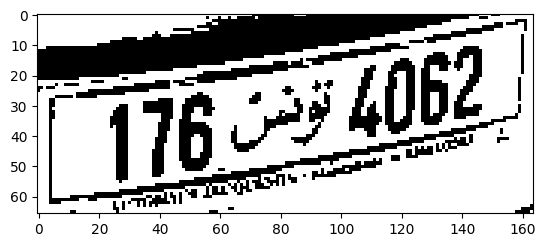

Detected License Plate: 
Processing 64.jpg


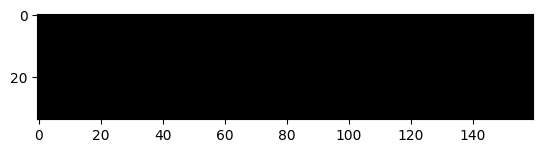

Detected License Plate: OS
Processing 818.jpg


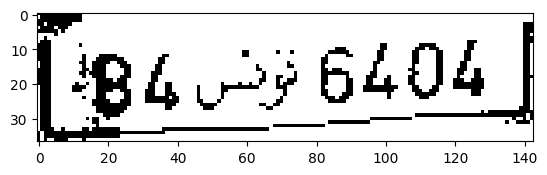

Detected License Plate: 1284.02) 6404 |
Processing 214.jpg


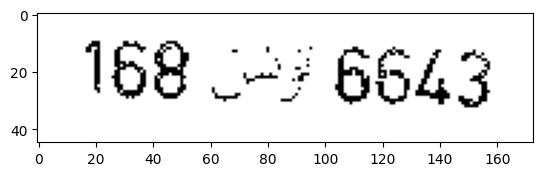

Detected License Plate: 168 2-7 6643
Processing 55.jpg


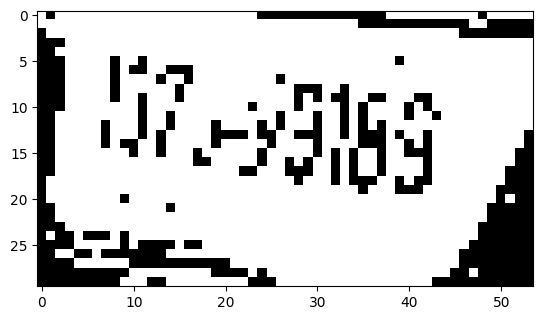

Detected License Plate: 
Processing 358.jpg


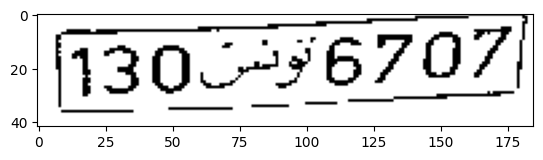

Detected License Plate: 1302476707
Processing 755.jpg


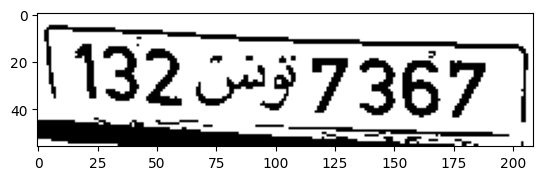

Detected License Plate: 1325537367.
Processing 820.jpg


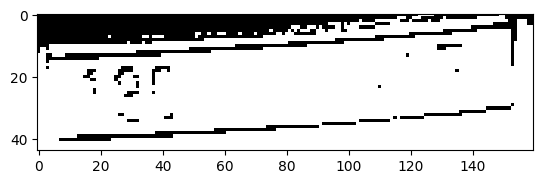

Detected License Plate: 
Processing 710.jpg


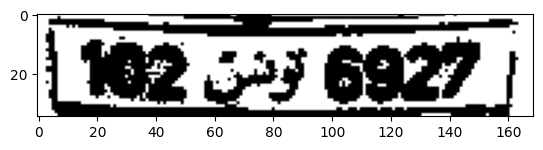

Detected License Plate: 1 12 37 6927
Processing 88.jpg


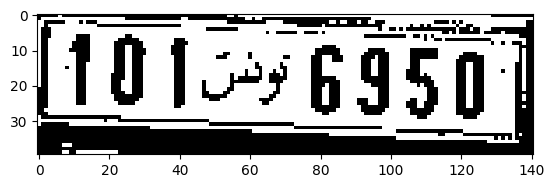

Detected License Plate: 
Processing 524.jpg


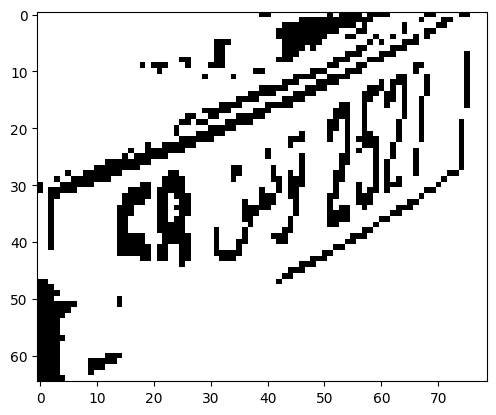

Detected License Plate: 
Processing 333.jpg


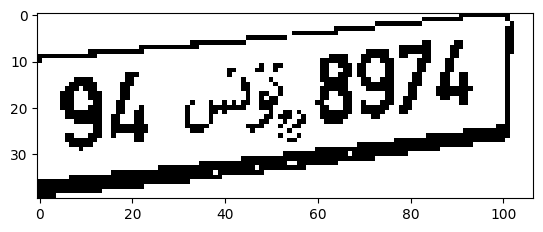

Detected License Plate: 
Processing 34.jpg


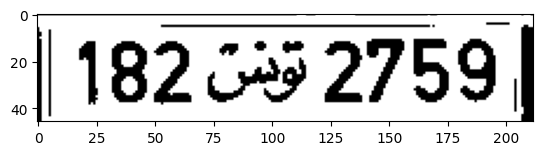

Detected License Plate: | 182.535 2759 |
Processing 417.jpg


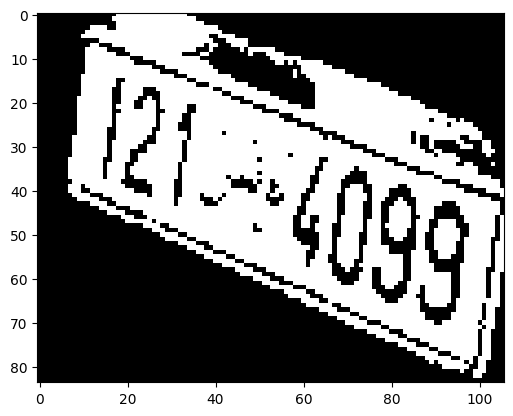

Detected License Plate: 
Processing 359.jpg


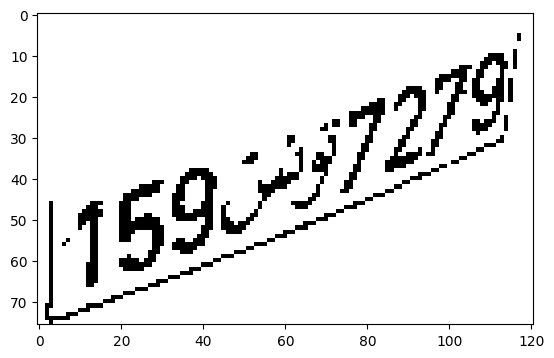

Detected License Plate: 592
Processing 258.jpg


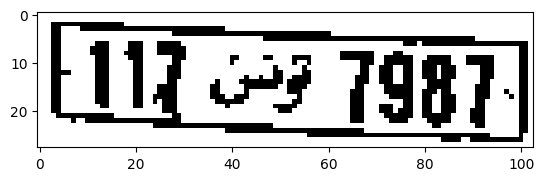

Detected License Plate: 
Processing 225.jpg


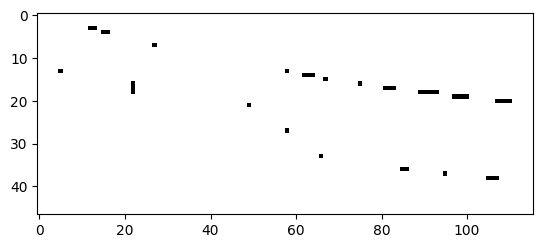

Detected License Plate: . -
Processing 54.jpg


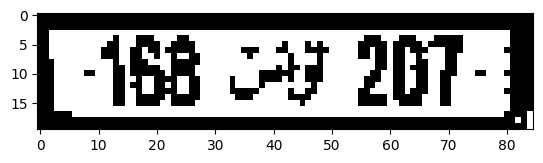

Detected License Plate: 488 oF 207-
Processing 169.jpg


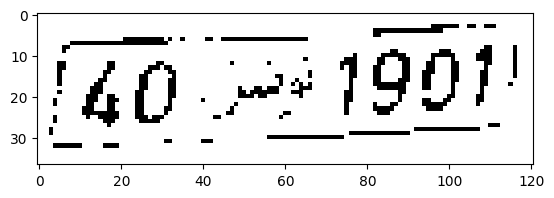

Detected License Plate: (G0 7931901!
Processing 87.jpg


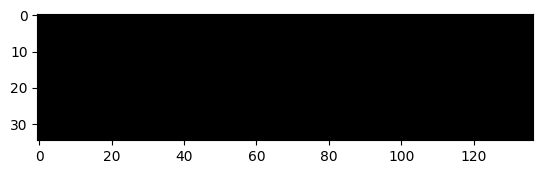

Detected License Plate: Se
Processing 619.jpg


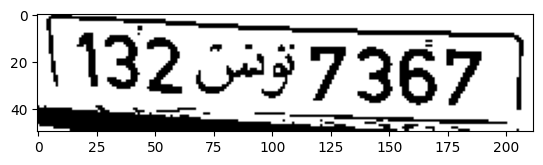

Detected License Plate: 132 497367_
Processing 778.jpg


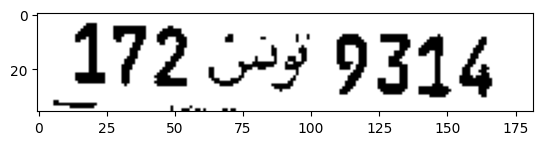

Detected License Plate: 172 3 93146
Processing 194.jpg


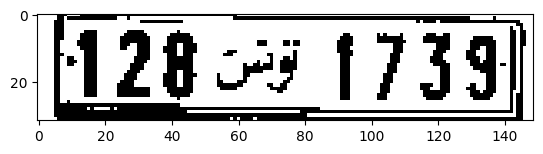

Detected License Plate: 128 9 1739
Processing 480.jpg


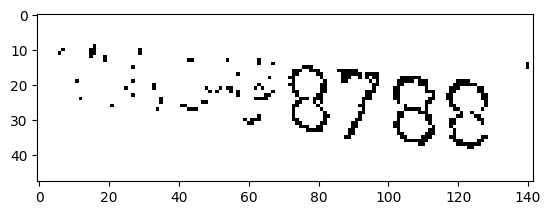

Detected License Plate: “YO78e
Processing 134.jpg


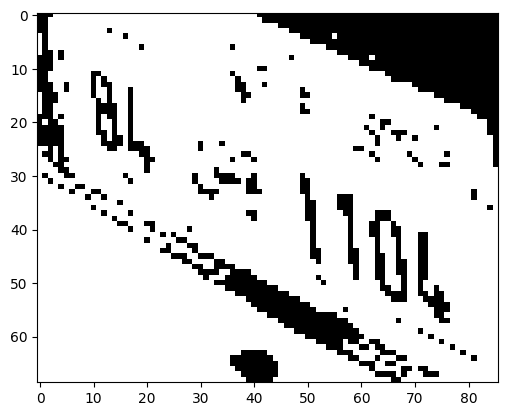

Detected License Plate: 
Processing 414.jpg


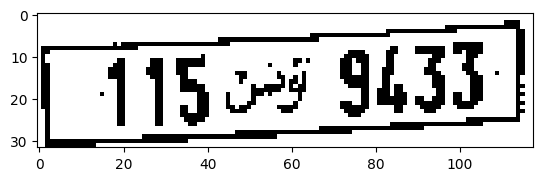

Detected License Plate: 
Processing 372.jpg


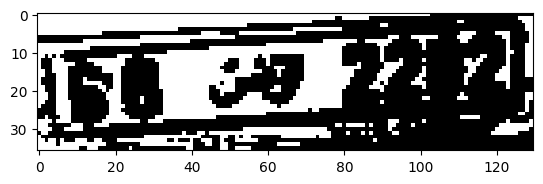

Detected License Plate: (p67 zou)
Processing 648.jpg


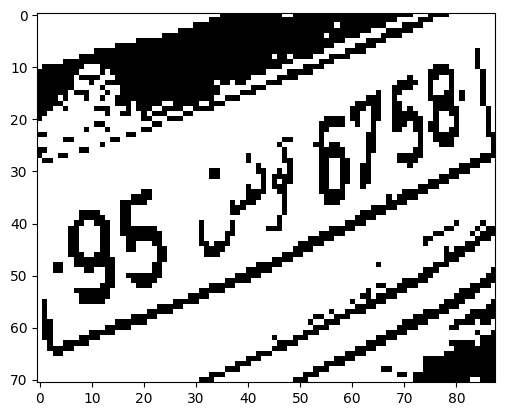

Detected License Plate: 
Processing 475.jpg


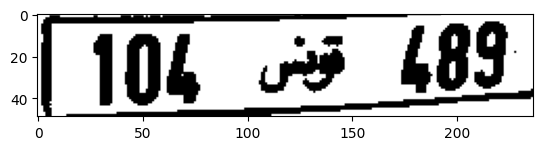

Detected License Plate: [104 3 489.
Processing 53.jpg


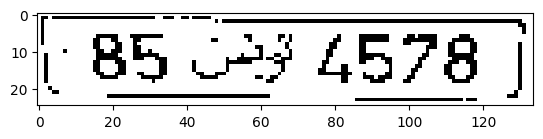

Detected License Plate: | 85 23 4578 |
Processing 752.jpg


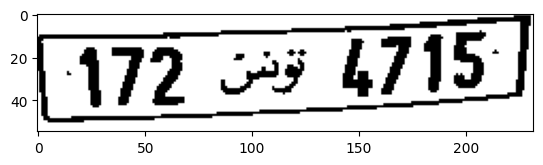

Detected License Plate: 
Processing 576.jpg


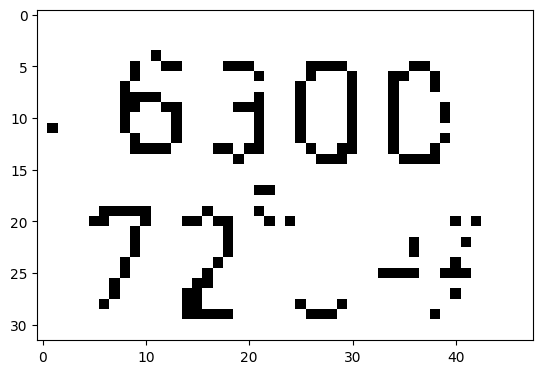

Detected License Plate: 8300.
Processing 191.jpg


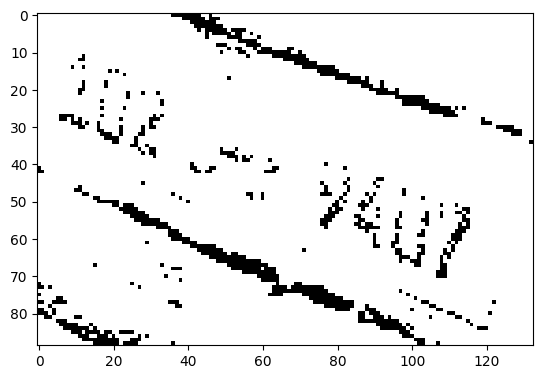

Detected License Plate: 
Processing 293.jpg


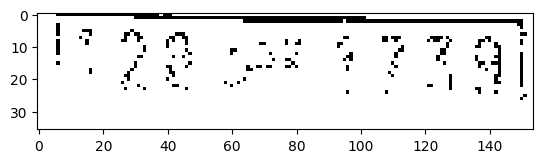

Detected License Plate: 
Processing 563.jpg


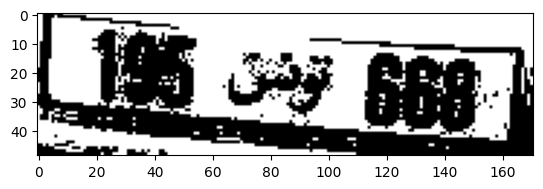

Detected License Plate: 
Processing 901.jpg


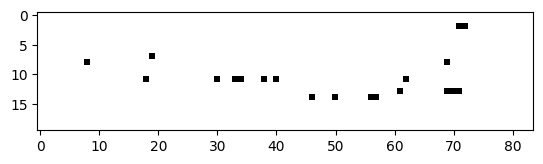

Detected License Plate: L
Processing 746.jpg


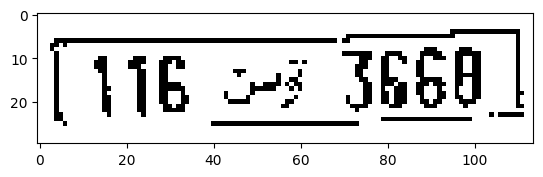

Detected License Plate: VG 3 3668 |
Processing 874.jpg


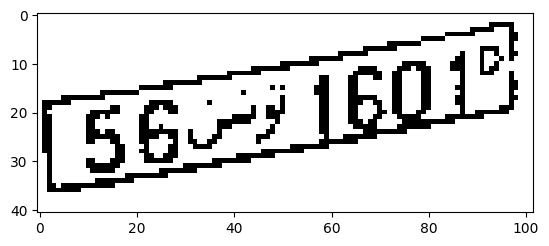

Detected License Plate: gece
Processing 390.jpg


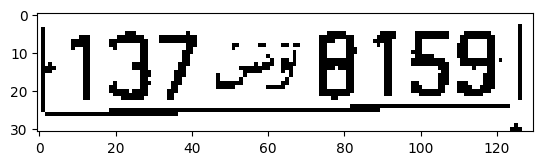

Detected License Plate: 1137 +78159|
Processing 389.jpg


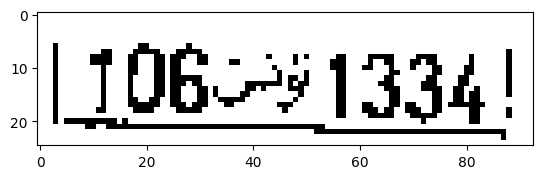

Detected License Plate: | 1062-91334!
Processing 661.jpg


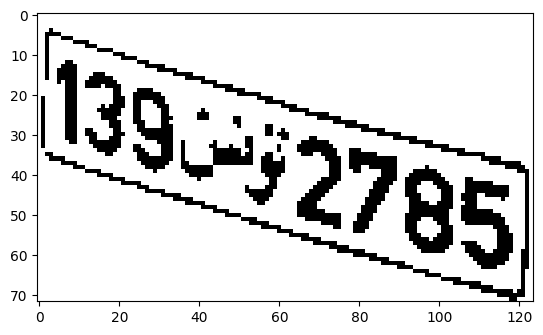

Detected License Plate: 
Processing 355.jpg


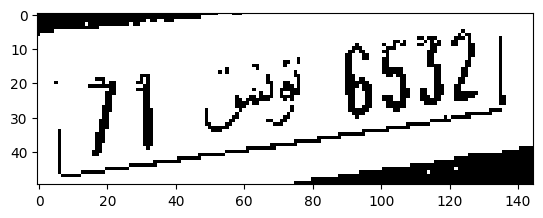

Detected License Plate: 
Processing 155.jpg


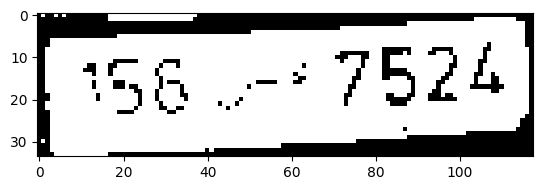

Detected License Plate: 456 6 7524
Processing 602.jpg


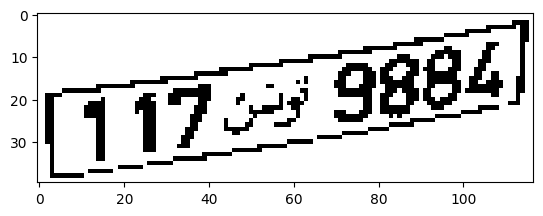

Detected License Plate: ars 5884
Processing 118.jpg


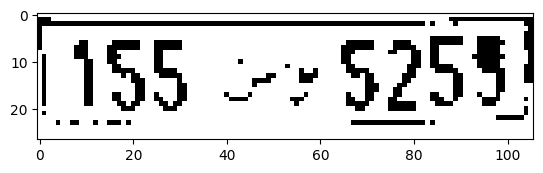

Detected License Plate: 1155 => $258!
Processing 531.jpg


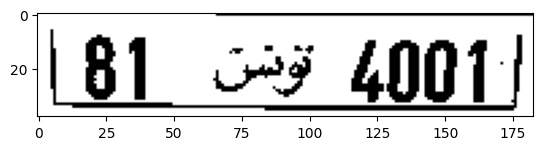

Detected License Plate: 81 Os 4001
Processing 708.jpg


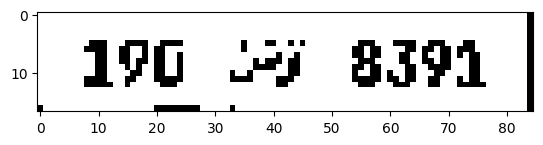

Detected License Plate: 196 23 8392 |
Processing 140.jpg


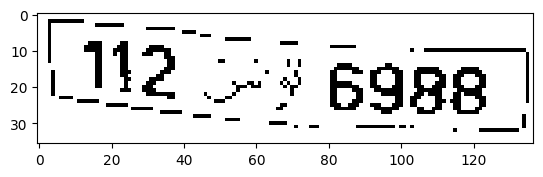

Detected License Plate: N25 6986.
Processing 814.jpg


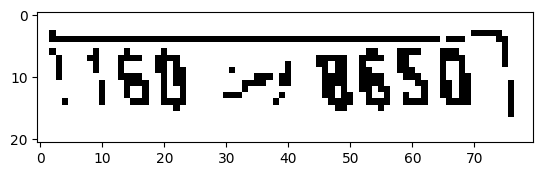

Detected License Plate: Tap = WeS0 |
Processing 279.jpg


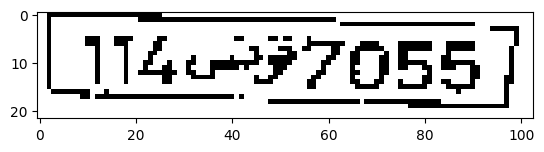

Detected License Plate: 4697055
Processing 449.jpg


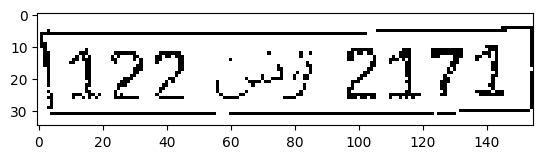

Detected License Plate: (422 3) 2471
Processing 875.jpg


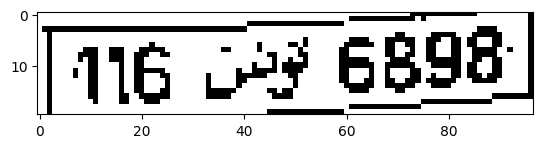

Detected License Plate: TG ¥ 6898)
Processing 591.jpg


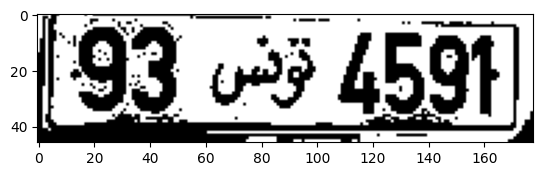

Detected License Plate: 93 5 4591]
Processing 281.jpg


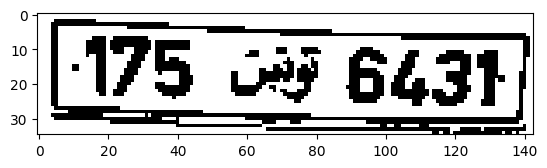

Detected License Plate: 
Processing 694.jpg


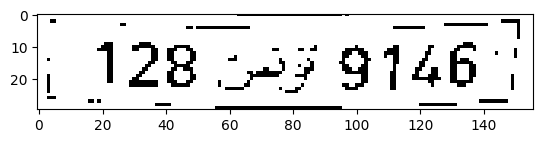

Detected License Plate: ; 128 233 9146)
Processing 56.jpg


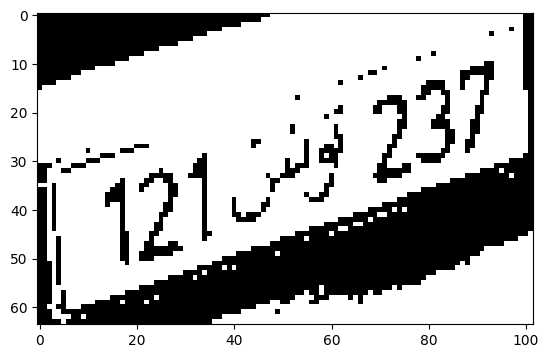

Detected License Plate: rag zy
Processing 384.jpg


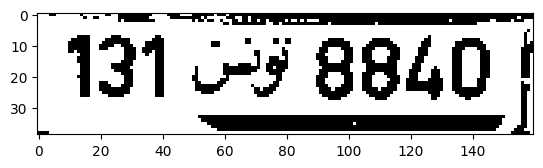

Detected License Plate: 131 9 8840 |
Processing 104.jpg


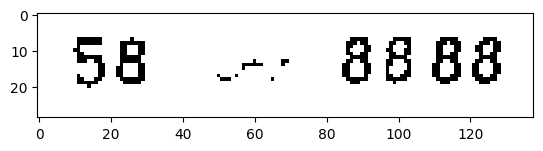

Detected License Plate: 58 .-- 8688
Processing 441.jpg


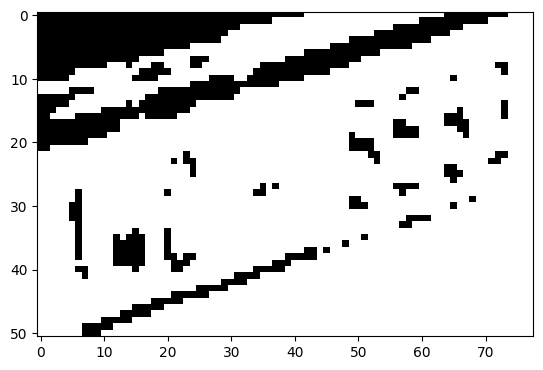

Detected License Plate: 
Processing 865.jpg


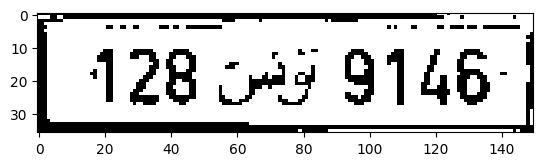

Detected License Plate: 128 243 9146. |
Processing 479.jpg


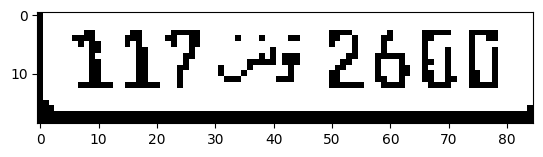

Detected License Plate: 417 3 2600,
Processing 203.jpg


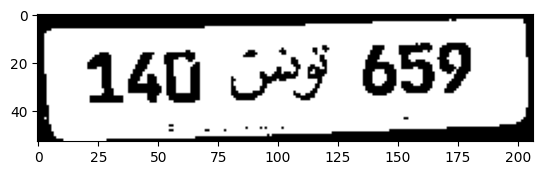

Detected License Plate: | 140 Sy 659
Processing 181.jpg


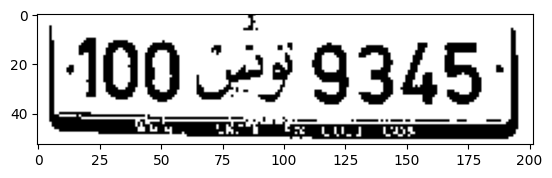

Detected License Plate: 100 249 9345-
Processing 447.jpg


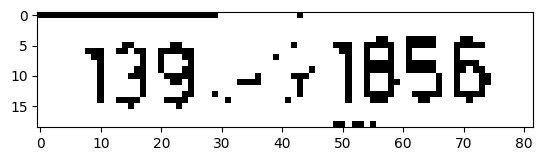

Detected License Plate: 139.7 1856
Processing 238.jpg


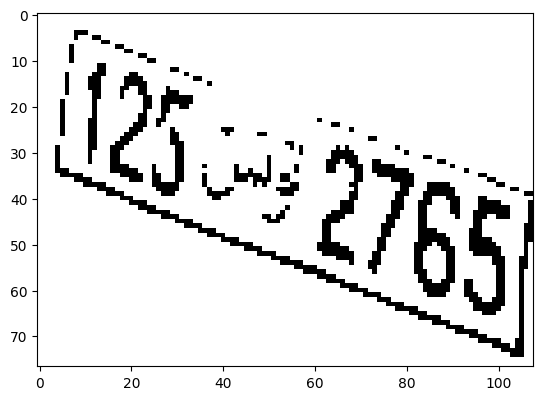

Detected License Plate: 
Processing 525.jpg


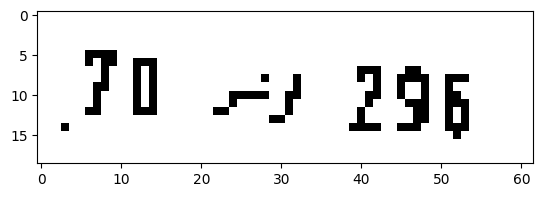

Detected License Plate: 70s 295
Processing 690.jpg


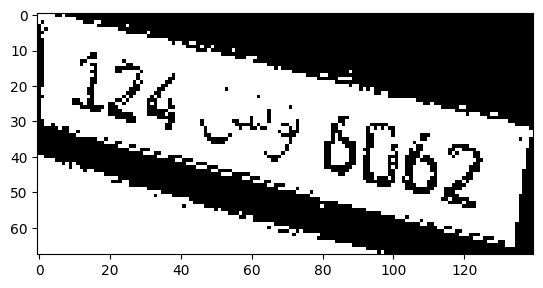

Detected License Plate: 
Processing 172.jpg


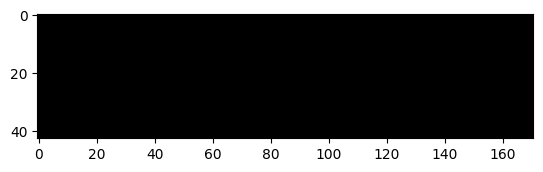

Detected License Plate: OS
Processing 907.jpg


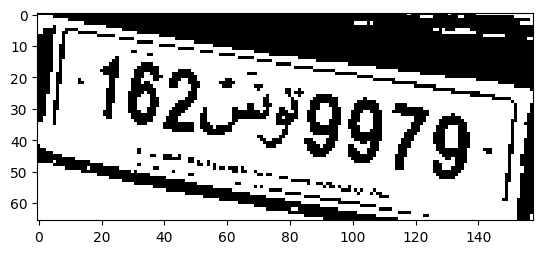

Detected License Plate: 
Processing 675.jpg


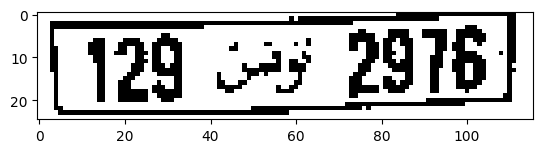

Detected License Plate: 
Processing 98.jpg


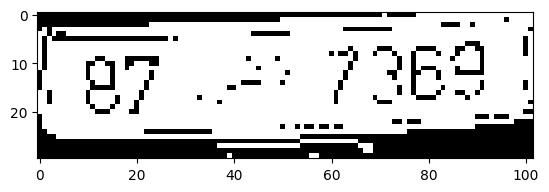

Detected License Plate: Pe7 = 7268
Processing 305.jpg


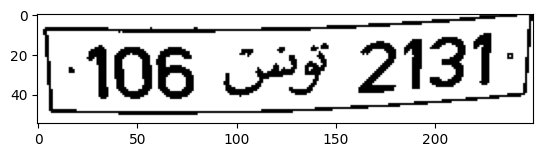

Detected License Plate: ‘106 4 2131:
Processing 407.jpg


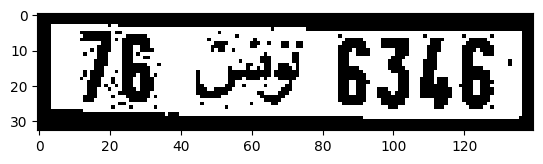

Detected License Plate: 78 Oy 6346
Processing 326.jpg


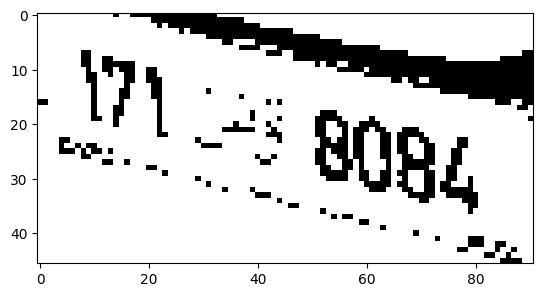

Detected License Plate: Ne
Processing 895.jpg


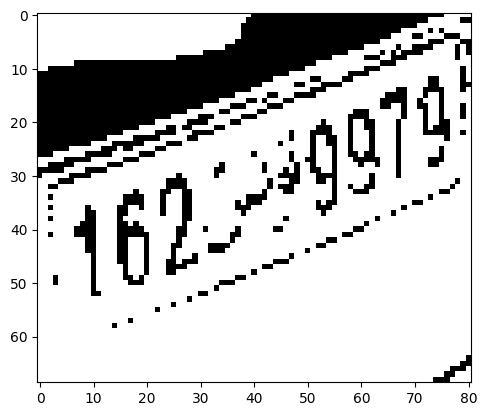

Detected License Plate: 
Processing 658.jpg


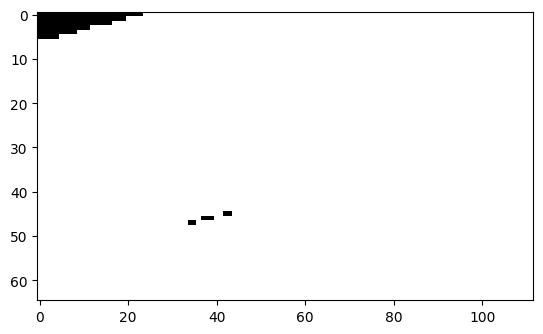

Detected License Plate: -
Processing 397.jpg


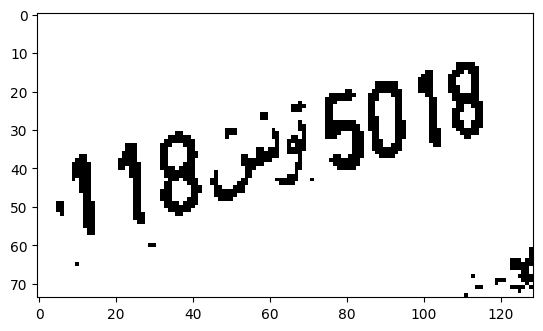

Detected License Plate: 4194 sae
Processing 289.jpg


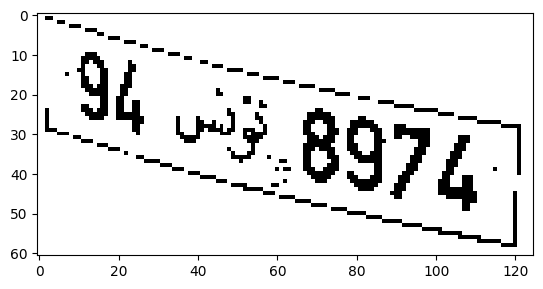

Detected License Plate: 
Processing 680.jpg


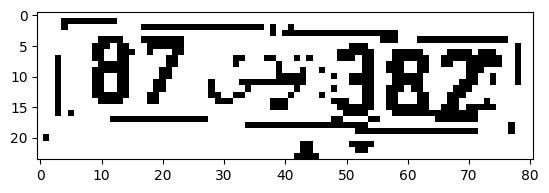

Detected License Plate: (87 gaz"
Processing 704.jpg


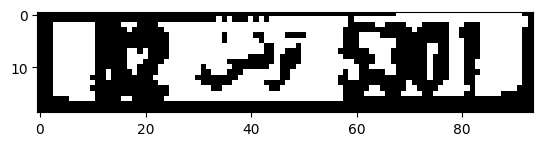

Detected License Plate: | BP 7 S301 |
Processing 180.jpg


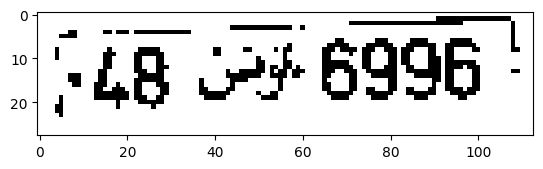

Detected License Plate: S48 #6996
Processing 422.jpg


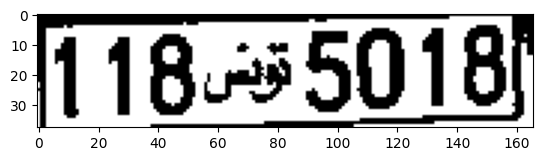

Detected License Plate: 118.5018)
Processing 750.jpg


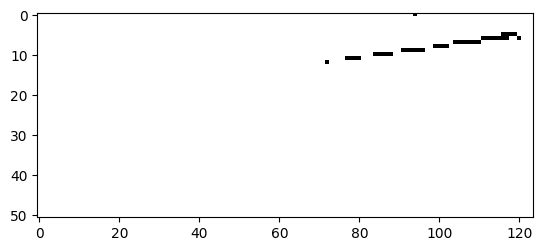

Detected License Plate: ——o
Processing 387.jpg


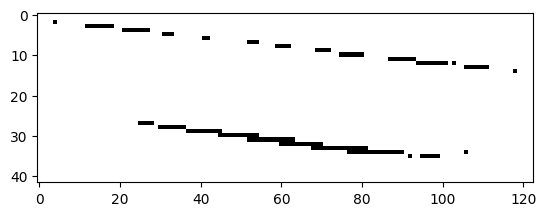

Detected License Plate: 
Processing 208.jpg


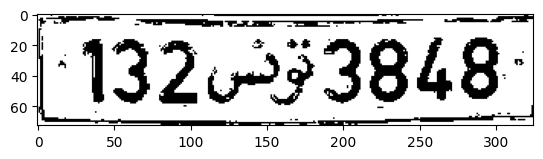

Detected License Plate: 132233848-
Processing 448.jpg


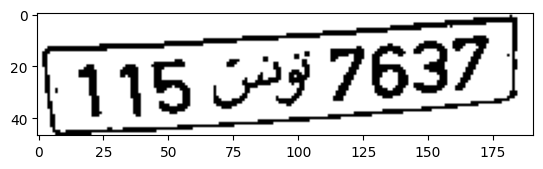

Detected License Plate: 
Processing 149.jpg


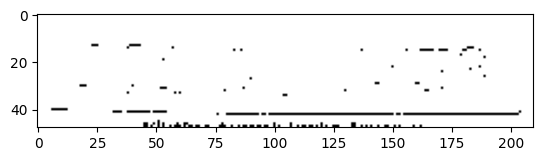

Detected License Plate: =
Processing 867.jpg


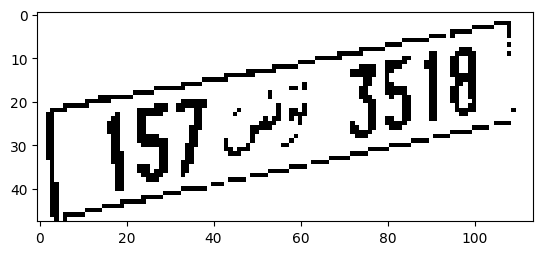

Detected License Plate: oe St
Processing 415.jpg


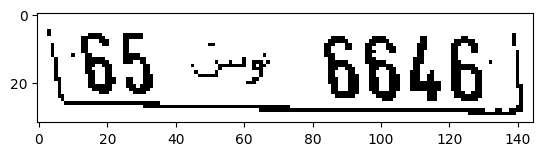

Detected License Plate: $5 =» 6646
Processing 745.jpg


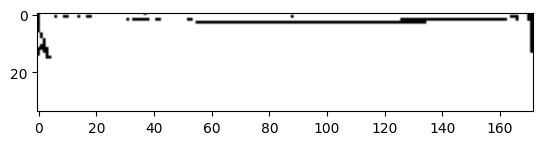

Detected License Plate: A —
Processing 760.jpg


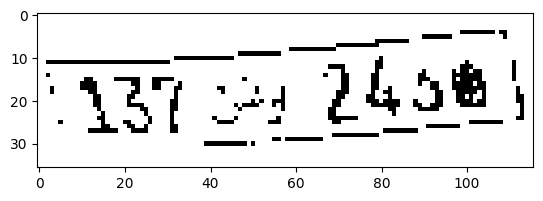

Detected License Plate: Tey Dhow
Processing 366.jpg


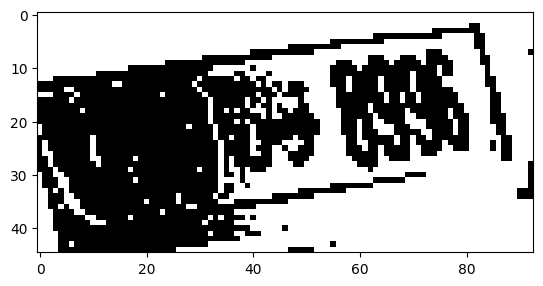

Detected License Plate: em
Processing 46.jpg


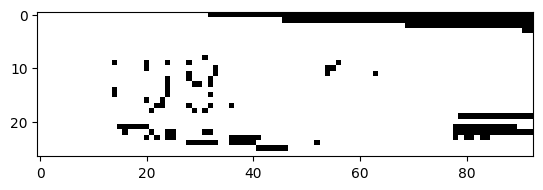

Detected License Plate: a
Processing 535.jpg


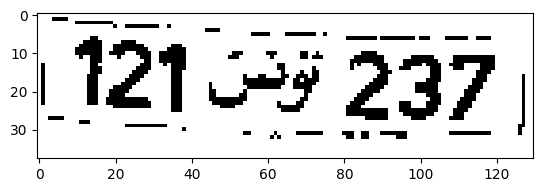

Detected License Plate: 121 9 237 |
Processing 559.jpg


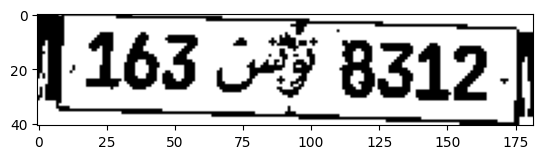

Detected License Plate: 163 39 8312 |
Processing 247.jpg


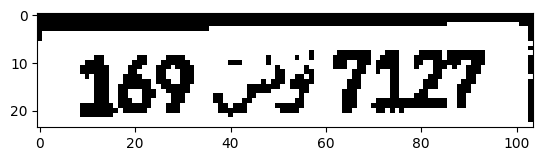

Detected License Plate: 169 9 7127 |
Processing 193.jpg


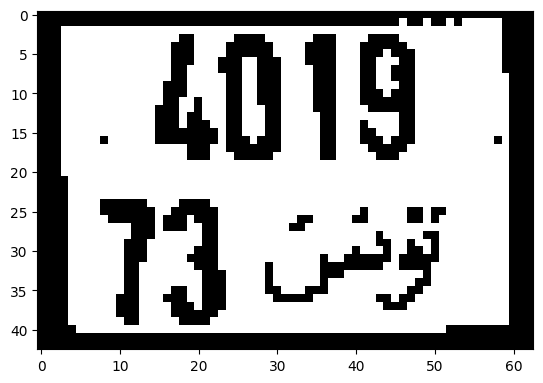

Detected License Plate: ws
Processing 331.jpg


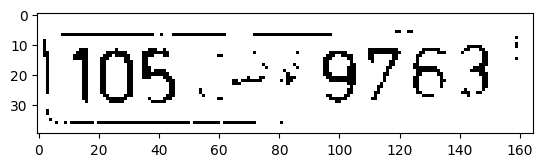

Detected License Plate: 1105 ("9763
Processing 376.jpg


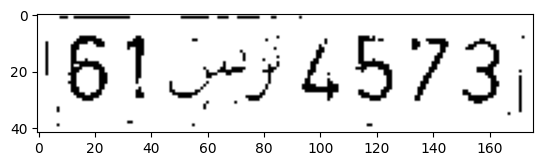

Detected License Plate: 161076573,
Processing 757.jpg


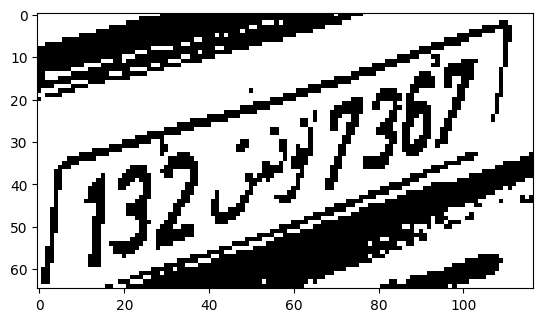

Detected License Plate: Go
Processing 878.jpg


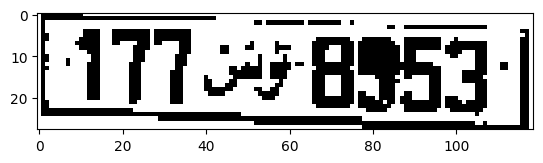

Detected License Plate: T7717 8953 |
Processing 12.jpg


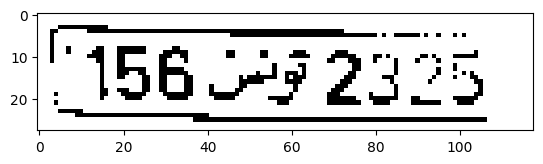

Detected License Plate: 156 9 2325
Processing 341.jpg


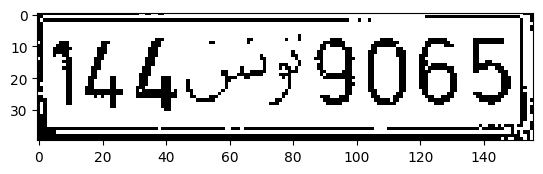

Detected License Plate: 144°39065|
Processing 222.jpg


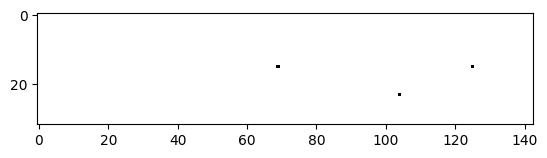

Detected License Plate: ee
Processing 231.jpg


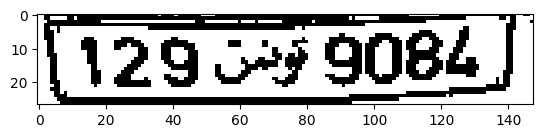

Detected License Plate: 1129 93 9084
Processing 4.jpg


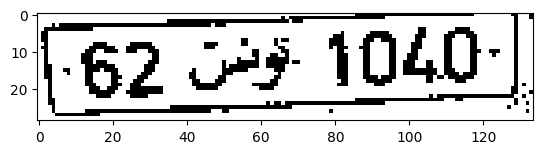

Detected License Plate: “62.9 1040-
Processing 380.jpg


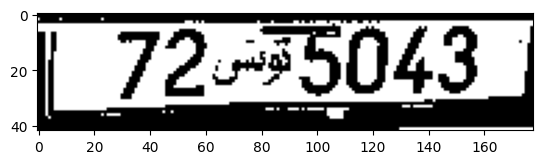

Detected License Plate: 72739043
Processing 844.jpg


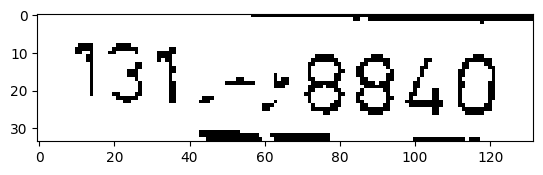

Detected License Plate: 131.--8840
Processing 766.jpg


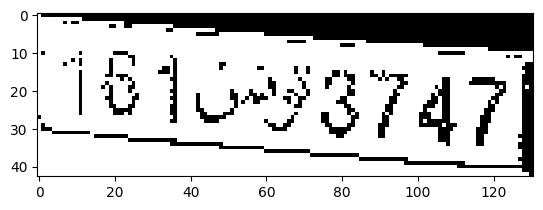

Detected License Plate: 1816253747
Processing 18.jpg


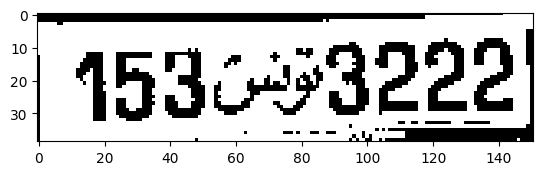

Detected License Plate: 1596-93222)
Processing 666.jpg


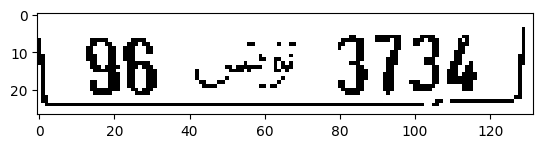

Detected License Plate: 96 =" 3734 |
Processing 459.jpg


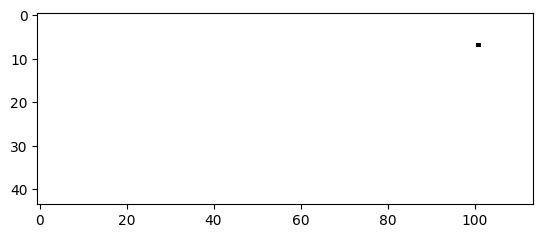

Detected License Plate: OO
Processing 876.jpg


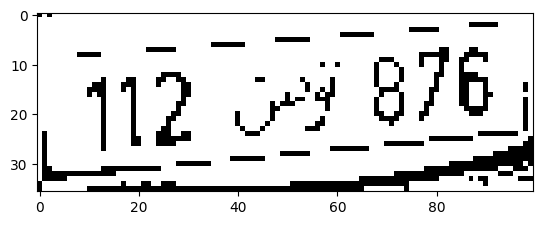

Detected License Plate: 12 Pt BIE
Processing 161.jpg


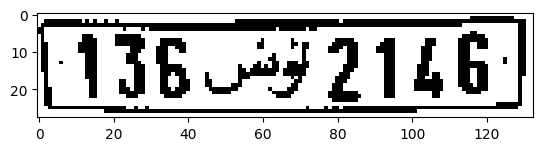

Detected License Plate: 136492146
Processing 577.jpg


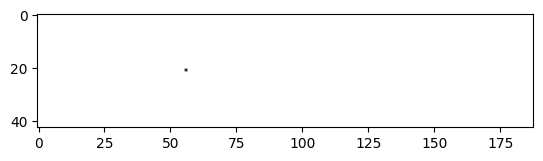

Detected License Plate: re
Processing 120.jpg


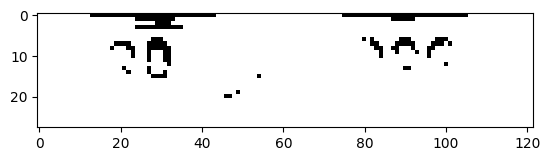

Detected License Plate: Ue
Processing 672.jpg


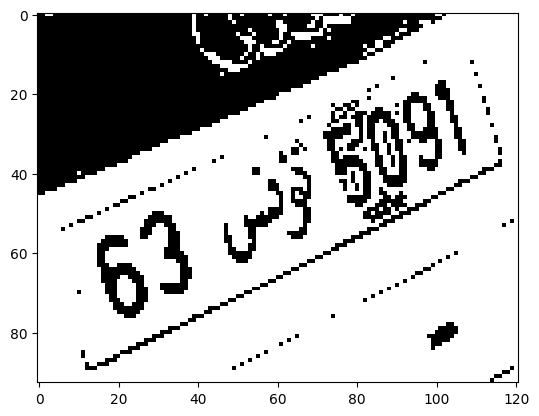

Detected License Plate: 
Processing 662.jpg


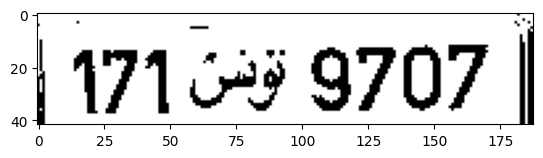

Detected License Plate: 17168 9707 |
Processing 823.jpg


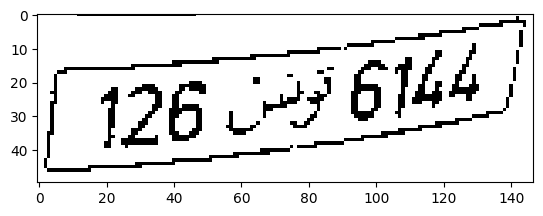

Detected License Plate: 
Processing 150.jpg


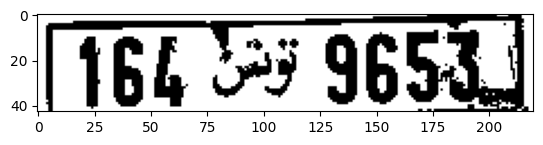

Detected License Plate: 166 > 9653.)
Processing 107.jpg


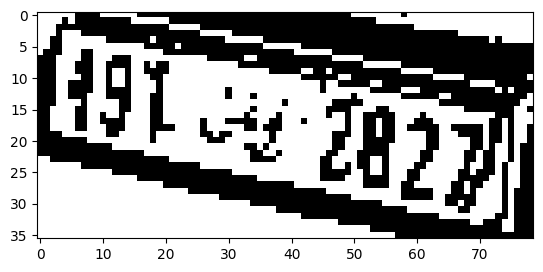

Detected License Plate: 
Processing 835.jpg


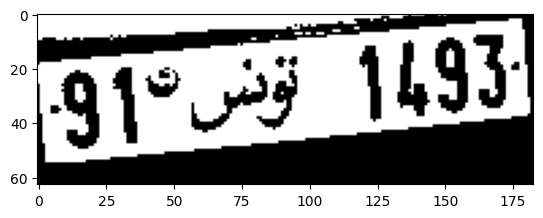

Detected License Plate: 3) bas
Processing 877.jpg


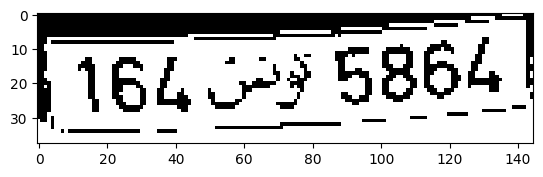

Detected License Plate: 164 33 5864.
Processing 260.jpg


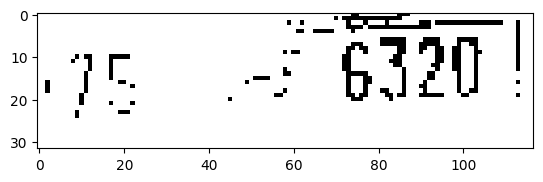

Detected License Plate: ae oF 6320!
Processing 59.jpg


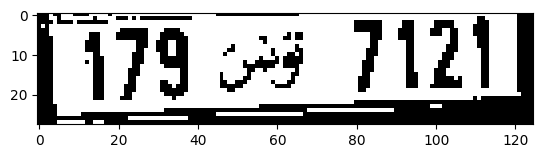

Detected License Plate: 479 9 7121]
Processing 240.jpg


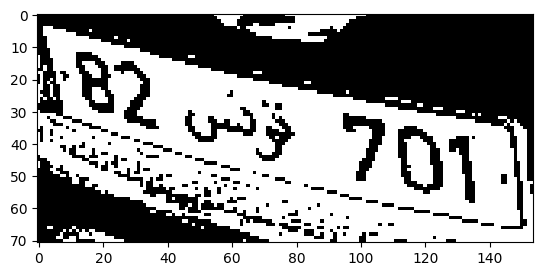

Detected License Plate: ToT
Processing 504.jpg


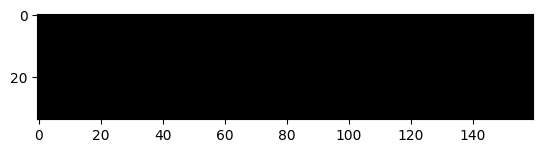

Detected License Plate: OS
Processing 406.jpg


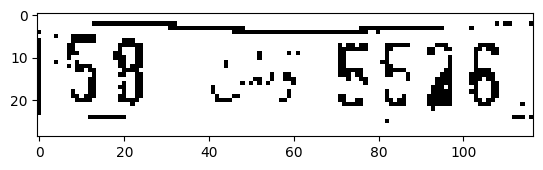

Detected License Plate: 59 cr BSNS.
Processing 337.jpg


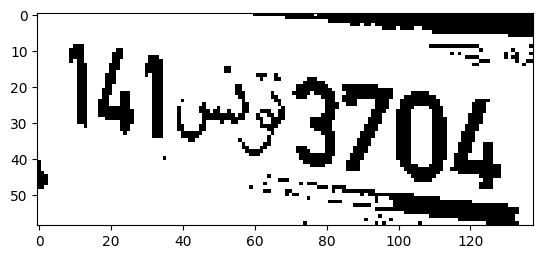

Detected License Plate: MWl93794,
Processing 291.jpg


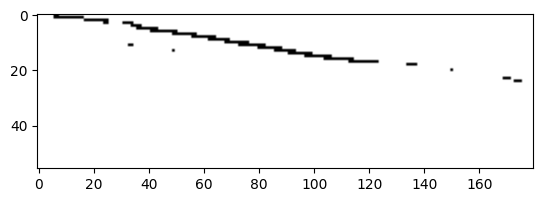

Detected License Plate: Te ~
Processing 829.jpg


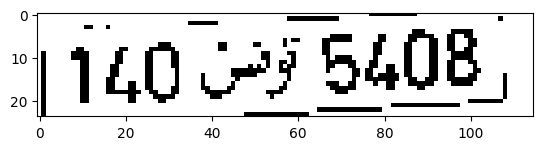

Detected License Plate: 1140 <7 5408,
Processing 456.jpg


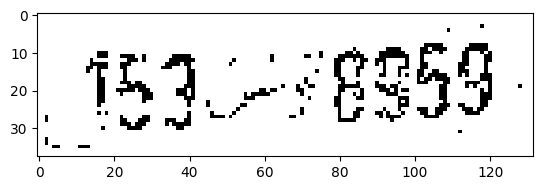

Detected License Plate: 84-8985
Processing 167.jpg


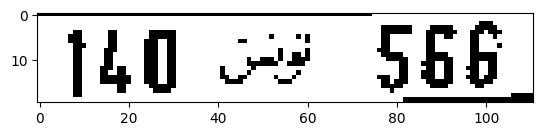

Detected License Plate: 40 ~ S&E
Processing 613.jpg


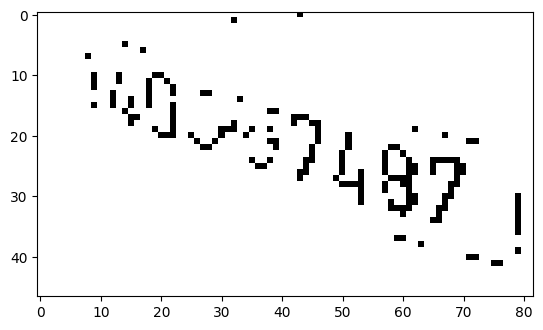

Detected License Plate: Sen
Processing 72.jpg


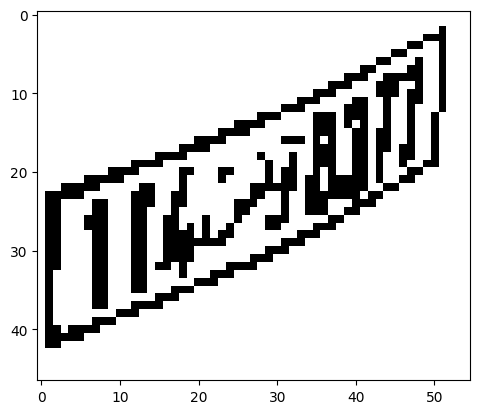

Detected License Plate: 
Processing 539.jpg


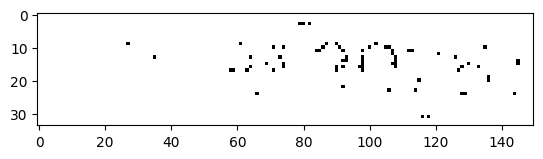

Detected License Plate: pa PY
Processing 99.jpg


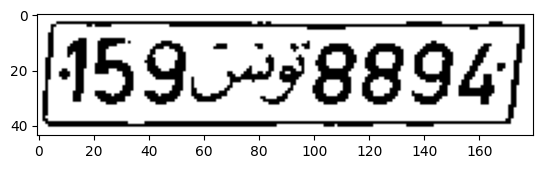

Detected License Plate: 1595-98894;
Processing 144.jpg


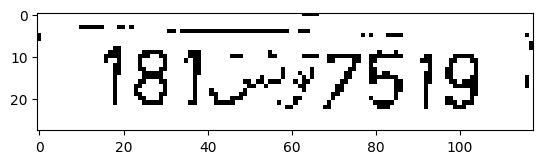

Detected License Plate: “481237519 ©
Processing 711.jpg


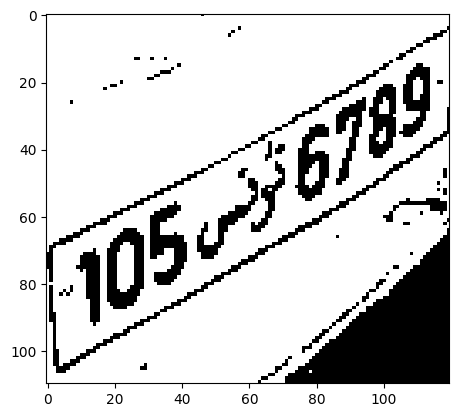

Detected License Plate: FZ
Processing 404.jpg


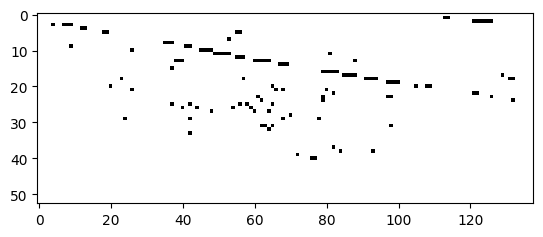

Detected License Plate: Wy ies
Processing 719.jpg


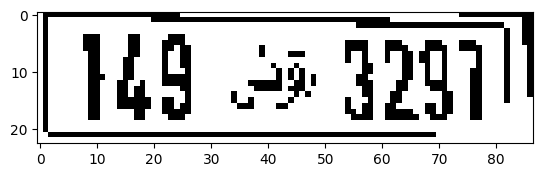

Detected License Plate: 145 2% 22971
Processing 809.jpg


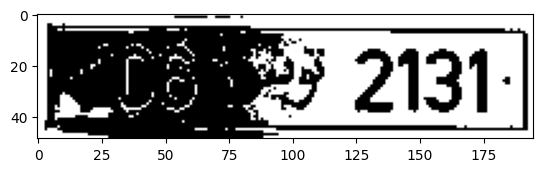

Detected License Plate: Mama 2131-
Processing 232.jpg


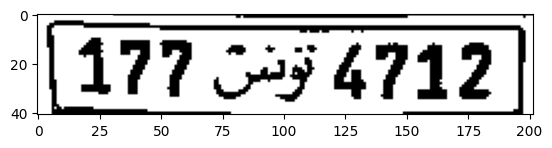

Detected License Plate: 177 543 4712
Processing 639.jpg


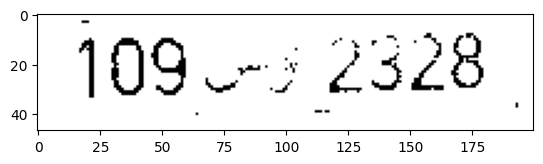

Detected License Plate: 109-3 2528
Processing 731.jpg


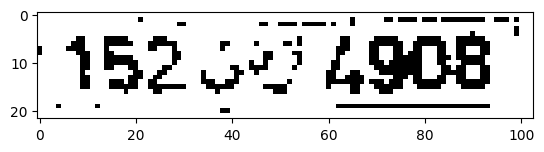

Detected License Plate: 152 5) 4908 ©
Processing 186.jpg


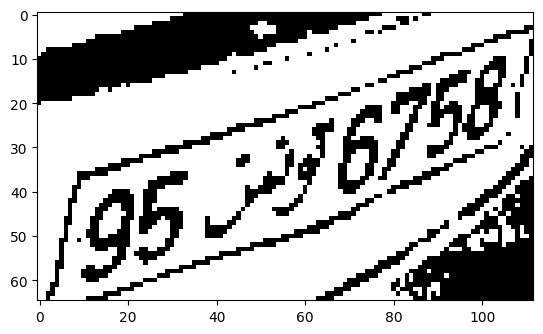

Detected License Plate: GE
Processing 478.jpg


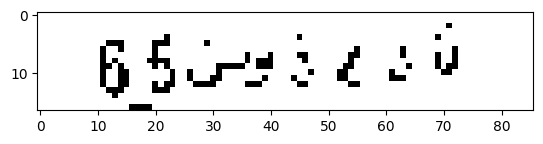

Detected License Plate: Borie se
Processing 147.jpg


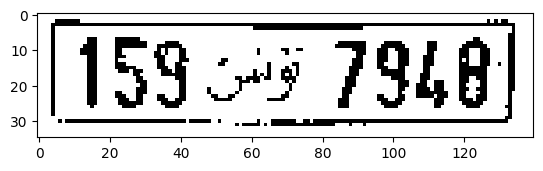

Detected License Plate: [159 <3 7948
Processing 343.jpg


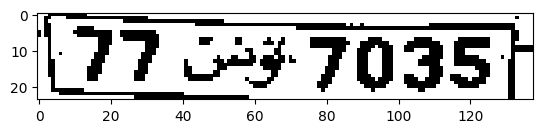

Detected License Plate: 77 F7035
Processing 544.jpg


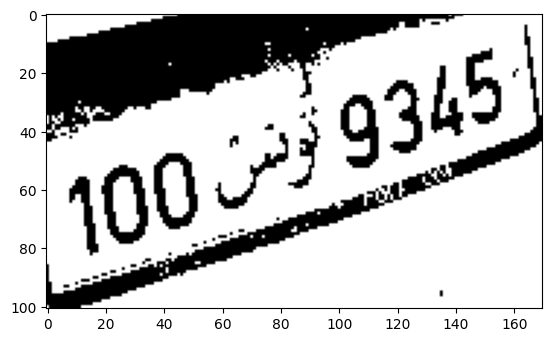

Detected License Plate: 
Processing 253.jpg


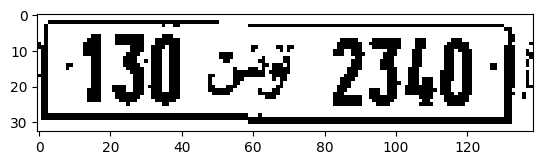

Detected License Plate: 130 oF 23404:
Processing 601.jpg


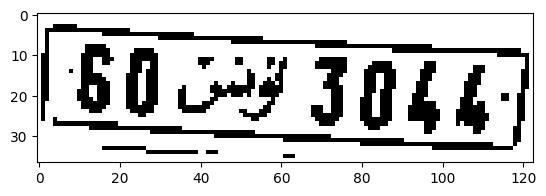

Detected License Plate: 
Processing 255.jpg


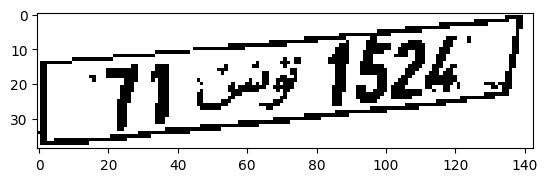

Detected License Plate: 
Processing 701.jpg


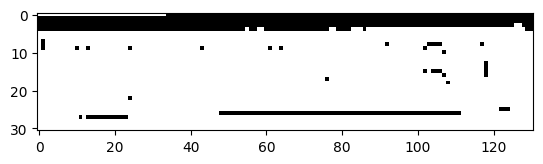

Detected License Plate: a4
Processing 77.jpg


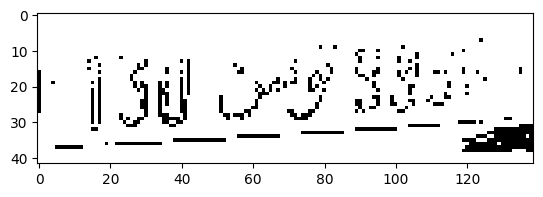

Detected License Plate: pS ee Se
Processing 541.jpg


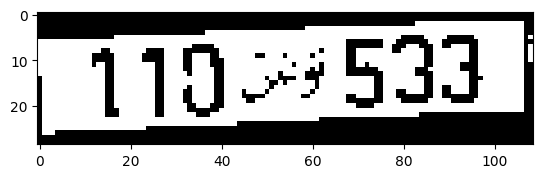

Detected License Plate: 11027533
Processing 592.jpg


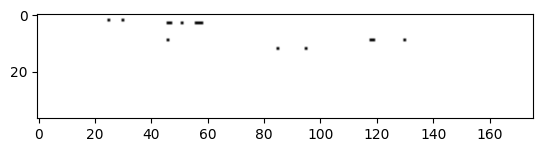

Detected License Plate: 7
Processing 850.jpg


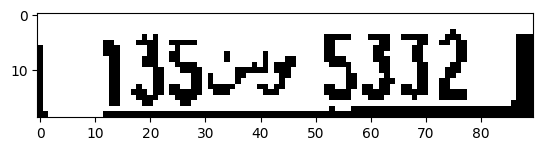

Detected License Plate: | 135c+r 5352
Processing 335.jpg


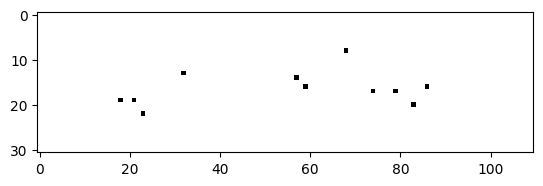

Detected License Plate: a
Processing 162.jpg


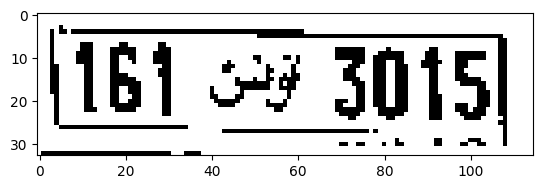

Detected License Plate: (161 ¥ 3015
Processing 382.jpg


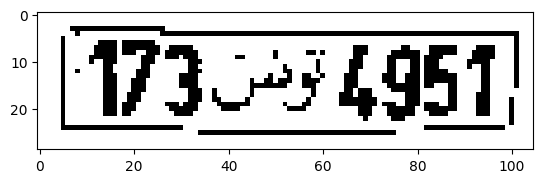

Detected License Plate: [173.53 49571
Processing 611.jpg


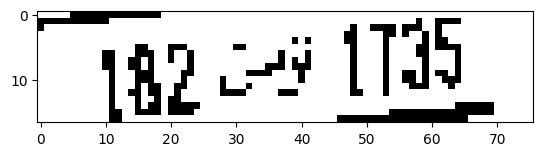

Detected License Plate: 792 TS
Processing 566.jpg


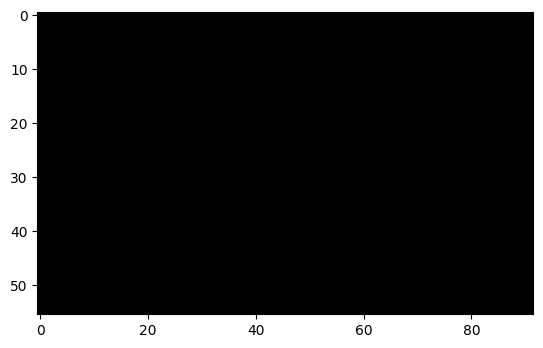

Detected License Plate: a
Processing 174.jpg


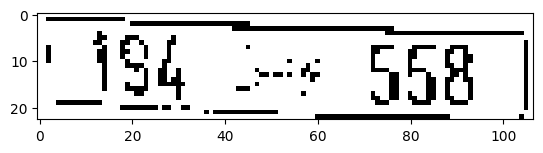

Detected License Plate: 484» 958 |
Processing 290.jpg


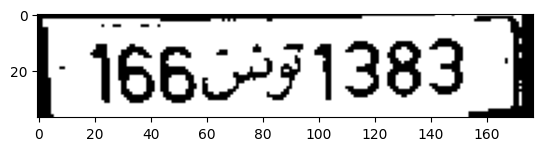

Detected License Plate: | 1665471383 |
Processing 362.jpg


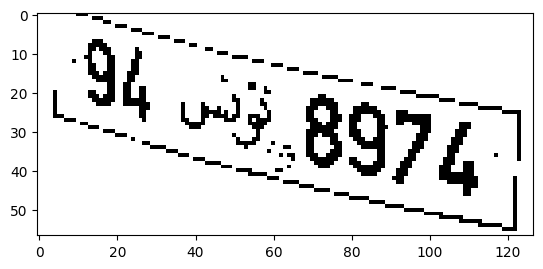

Detected License Plate: 
Processing 66.jpg


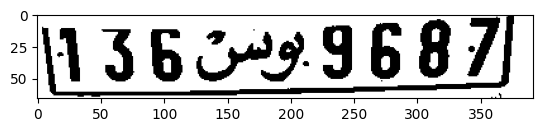

Detected License Plate: 56699687)
Processing 507.jpg


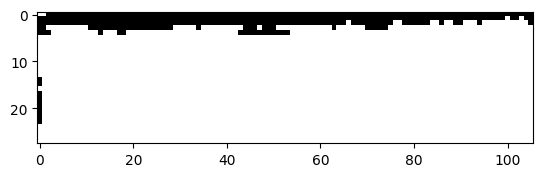

Detected License Plate: 
Processing 302.jpg


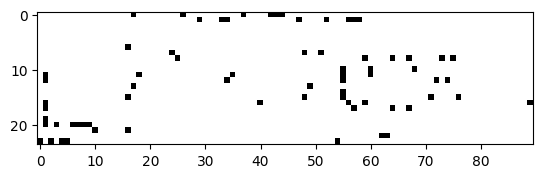

Detected License Plate: ere
Processing 482.jpg


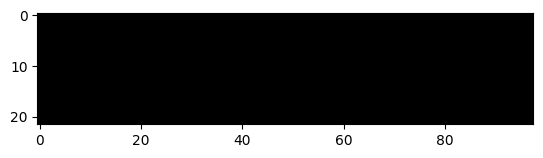

Detected License Plate: ee
Processing 41.jpg


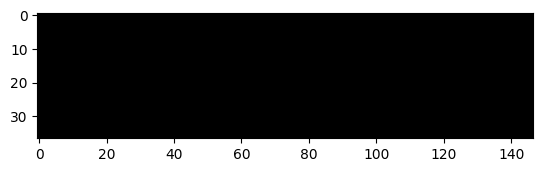

Detected License Plate: OS
Processing 52.jpg


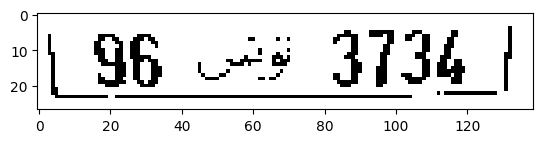

Detected License Plate: 96! 3734}
Processing 51.jpg


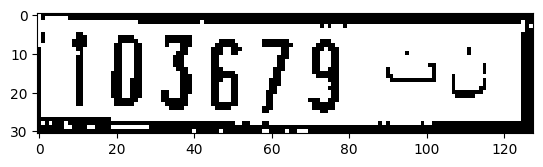

Detected License Plate: 103679 ce
Processing 220.jpg


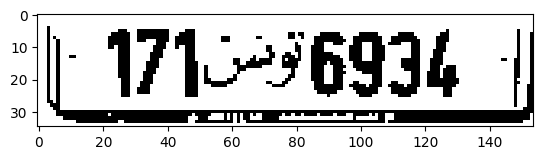

Detected License Plate: 71796934 |
Processing 233.jpg


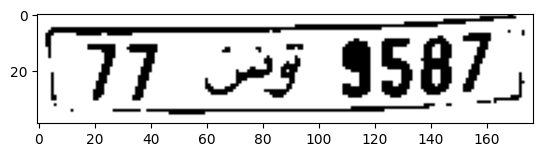

Detected License Plate: (77 oF 9587,
Processing 391.jpg


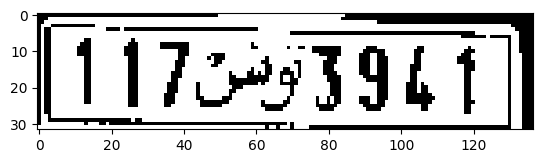

Detected License Plate: 
Processing 781.jpg


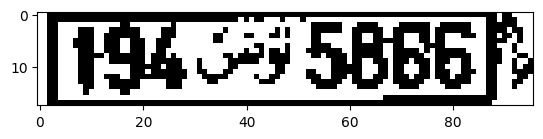

Detected License Plate: 94.59 SBBGFS
Processing 725.jpg


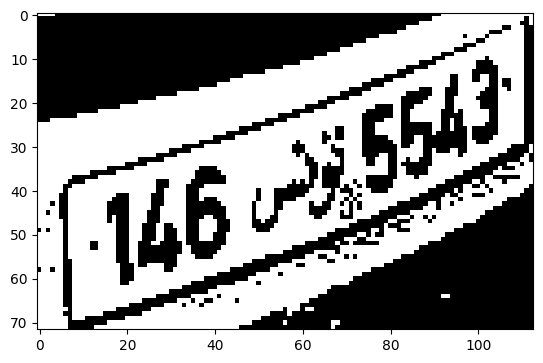

Detected License Plate: 
Processing 199.jpg


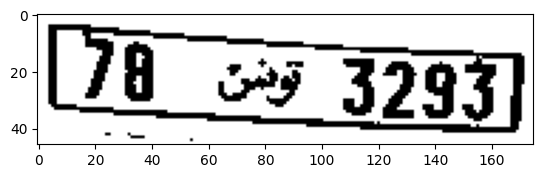

Detected License Plate: 
Processing 26.jpg


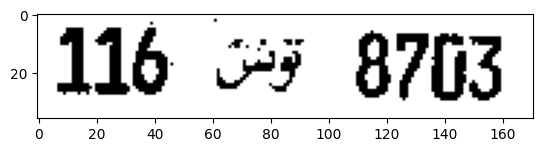

Detected License Plate: 116 35 8703
Processing 301.jpg


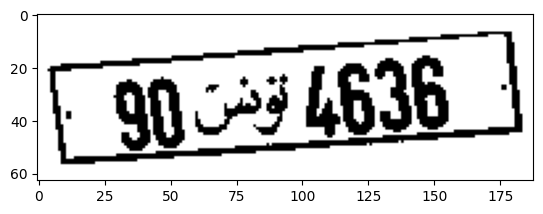

Detected License Plate: 9043 L636_
Processing 132.jpg


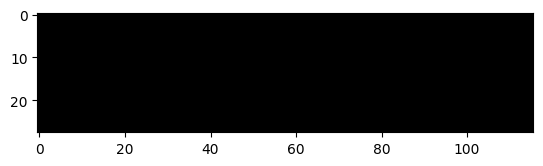

Detected License Plate: OS
Processing 239.jpg


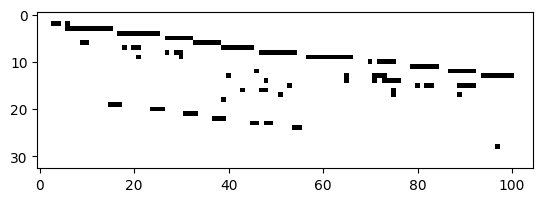

Detected License Plate: TE,
Processing 142.jpg


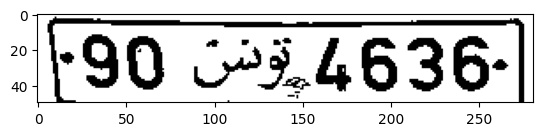

Detected License Plate: -90 5° 9,4636-
Processing 792.jpg


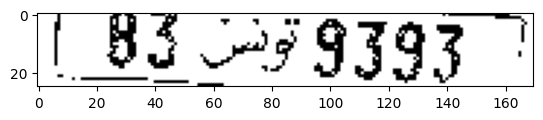

Detected License Plate: | BS 29 9393 !
Processing 137.jpg


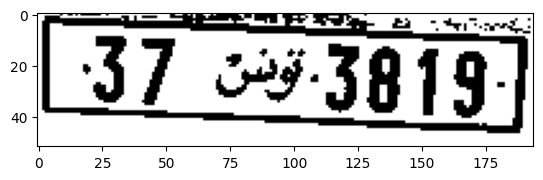

Detected License Plate: 37 29-3919]
Processing 445.jpg


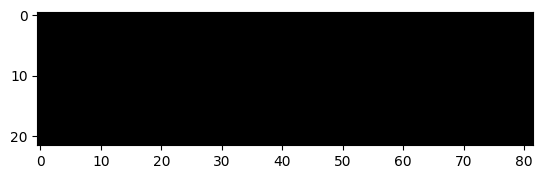

Detected License Plate: OS
Processing 596.jpg


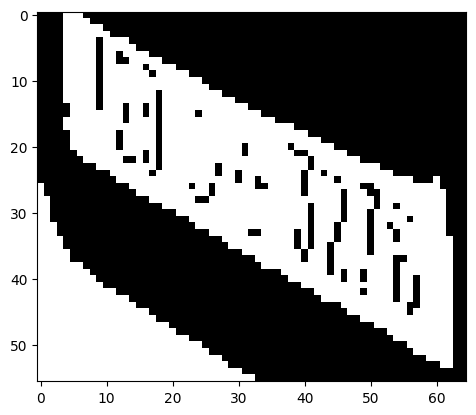

Detected License Plate: me
Processing 122.jpg


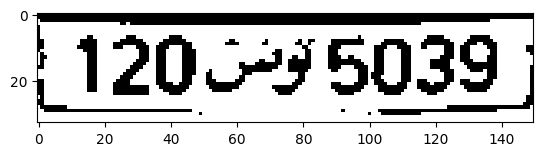

Detected License Plate: 1205475039.
Processing 206.jpg


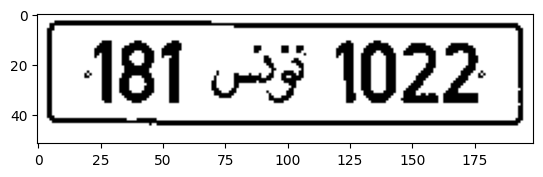

Detected License Plate: 181 1022
Processing 768.jpg


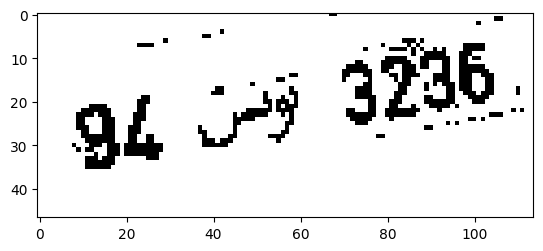

Detected License Plate: gt ci 3288
Processing 465.jpg


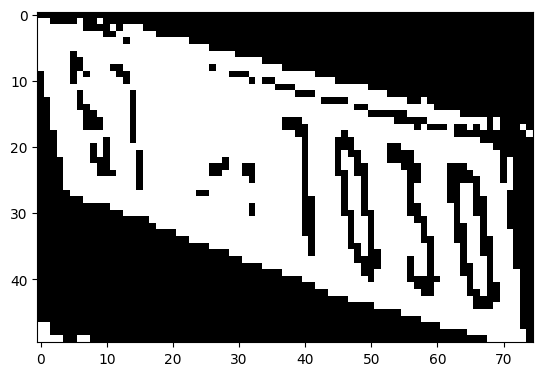

Detected License Plate: BT
Processing 630.jpg


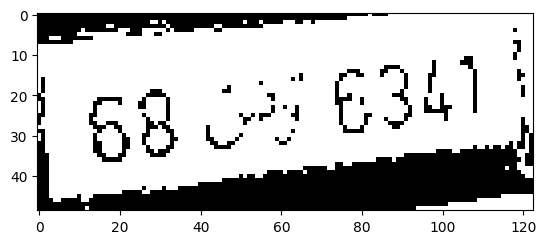

Detected License Plate: 6g ou g3al
Processing 847.jpg


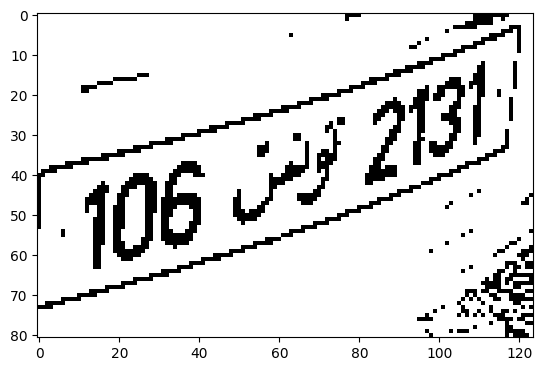

Detected License Plate: 
Processing 776.jpg


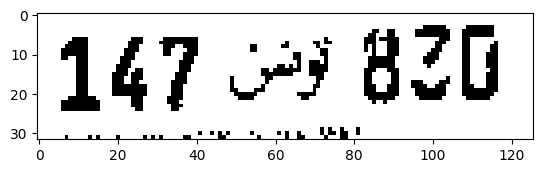

Detected License Plate: 147 3 820
Processing 24.jpg


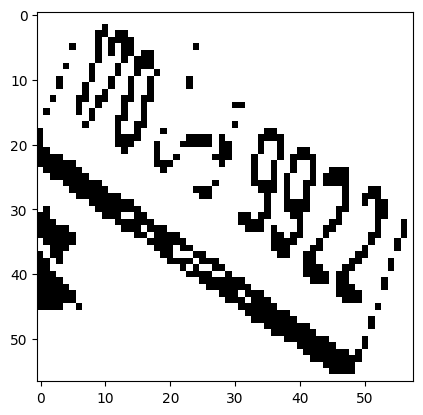

Detected License Plate: 
Processing 605.jpg


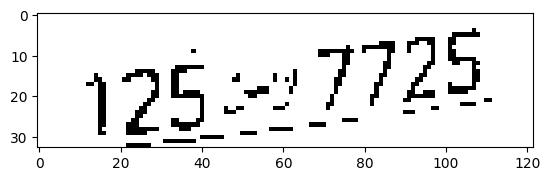

Detected License Plate: 125227728.
Processing 342.jpg


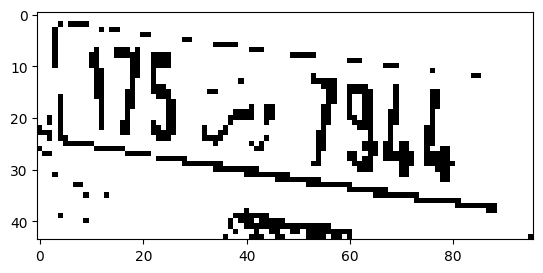

Detected License Plate: 
Processing 786.jpg


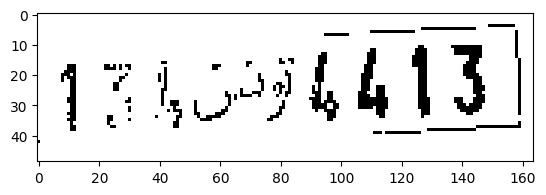

Detected License Plate: 1eEAOGATS |
Processing 156.jpg


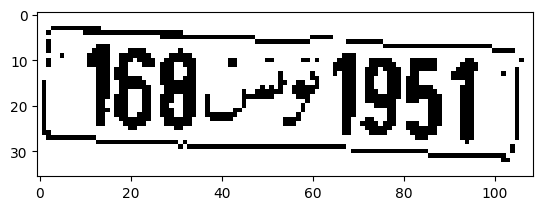

Detected License Plate: 168571957 |
Processing 826.jpg


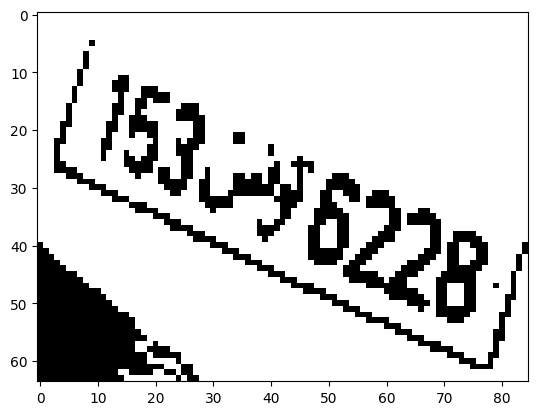

Detected License Plate: 
Processing 168.jpg


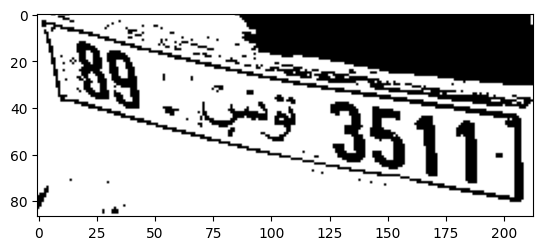

Detected License Plate: 
Processing 861.jpg


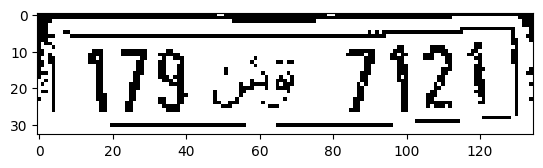

Detected License Plate: VU Ae 7124
Processing 307.jpg


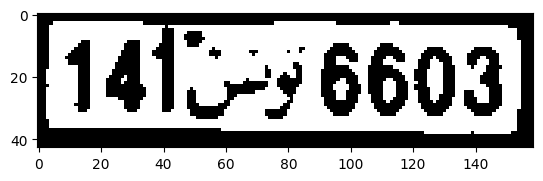

Detected License Plate: 141c-¥ 6603
Processing 431.jpg


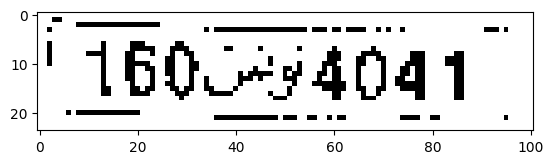

Detected License Plate: "1605494041
Processing 267.jpg


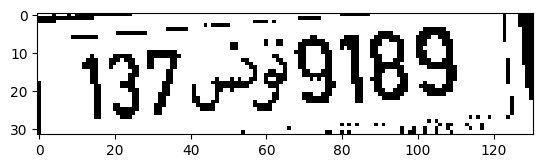

Detected License Plate: 437239189 |
Processing 498.jpg


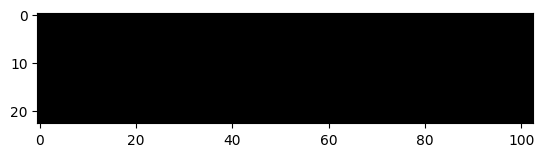

Detected License Plate: OB
Processing 681.jpg


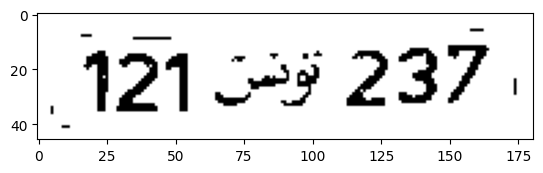

Detected License Plate: 121 8 237)
Processing 810.jpg


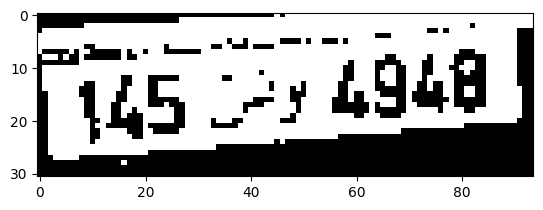

Detected License Plate: r1a5 cy 6908
Processing 692.jpg


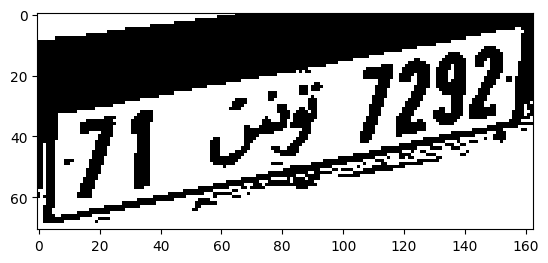

Detected License Plate: 
Processing 822.jpg


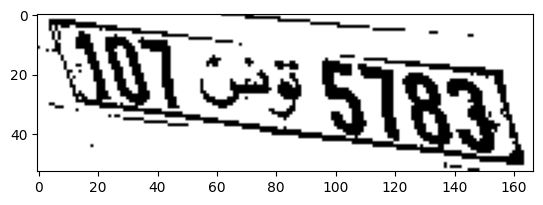

Detected License Plate: 
Processing 197.jpg


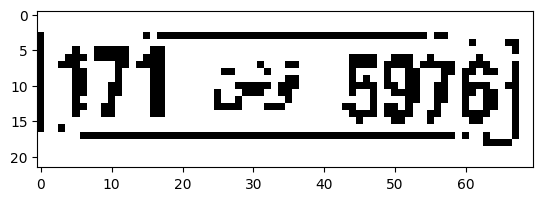

Detected License Plate: 471 oF 5976]
Processing 589.jpg


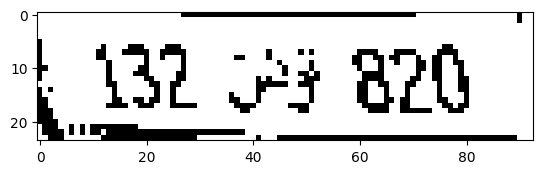

Detected License Plate: 32 289 820
Processing 529.jpg


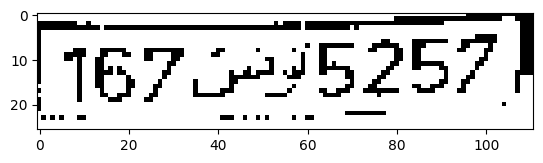

Detected License Plate: M67 235257 |
Processing 851.jpg


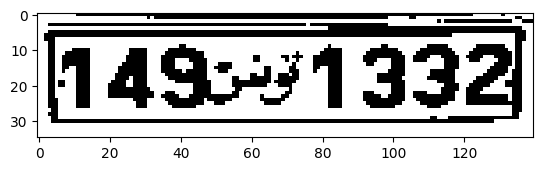

Detected License Plate: 149531332]
Processing 669.jpg


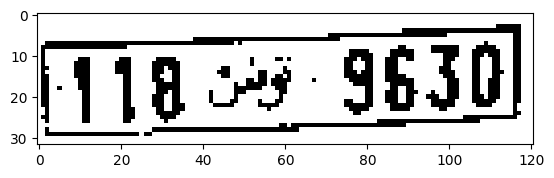

Detected License Plate: (118 +9 9630)
Processing 552.jpg


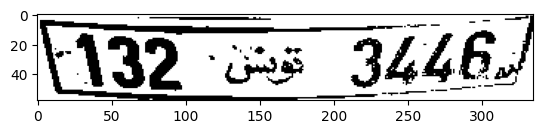

Detected License Plate: (132 cs 3446.)
Processing 14.jpg


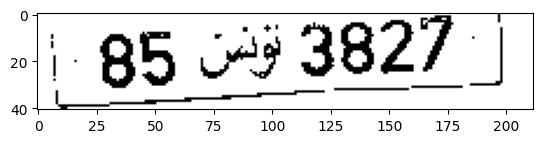

Detected License Plate: i 85 9 3827 ||
Processing 751.jpg


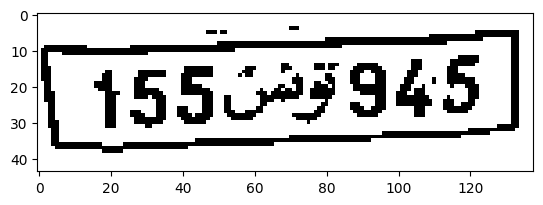

Detected License Plate: 
Processing 830.jpg


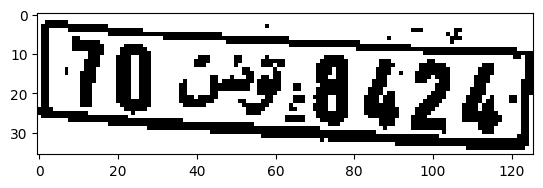

Detected License Plate: TO 9.8496)
Processing 880.jpg


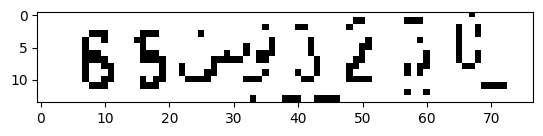

Detected License Plate: Boers 2 ak
Processing 23.jpg


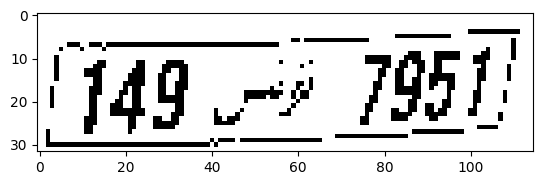

Detected License Plate: [749 re 1951!
Processing 477.jpg


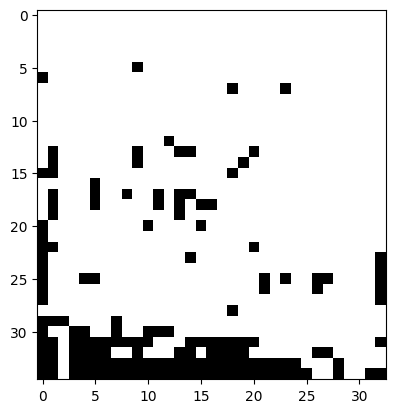

Detected License Plate: 
Processing 263.jpg


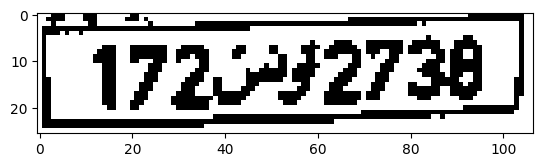

Detected License Plate: 17292738
Processing 803.jpg


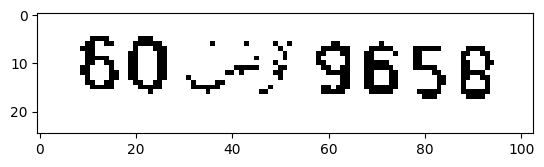

Detected License Plate: 60-7 9658
Processing 693.jpg


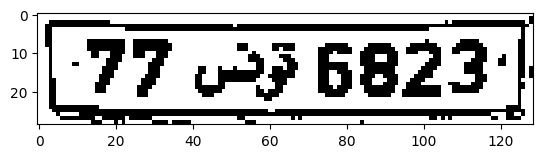

Detected License Plate: (77 35 6823 |
Processing 368.jpg


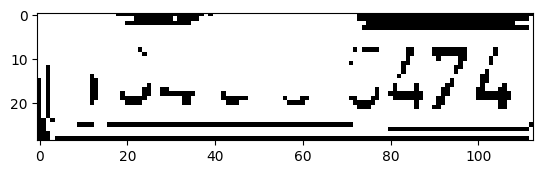

Detected License Plate: [rove 2 SS76
Processing 69.jpg


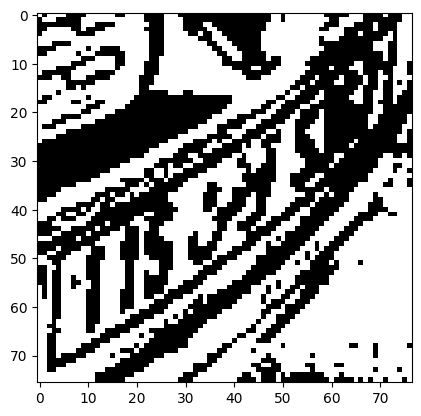

Detected License Plate: 
Processing 202.jpg


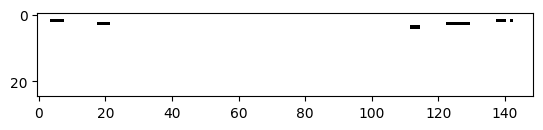

Detected License Plate: 7 7
Processing 685.jpg


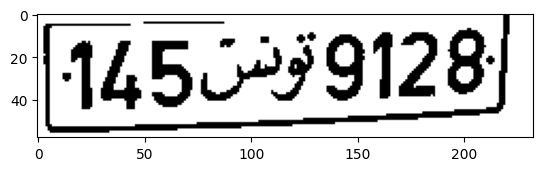

Detected License Plate: 1450499128:
Processing 352.jpg


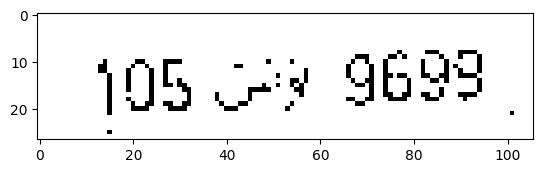

Detected License Plate: 405 ce¥ 9699
Processing 801.jpg


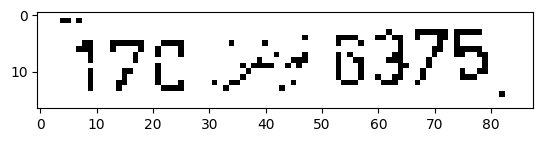

Detected License Plate: 470 48 6375,
Processing 35.jpg


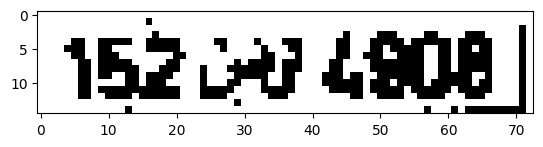

Detected License Plate: 452047 4908 |
Processing 833.jpg


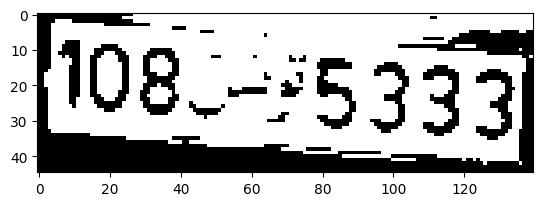

Detected License Plate: 108-3533
Processing 488.jpg


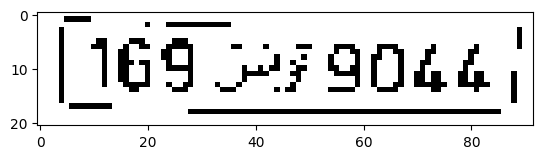

Detected License Plate: [169 327 9044;
Processing 320.jpg


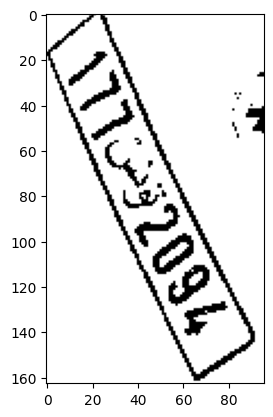

Detected License Plate: 
Processing 645.jpg


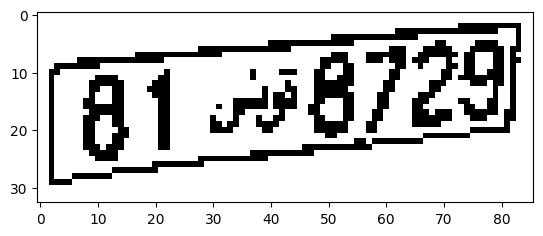

Detected License Plate: a1 38729
Processing 205.jpg


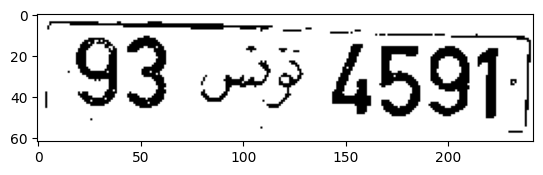

Detected License Plate: 93 > 4591
Processing 102.jpg


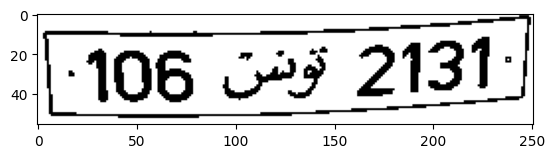

Detected License Plate: 106 649 2131:
Processing 125.jpg


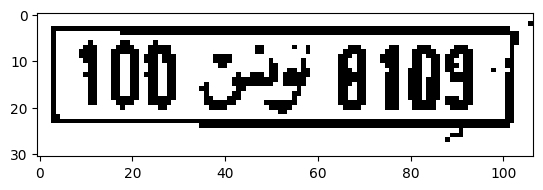

Detected License Plate: 100 AF 8109
Processing 252.jpg


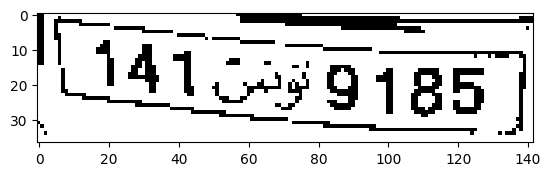

Detected License Plate: ater tes
Processing 598.jpg


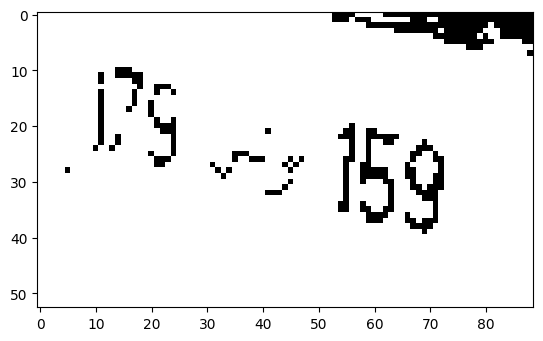

Detected License Plate: 
Processing 862.jpg


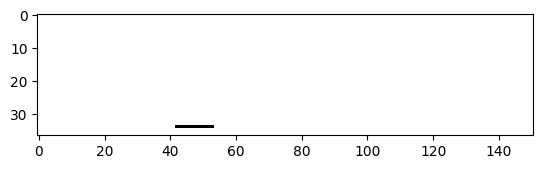

Detected License Plate: _
Processing 246.jpg


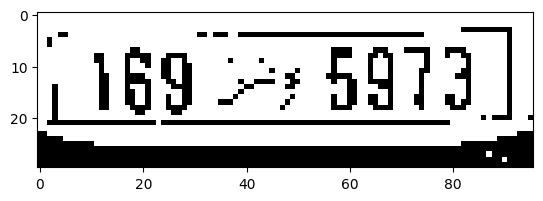

Detected License Plate: L169 7 5973 ]
Processing 624.jpg


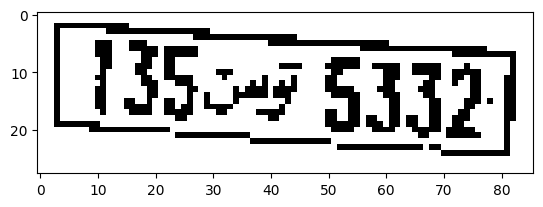

Detected License Plate: 135547 S332
Processing 717.jpg


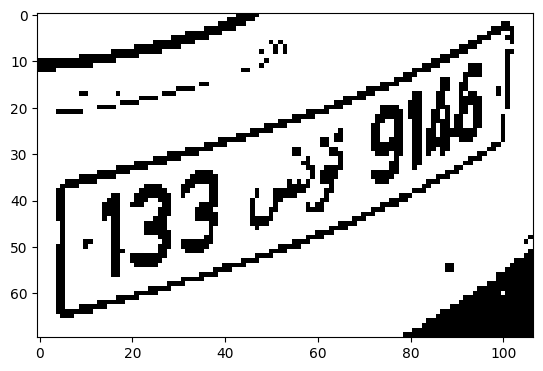

Detected License Plate: 
Processing 549.jpg


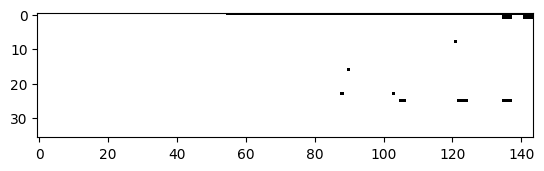

Detected License Plate: .:
Processing 615.jpg


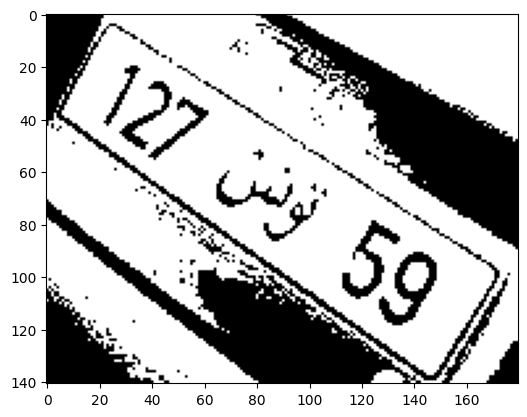

Detected License Plate: SS
Processing 573.jpg


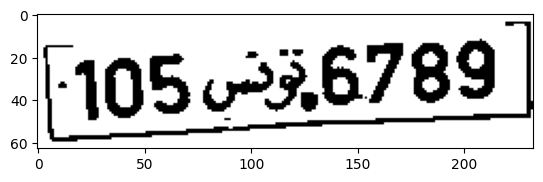

Detected License Plate: 105 .9.6789
Processing 545.jpg


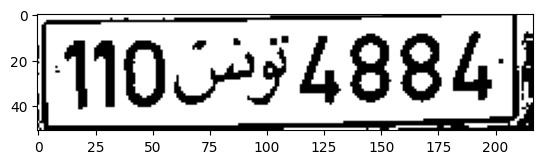

Detected License Plate: N0c434884)}
Processing 487.jpg


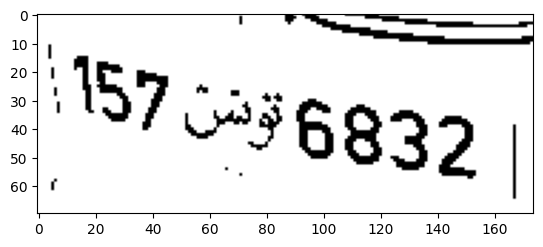

Detected License Plate: 387 36832 |
Processing 805.jpg


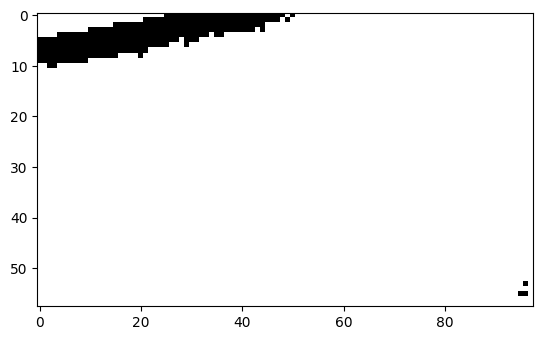

Detected License Plate: ——
Processing 254.jpg


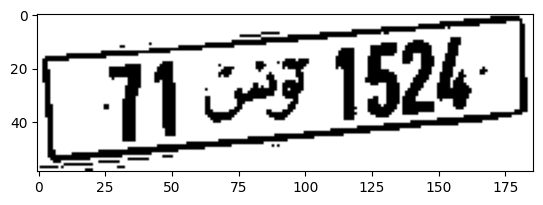

Detected License Plate: 
Processing 428.jpg


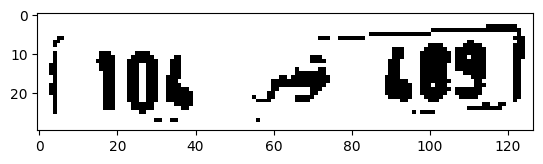

Detected License Plate: {106 > 63)
Processing 654.jpg


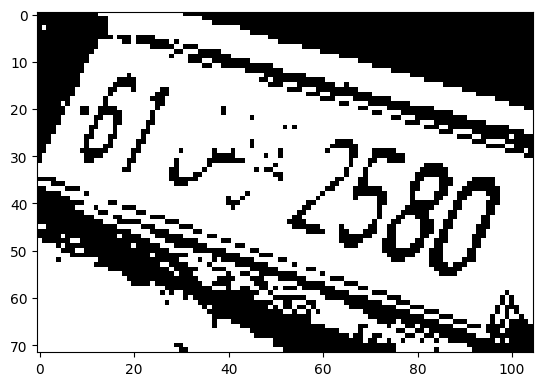

Detected License Plate: 
Processing 440.jpg


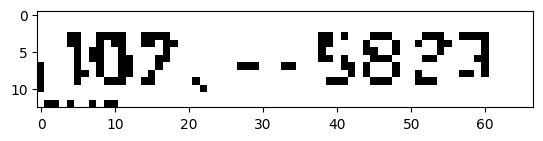

Detected License Plate: 17, -- S822
Processing 476.jpg


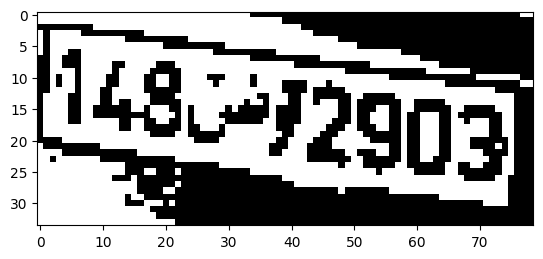

Detected License Plate: 48572995]
Processing 434.jpg


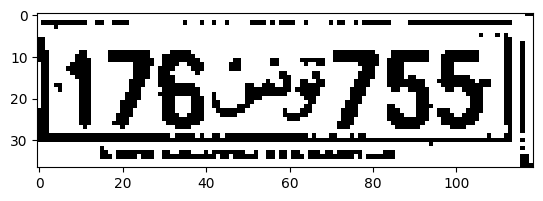

Detected License Plate: 176-9755
Processing 779.jpg


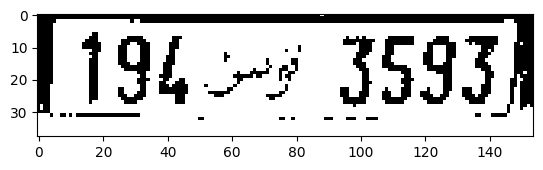

Detected License Plate: L194--¥ 3593)
Processing 458.jpg


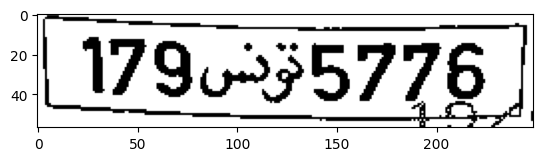

Detected License Plate: | 179255776 |
Processing 200.jpg


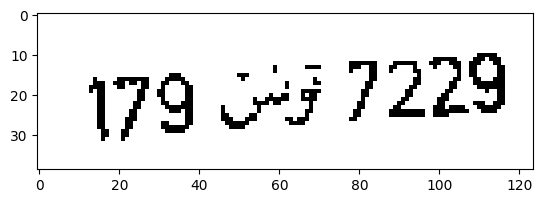

Detected License Plate: 179 9 7229
Processing 870.jpg


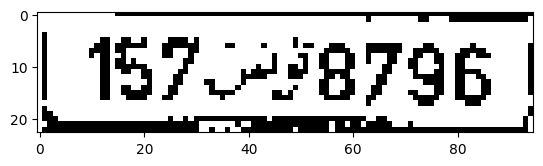

Detected License Plate: | 157438796 |
Processing 63.jpg


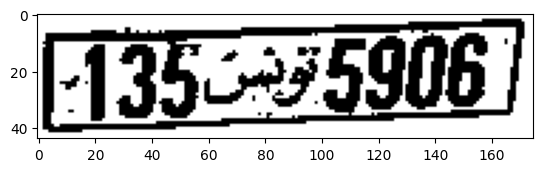

Detected License Plate: 
Processing 841.jpg


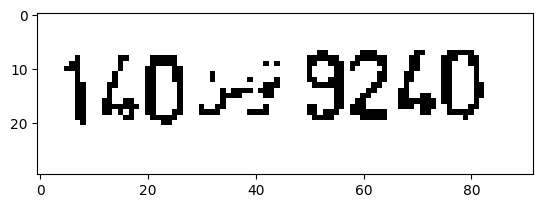

Detected License Plate: 1405-7 9260
Processing 16.jpg


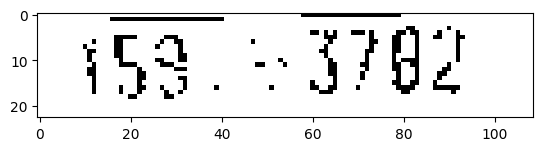

Detected License Plate: 459. 3782
Processing 425.jpg


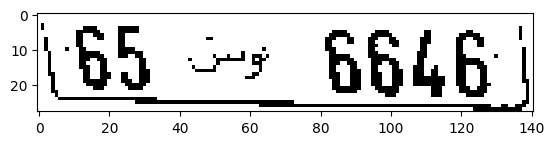

Detected License Plate: 85 +» 6646
Processing 744.jpg


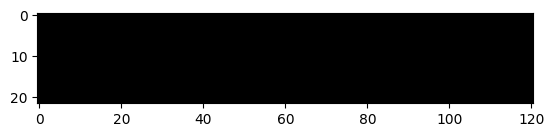

Detected License Plate: Be
Processing 738.jpg


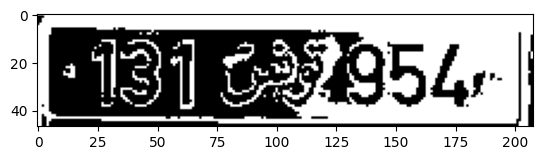

Detected License Plate: GS 2s..-|
Processing 460.jpg


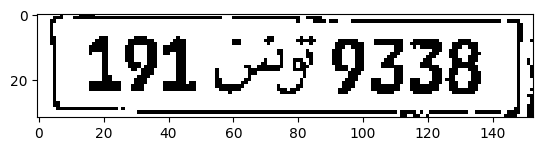

Detected License Plate: [191 343 9338 |
Processing 198.jpg


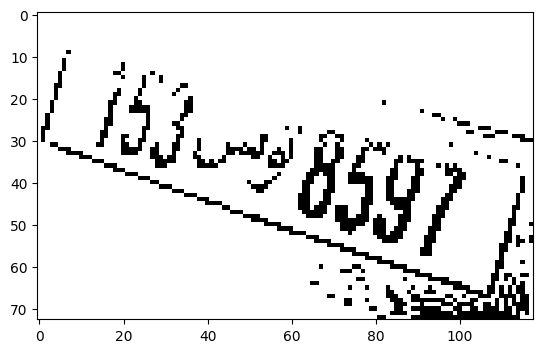

Detected License Plate: 
Processing 373.jpg


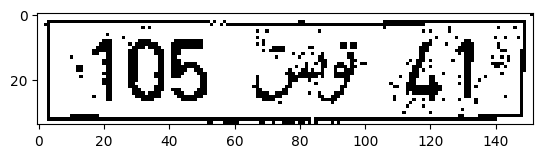

Detected License Plate: 405 4 AF
Processing 461.jpg


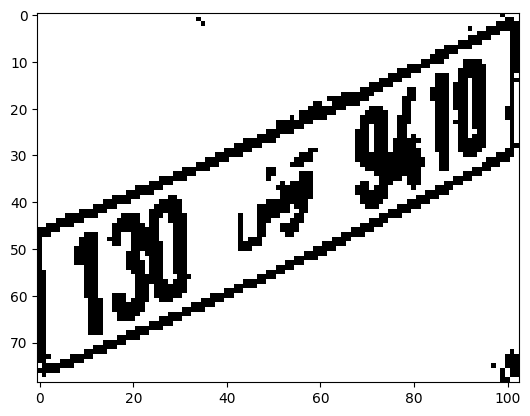

Detected License Plate: 
Processing 210.jpg


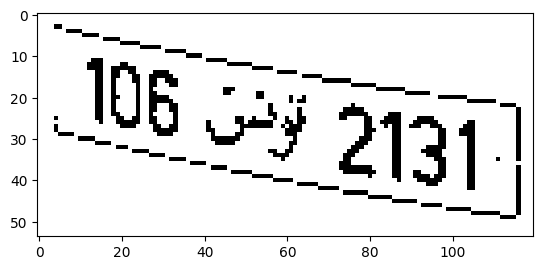

Detected License Plate: Sa
Processing 195.jpg


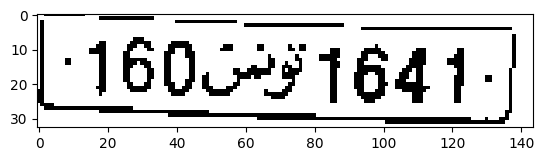

Detected License Plate: 160551641.
Processing 47.jpg


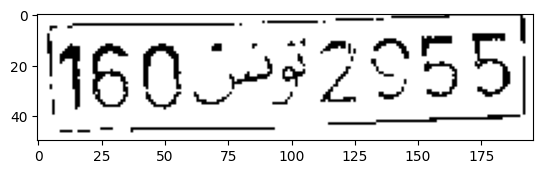

Detected License Plate: 4600982055)
Processing 165.jpg


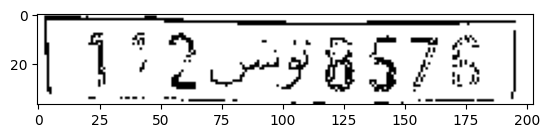

Detected License Plate: 
Processing 429.jpg


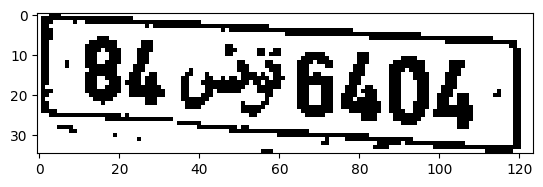

Detected License Plate: 
Processing 346.jpg


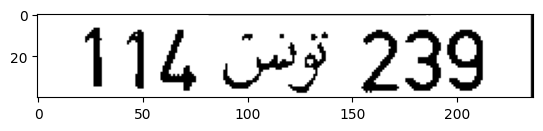

Detected License Plate: 114 563 239 -
Processing 39.jpg


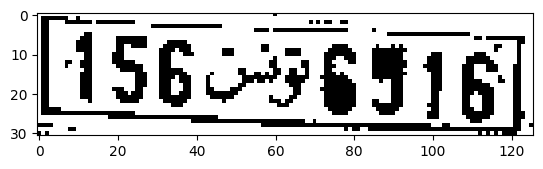

Detected License Plate: S56 O5 6 516
Processing 323.jpg


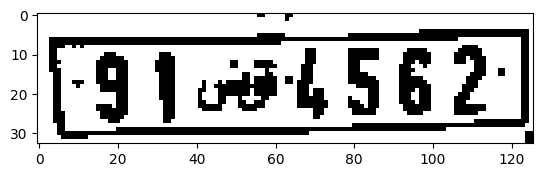

Detected License Plate: "9194 562)
Processing 788.jpg


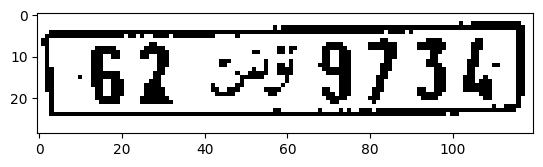

Detected License Plate: 62 99734
Processing 271.jpg


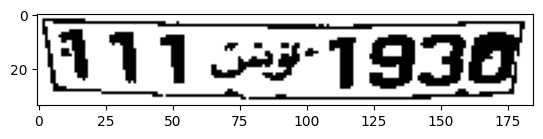

Detected License Plate: Wi osT938
Processing 728.jpg


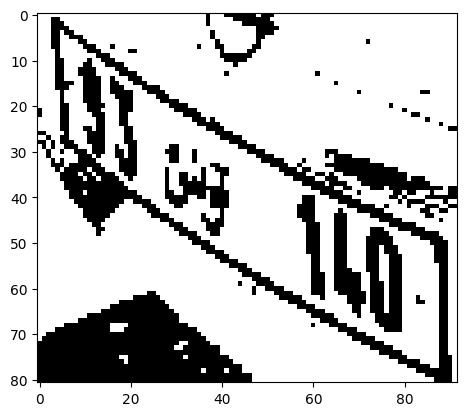

Detected License Plate: 
Processing 221.jpg


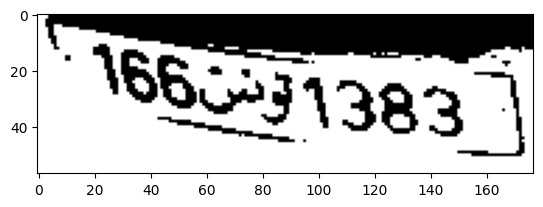

Detected License Plate: E1383 |
Processing 547.jpg


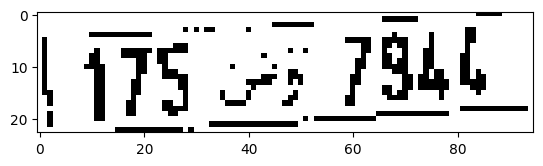

Detected License Plate: L475 2 7SAM
Processing 128.jpg


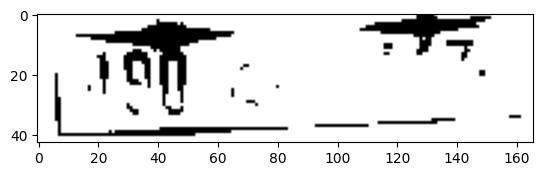

Detected License Plate: wr
Processing 226.jpg


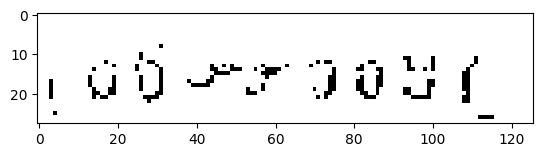

Detected License Plate: (aderdgaug
Processing 249.jpg


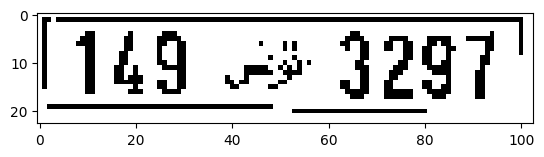

Detected License Plate: 1149 3 3297
Processing 419.jpg


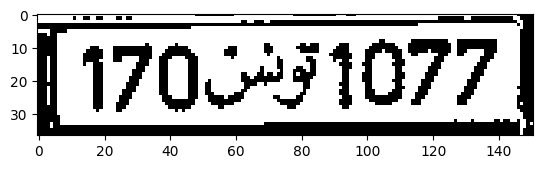

Detected License Plate: 1 1702451077 |
Processing 643.jpg


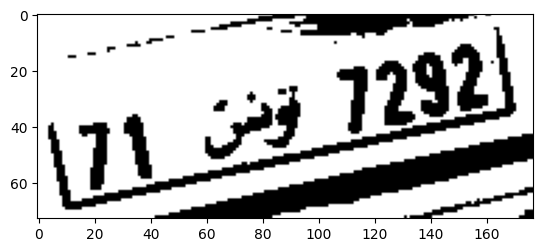

Detected License Plate: 
Processing 697.jpg


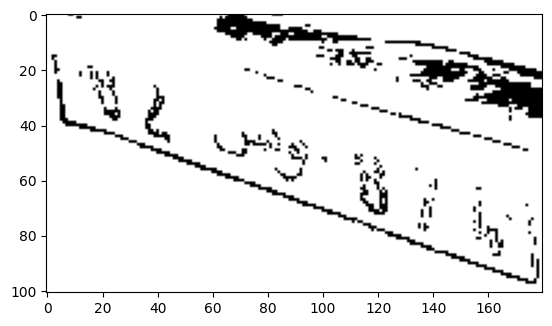

Detected License Plate: 
Processing 706.jpg


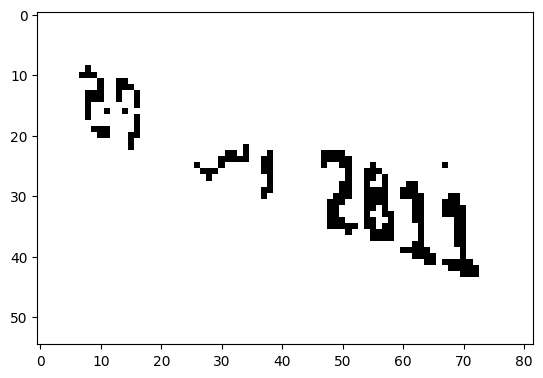

Detected License Plate: a 2
Processing 770.jpg


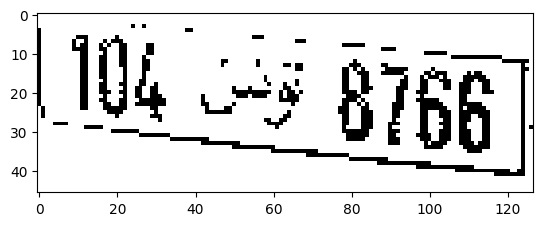

Detected License Plate: Ik SF 8768
Processing 392.jpg


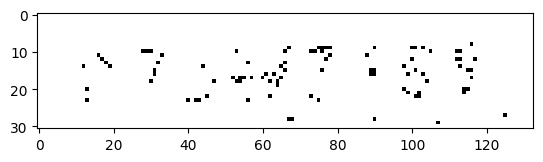

Detected License Plate: SPs F189
Processing 294.jpg


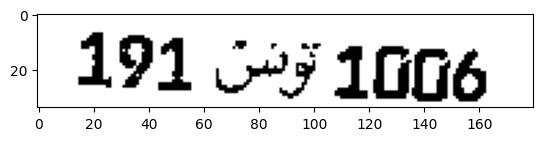

Detected License Plate: 191 31666
Processing 158.jpg


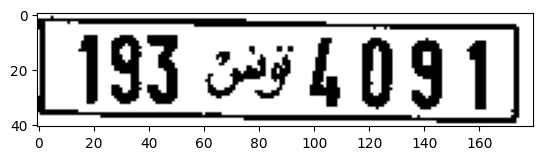

Detected License Plate: 193 74091
Processing 769.jpg


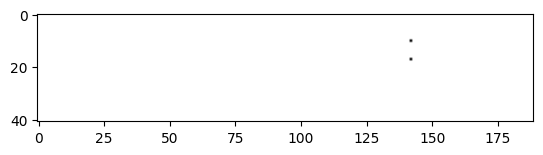

Detected License Plate: BS
Processing 555.jpg


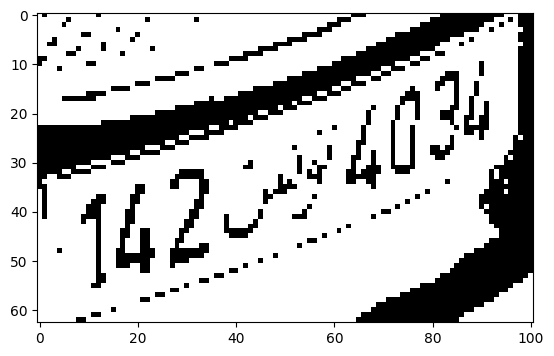

Detected License Plate: 
Processing 512.jpg


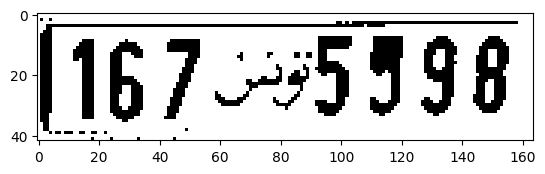

Detected License Plate: (1675455998
Processing 686.jpg


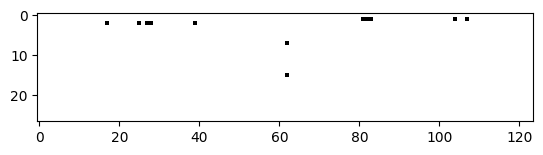

Detected License Plate: |
Processing 153.jpg


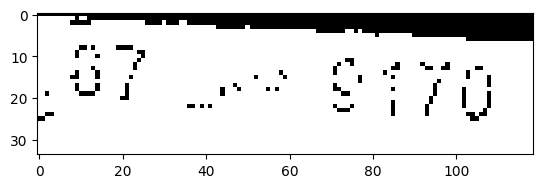

Detected License Plate: BF we 87g
Processing 394.jpg


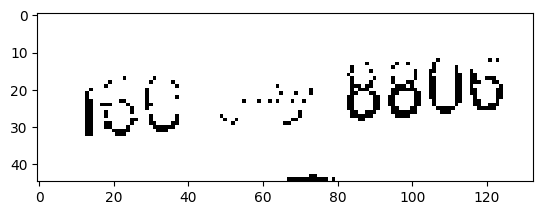

Detected License Plate: BE oy 8805
Processing 584.jpg


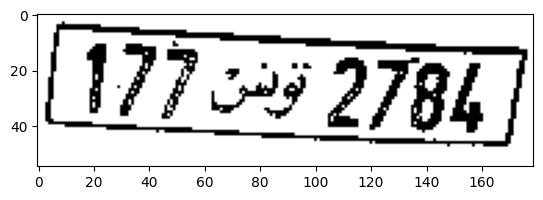

Detected License Plate: 177 229 D78h
Processing 807.jpg


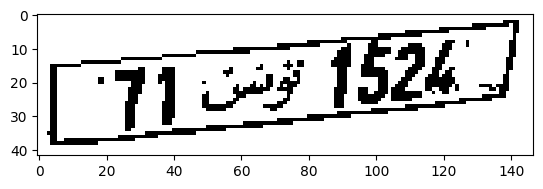

Detected License Plate: 
Processing 558.jpg


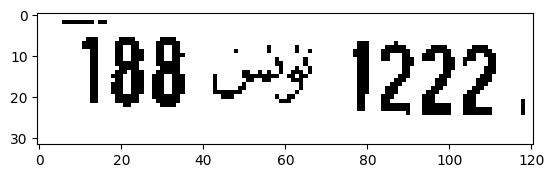

Detected License Plate: 188 os 1222,
Processing 296.jpg


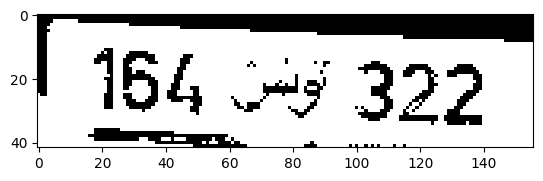

Detected License Plate: 184 24¥ 322
Processing 647.jpg


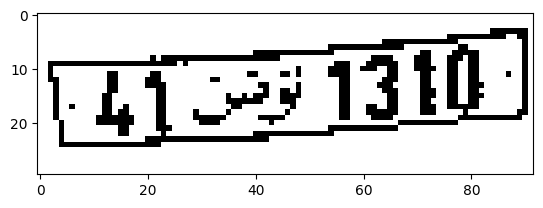

Detected License Plate: 
Processing 893.jpg


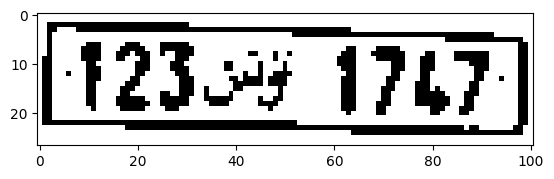

Detected License Plate: 
Processing 526.jpg


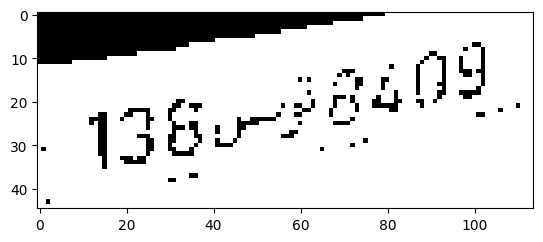

Detected License Plate: 136-2822
Processing 62.jpg


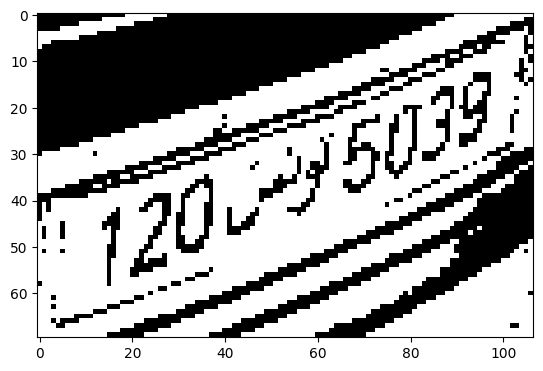

Detected License Plate: 
Processing 345.jpg


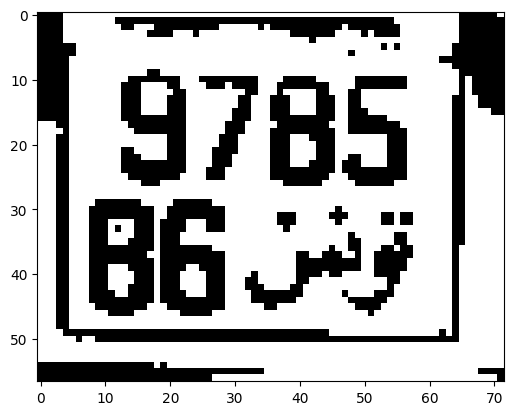

Detected License Plate: 
Processing 885.jpg


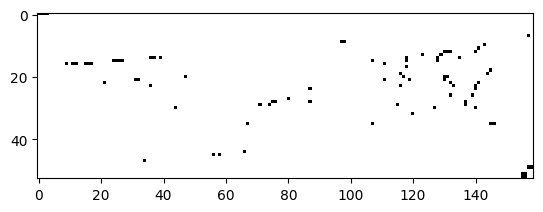

Detected License Plate: 
Processing 111.jpg


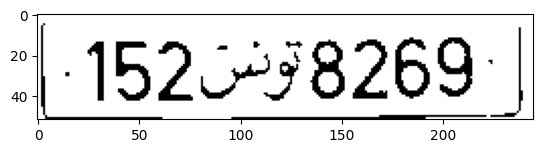

Detected License Plate: 152438269 |
Processing 48.jpg


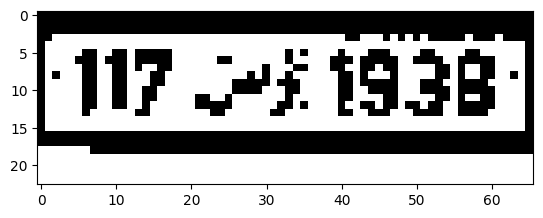

Detected License Plate: W773 5938.
Processing 581.jpg


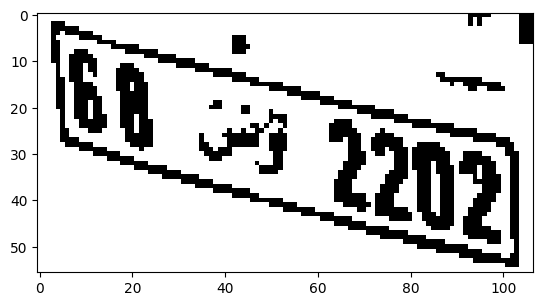

Detected License Plate: Te
Processing 0.jpg


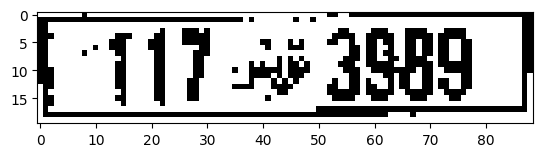

Detected License Plate: 117 +5 3989
Processing 103.jpg


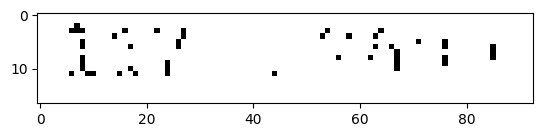

Detected License Plate: 
Processing 338.jpg


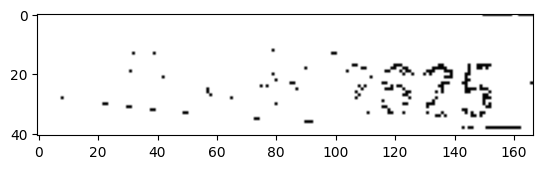

Detected License Plate: 
Processing 724.jpg


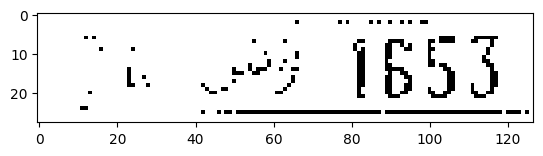

Detected License Plate: 
Processing 309.jpg


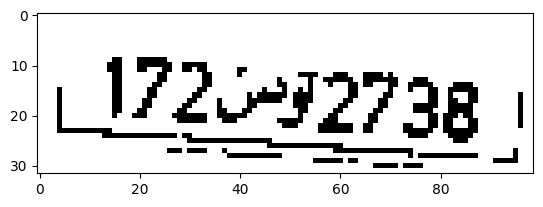

Detected License Plate: 1725-92738 |
Processing 718.jpg


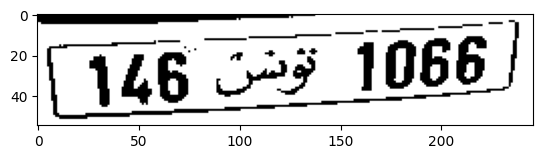

Detected License Plate: 146 027 1066
Processing 586.jpg


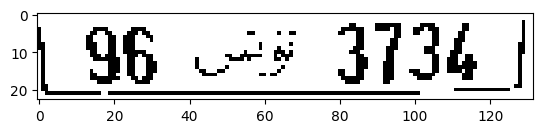

Detected License Plate: | 96 2 3734 |
Processing 95.jpg


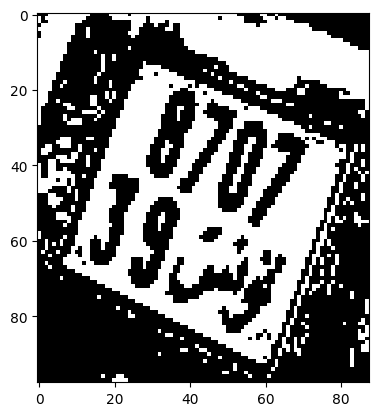

Detected License Plate: i)
Processing 754.jpg


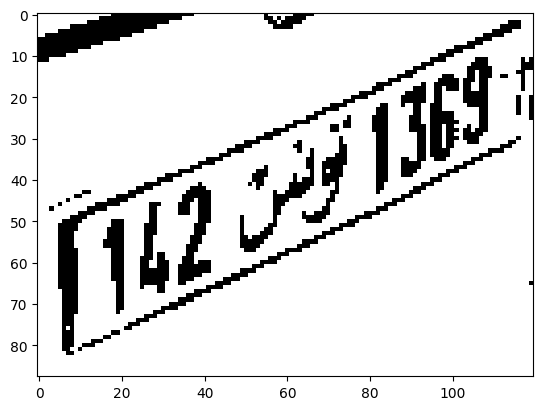

Detected License Plate: 
Processing 533.jpg


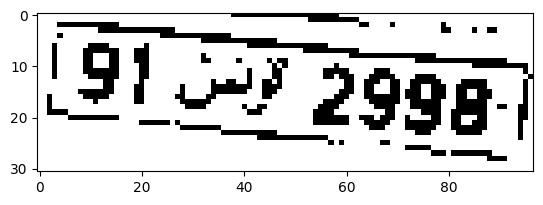

Detected License Plate: 19: 13 39981
Processing 470.jpg


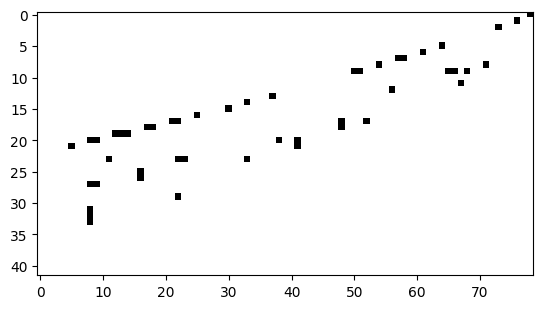

Detected License Plate: ;
Processing 606.jpg


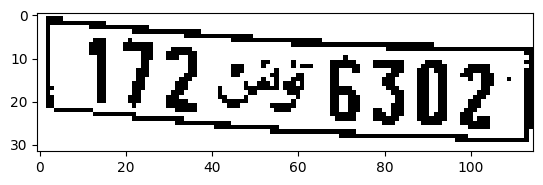

Detected License Plate: 
Processing 838.jpg


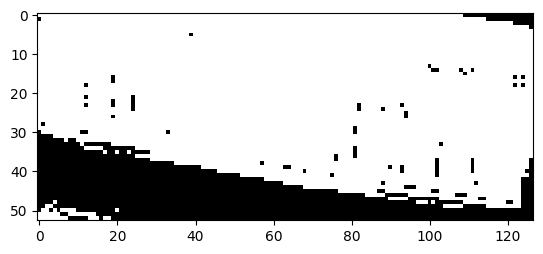

Detected License Plate: 
Processing 897.jpg


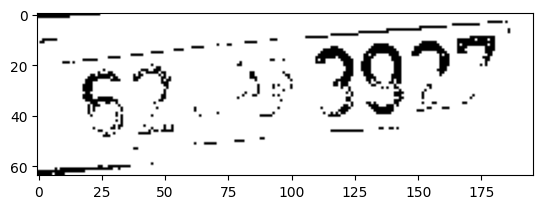

Detected License Plate: B53 3927
Processing 853.jpg


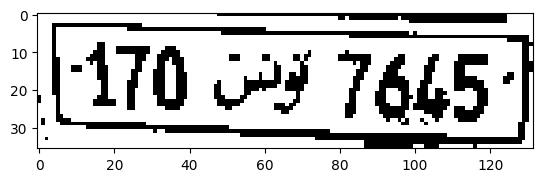

Detected License Plate: 
Processing 401.jpg


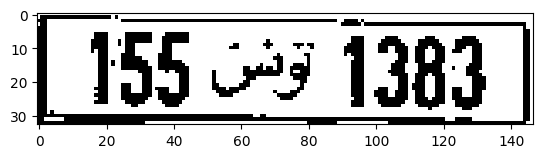

Detected License Plate: 155 9 1383
Processing 635.jpg


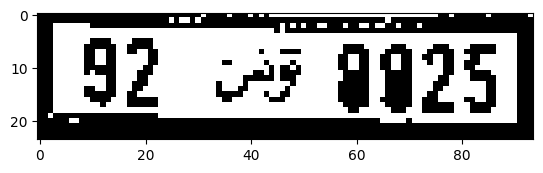

Detected License Plate: 92 9925
Processing 650.jpg


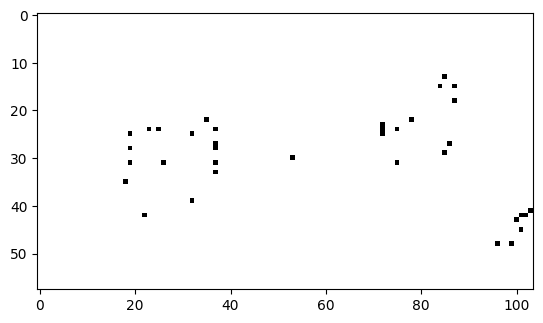

Detected License Plate: a
Processing 811.jpg


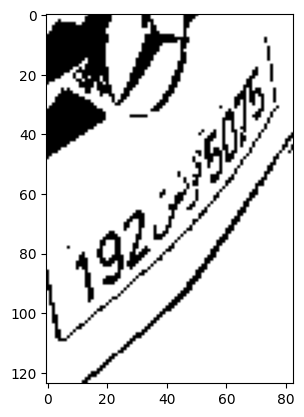

Detected License Plate: 
Processing 673.jpg


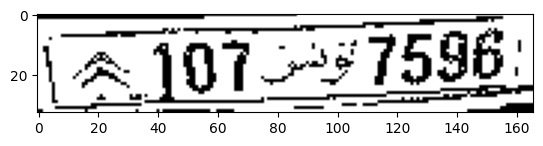

Detected License Plate: 
Processing 5.jpg


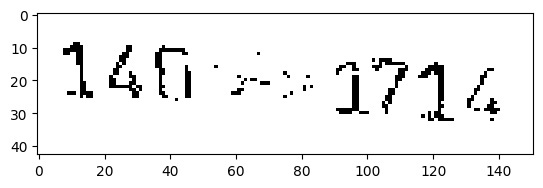

Detected License Plate: Vas 9714
Processing 882.jpg


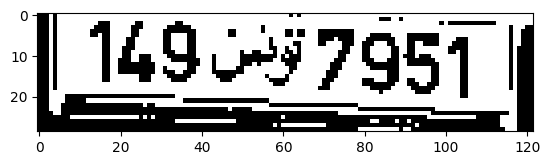

Detected License Plate: | 149. 97951 |
Processing 183.jpg


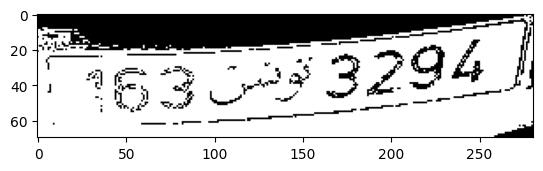

Detected License Plate: 
Processing 213.jpg


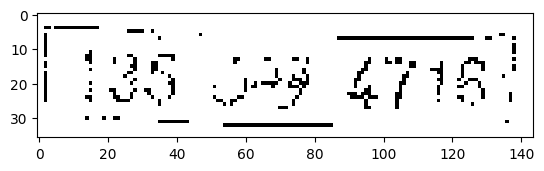

Detected License Plate: [125 cay GPR!
Processing 121.jpg


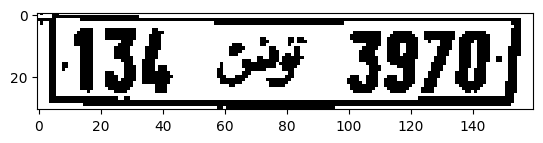

Detected License Plate: 136 o¥ 3970;
Processing 8.jpg


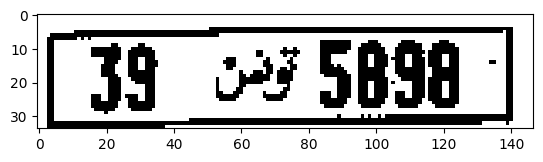

Detected License Plate: 39 oF 5898
Processing 518.jpg


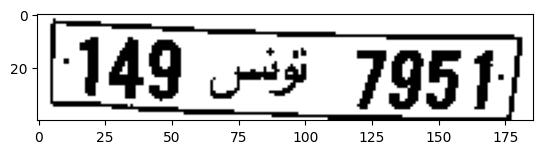

Detected License Plate: 149 5 7951,
Processing 244.jpg


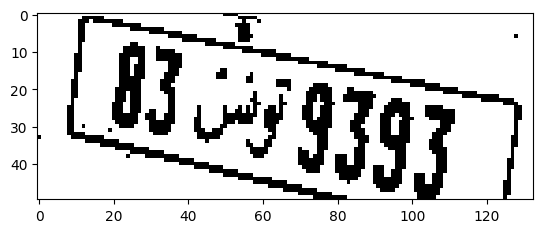

Detected License Plate: 
Processing 783.jpg


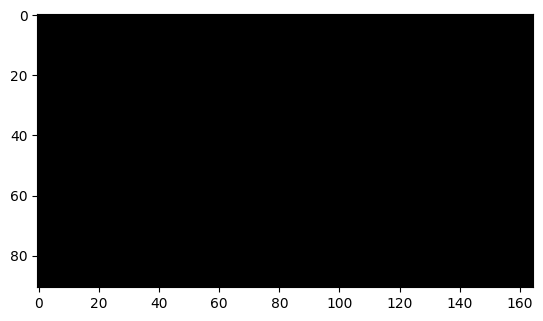

Detected License Plate: oe
Processing 157.jpg


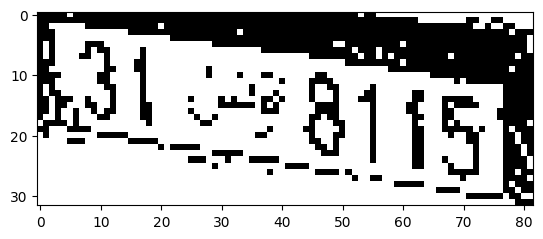

Detected License Plate: SRE.
Processing 304.jpg


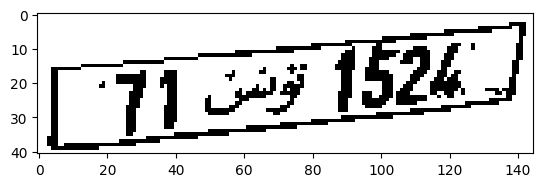

Detected License Plate: 
Processing 886.jpg


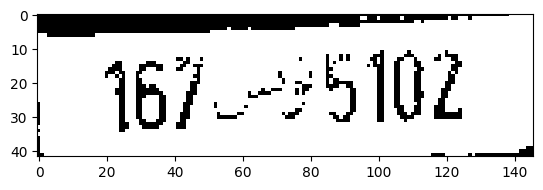

Detected License Plate: -467-F5102
Processing 173.jpg


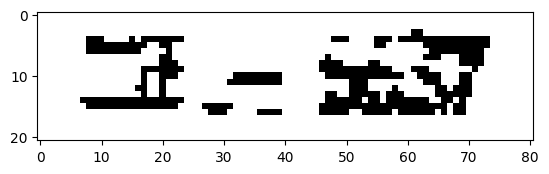

Detected License Plate: a- sa
Processing 218.jpg


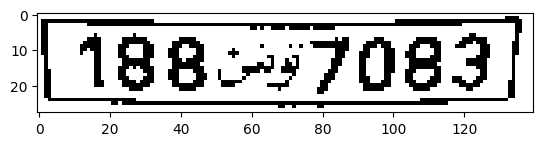

Detected License Plate: 188.-97083
Processing 528.jpg


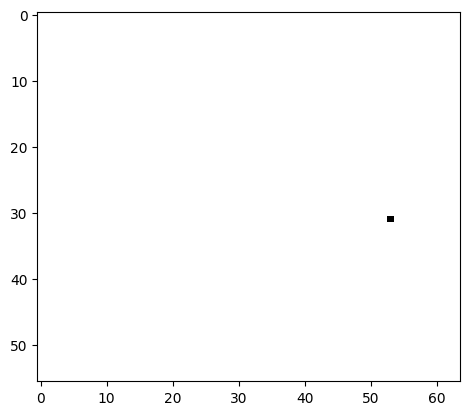

Detected License Plate: a
Processing 714.jpg


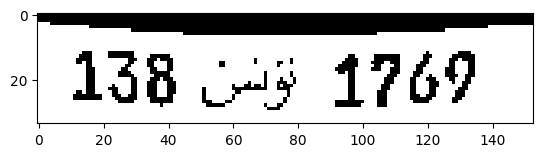

Detected License Plate: 138 245 1769
Processing 649.jpg


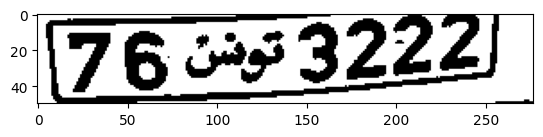

Detected License Plate: 76 433224)
Processing 135.jpg


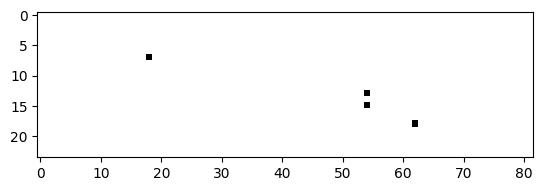

Detected License Plate: an
Processing 610.jpg


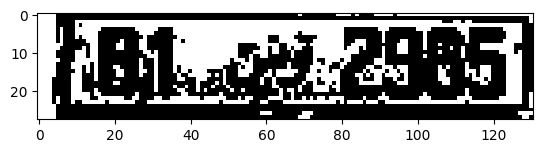

Detected License Plate: 
Processing 403.jpg


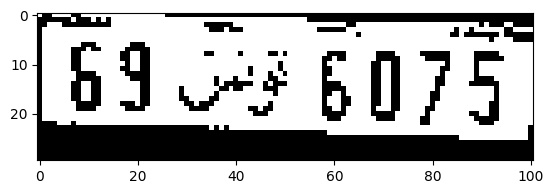

Detected License Plate: 69 3 6075
Processing 234.jpg


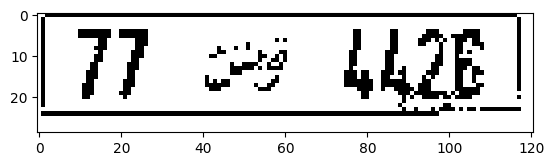

Detected License Plate: a7 3 UAE |
Processing 411.jpg


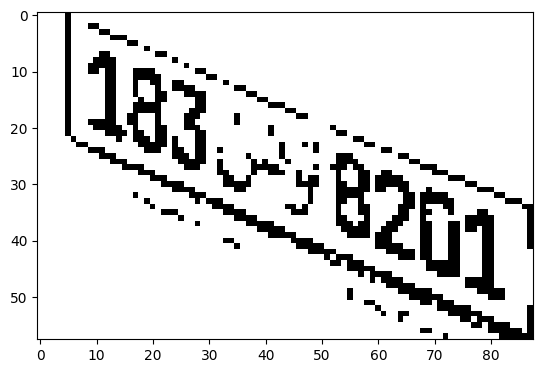

Detected License Plate: See:
Processing 369.jpg


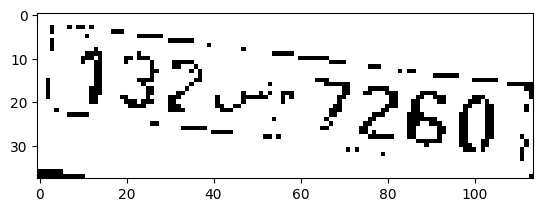

Detected License Plate: T2365
Processing 10.jpg


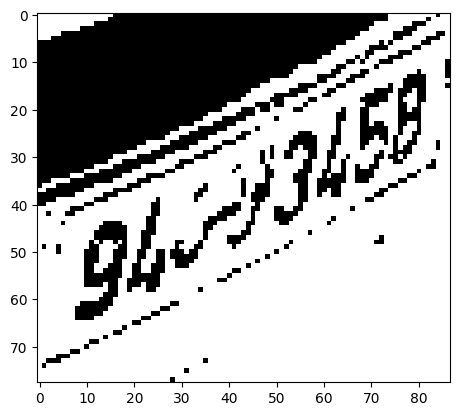

Detected License Plate: 
Processing 612.jpg


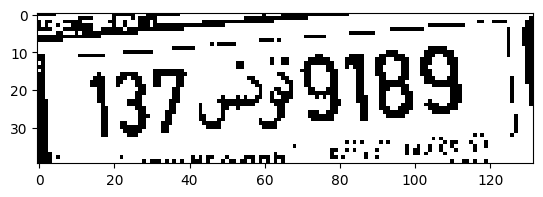

Detected License Plate: 
Processing 442.jpg


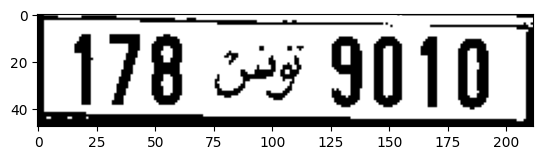

Detected License Plate: 178 37 9010 |
Processing 485.jpg


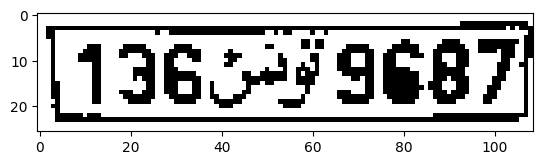

Detected License Plate: 1362-9 9687]
Processing 424.jpg


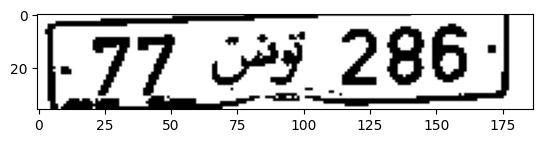

Detected License Plate: E77 o3_286)
Processing 583.jpg


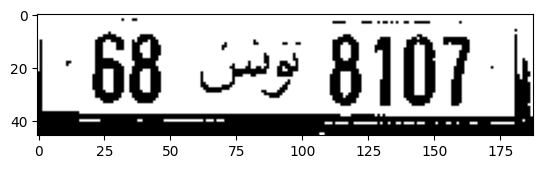

Detected License Plate: 68 » 8107 |
Processing 177.jpg


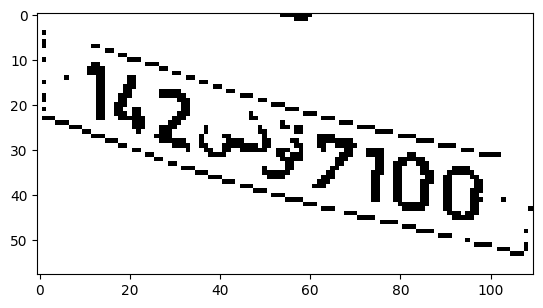

Detected License Plate: 
Processing 151.jpg


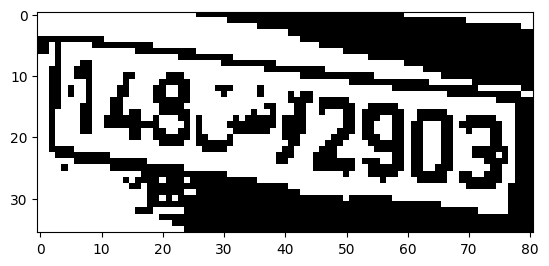

Detected License Plate: 48372993]
Processing 44.jpg


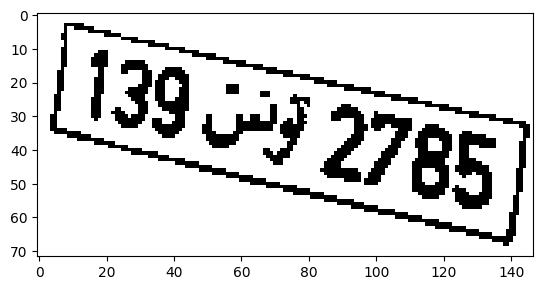

Detected License Plate: 
Processing 124.jpg


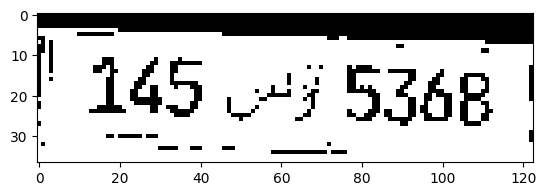

Detected License Plate: M465 7 5368 |
Processing 350.jpg


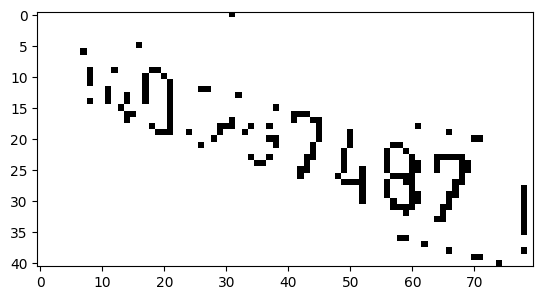

Detected License Plate: Magy
Processing 329.jpg


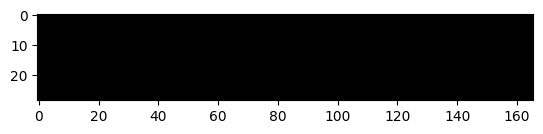

Detected License Plate: re
Processing 557.jpg


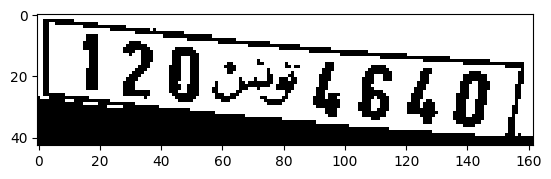

Detected License Plate: 
Processing 259.jpg


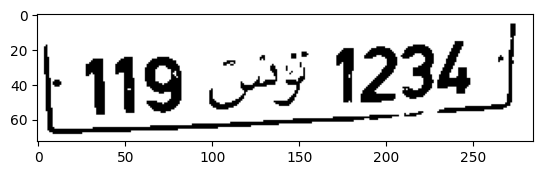

Detected License Plate: 119 69 1234]
Processing 105.jpg


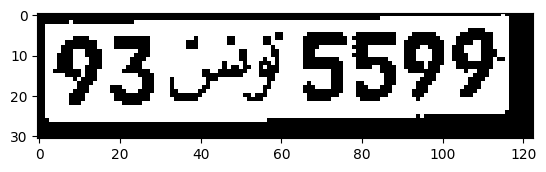

Detected License Plate: 935 5599}
Processing 799.jpg


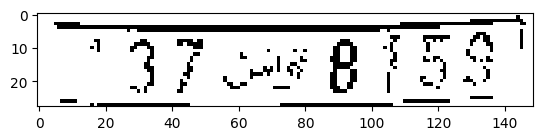

Detected License Plate: 37 oe 85S!
Processing 377.jpg


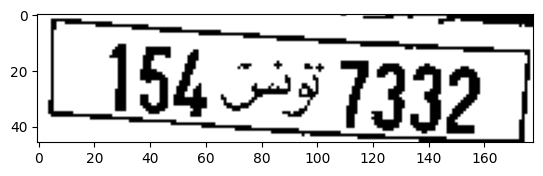

Detected License Plate: 
Processing 691.jpg


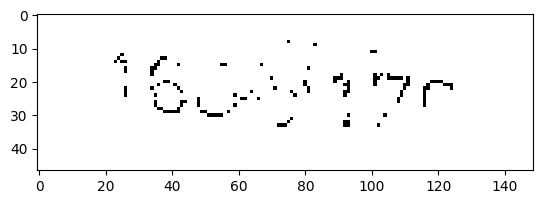

Detected License Plate: “Bes ae
Processing 657.jpg


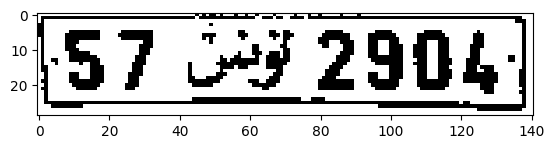

Detected License Plate: 
Processing 565.jpg


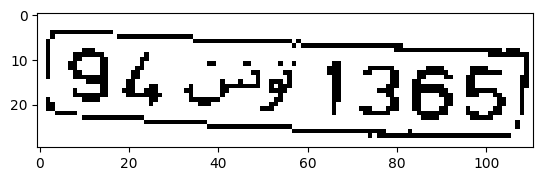

Detected License Plate: (84 9 1365)
Processing 574.jpg


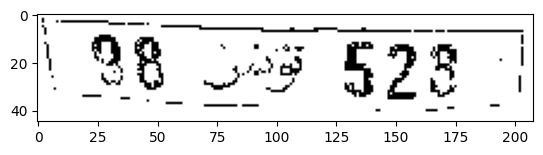

Detected License Plate: 198 Las 928 |
Processing 767.jpg


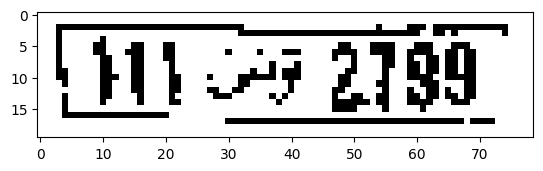

Detected License Plate: CH 9 2789"
Processing 314.jpg


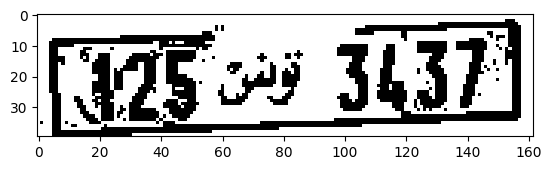

Detected License Plate: 
Processing 883.jpg


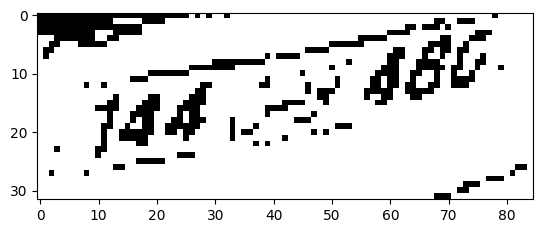

Detected License Plate: ree
Processing 677.jpg


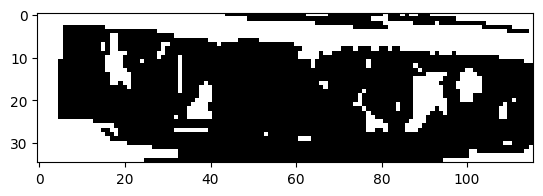

Detected License Plate: q Py aston
Processing 735.jpg


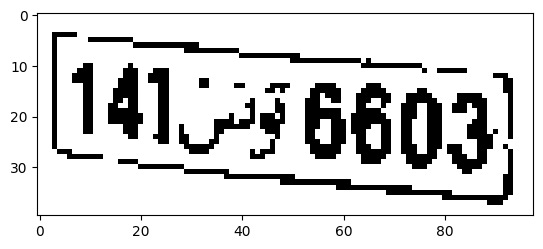

Detected License Plate: (a176809)
Processing 570.jpg


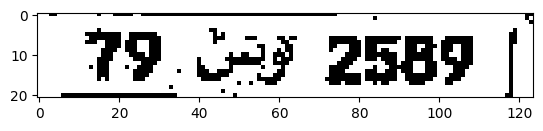

Detected License Plate: 79. CAF 2589 |
Processing 297.jpg


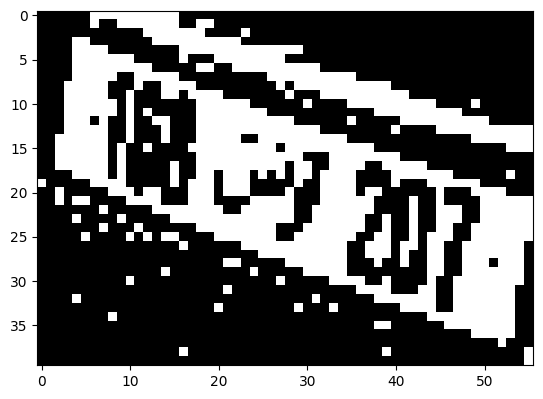

Detected License Plate: 
Processing 858.jpg


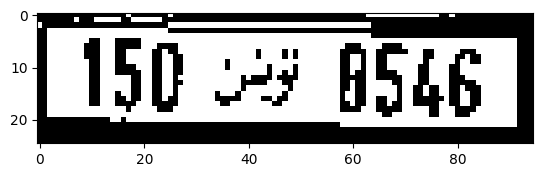

Detected License Plate: 150 23 S46
Processing 378.jpg


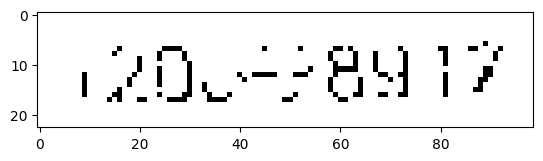

Detected License Plate: 120289 1
Processing 446.jpg


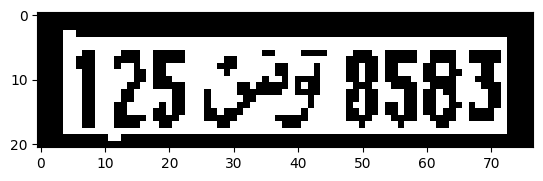

Detected License Plate: 125.379 8583)
Processing 554.jpg


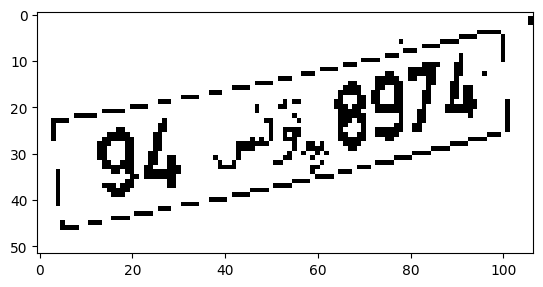

Detected License Plate: i SE
Processing 860.jpg


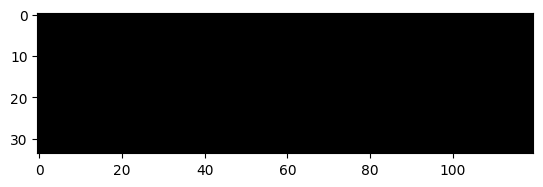

Detected License Plate: So
Processing 640.jpg


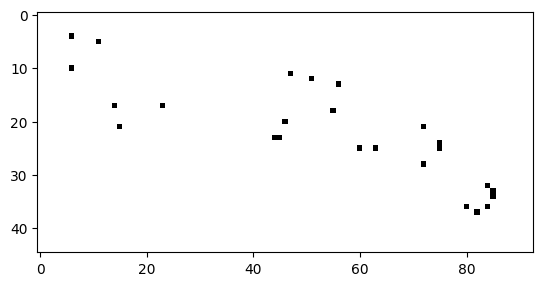

Detected License Plate: :
Processing 540.jpg


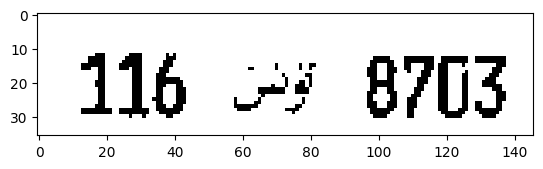

Detected License Plate: 116 > 8703
Processing 354.jpg


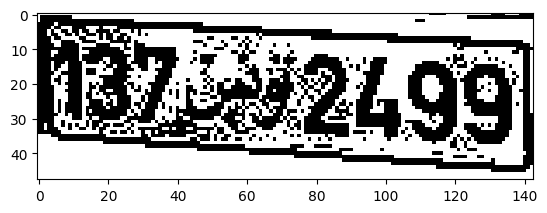

Detected License Plate: 
Processing 67.jpg


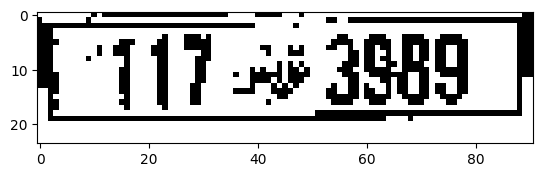

Detected License Plate: L117 26 3889
Processing 452.jpg


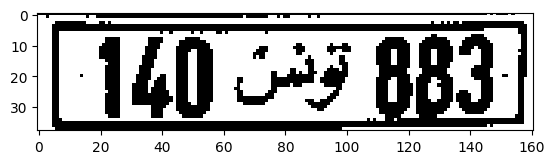

Detected License Plate: (16023 8834
Processing 283.jpg


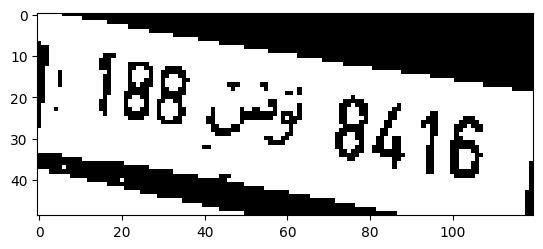

Detected License Plate: os aig.
Processing 617.jpg


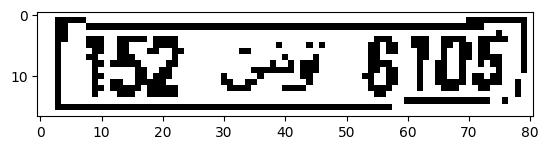

Detected License Plate: P52 F610!
Processing 327.jpg


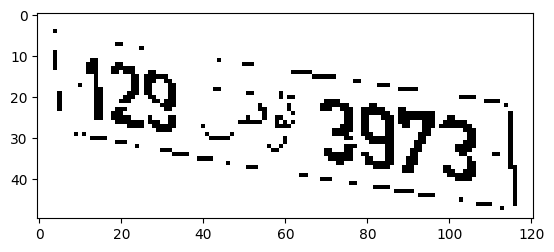

Detected License Plate: ' 8 F973)
Processing 275.jpg


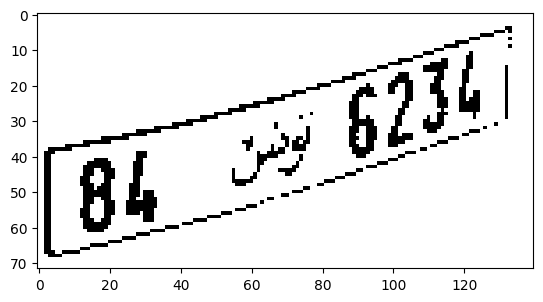

Detected License Plate: 84 pit
Processing 700.jpg


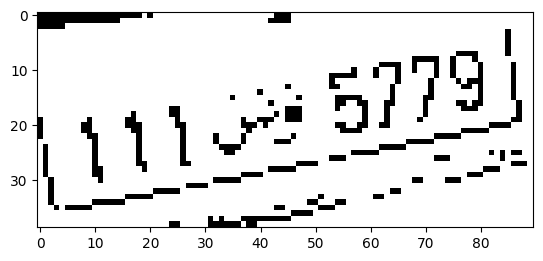

Detected License Plate: 
Processing 242.jpg


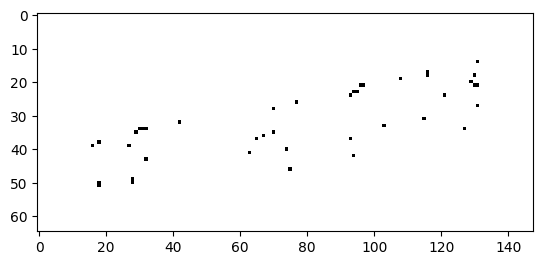

Detected License Plate: 
Processing 679.jpg


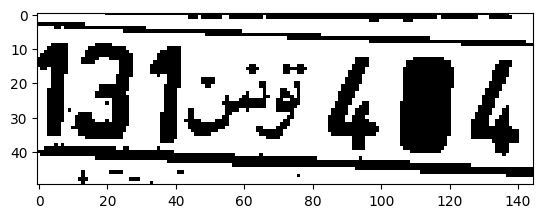

Detected License Plate: 
Processing 536.jpg


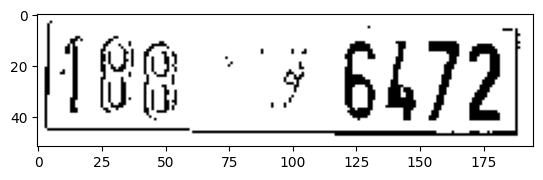

Detected License Plate: (18 ¥ 6472|
Processing 25.jpg


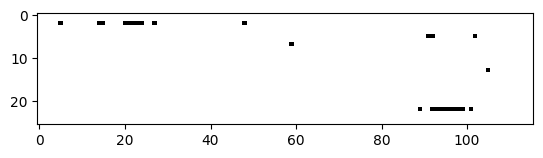

Detected License Plate: _
Processing 219.jpg


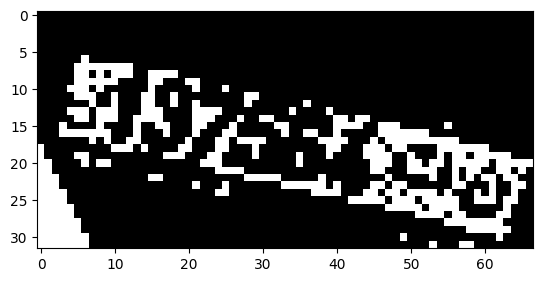

Detected License Plate: Vargas
Processing 27.jpg


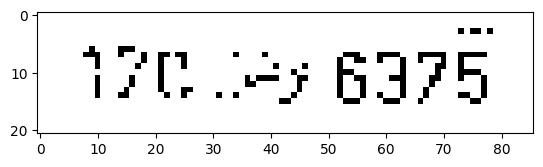

Detected License Plate: 420y 8975
Processing 288.jpg


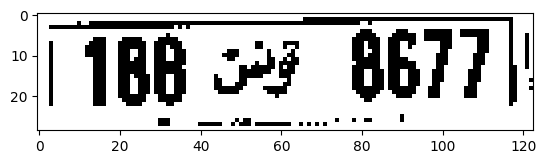

Detected License Plate: (186 <7 8677]
Processing 747.jpg


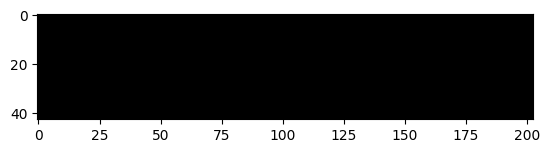

Detected License Plate: BS
Processing 798.jpg


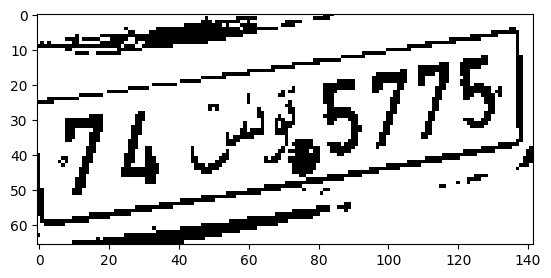

Detected License Plate: 74519
Processing 28.jpg


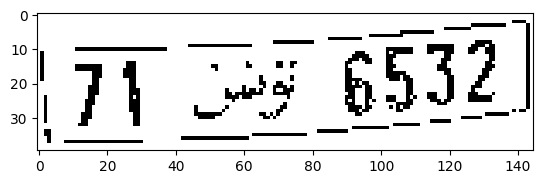

Detected License Plate: Ty oF 6532)
Processing 145.jpg


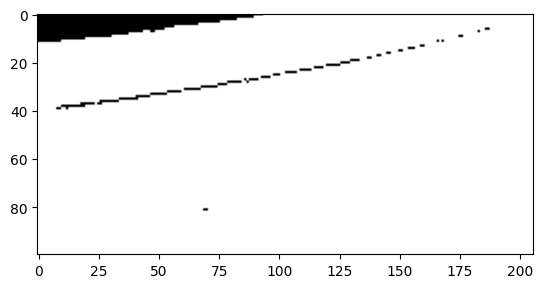

Detected License Plate: a ~
Processing 561.jpg


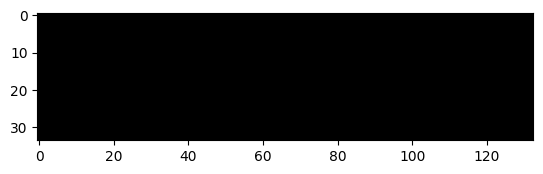

Detected License Plate: Se
Processing 313.jpg


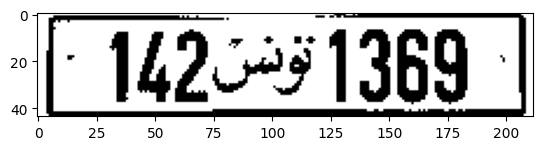

Detected License Plate: - 142543 1369 -
Processing 784.jpg


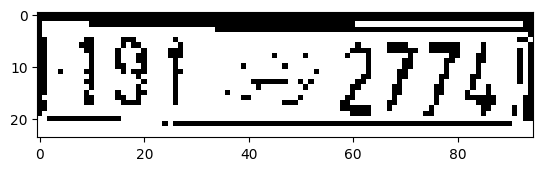

Detected License Plate: HUST > 2774!
Processing 659.jpg


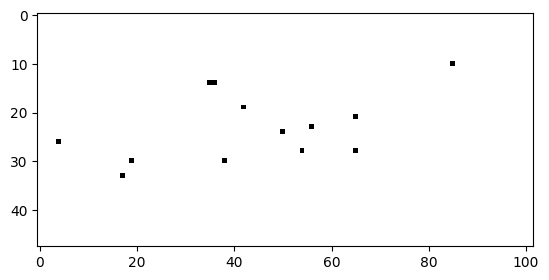

Detected License Plate: oe
Processing 622.jpg


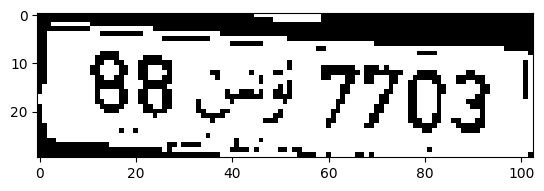

Detected License Plate: 88 57703 |
Processing 81.jpg


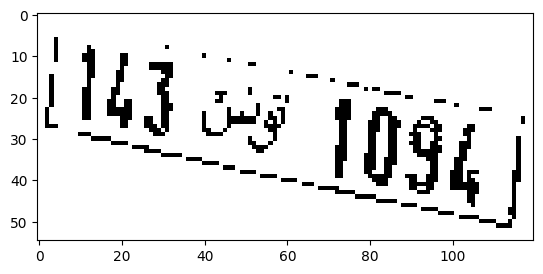

Detected License Plate: do iggy,
Processing 49.jpg


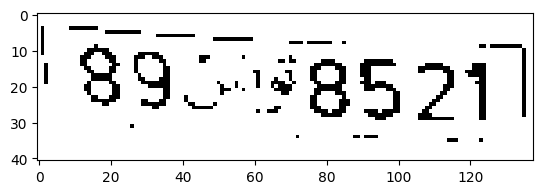

Detected License Plate: 892985271
Processing 585.jpg


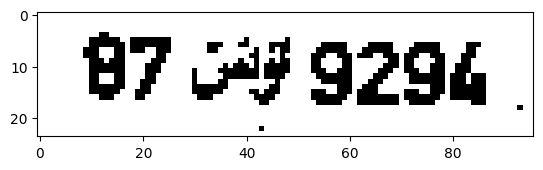

Detected License Plate: 87 49.9294
Processing 188.jpg


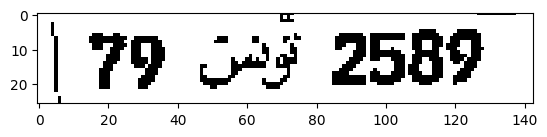

Detected License Plate: \ 79 S48 2589
Processing 846.jpg


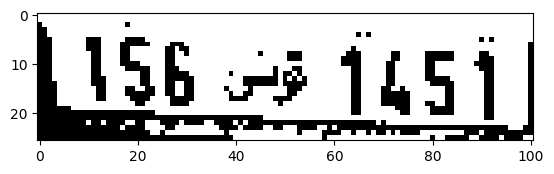

Detected License Plate: L1S6 5 1454
Processing 753.jpg


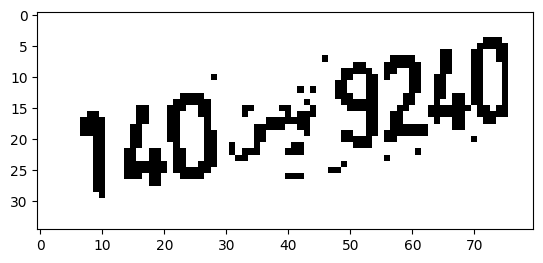

Detected License Plate: p43 9240
Processing 262.jpg


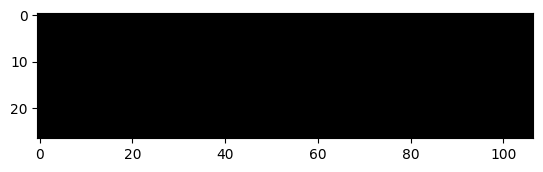

Detected License Plate: OS
Processing 626.jpg


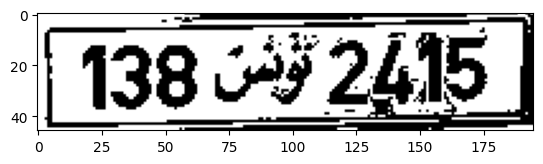

Detected License Plate: 
Processing 286.jpg


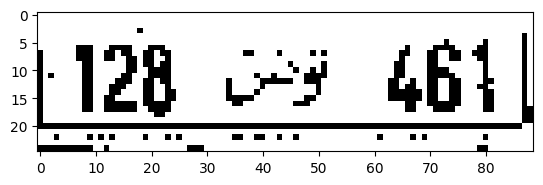

Detected License Plate: 128 cy 464
Processing 73.jpg


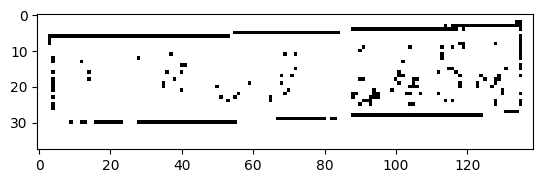

Detected License Plate: PORE babes
Processing 910.jpg


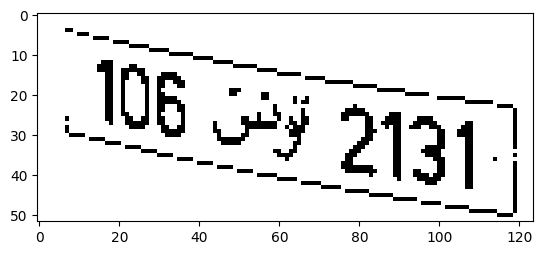

Detected License Plate: Raa
Processing 629.jpg


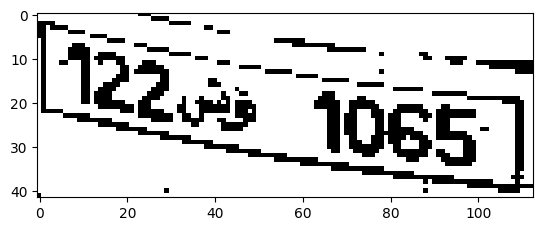

Detected License Plate: eas Fess]
Processing 110.jpg


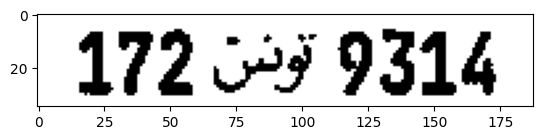

Detected License Plate: 172 9 9314
Processing 900.jpg


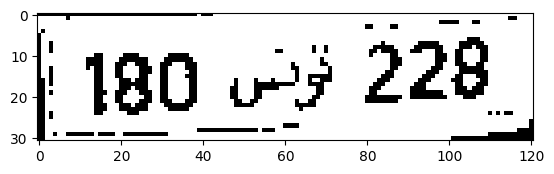

Detected License Plate: 180 uF 228
Processing 30.jpg


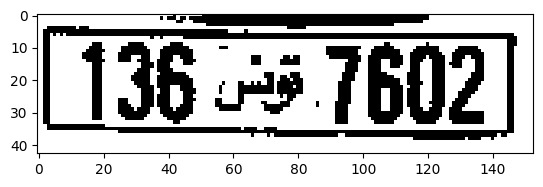

Detected License Plate: 136 3 7602
Processing 905.jpg


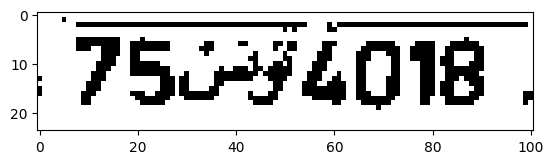

Detected License Plate: TSAO |
Processing 593.jpg


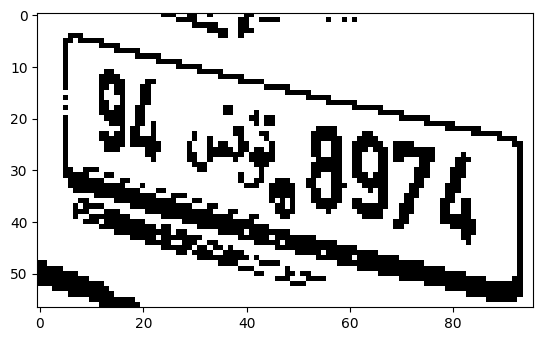

Detected License Plate: am
Processing 413.jpg


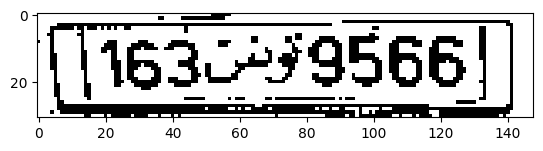

Detected License Plate: (ie32479566]
Processing 436.jpg


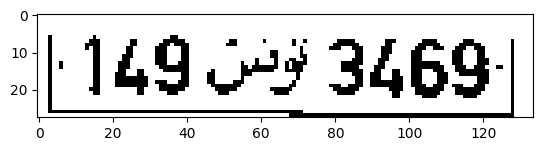

Detected License Plate: 149 349 3469:
Processing 31.jpg


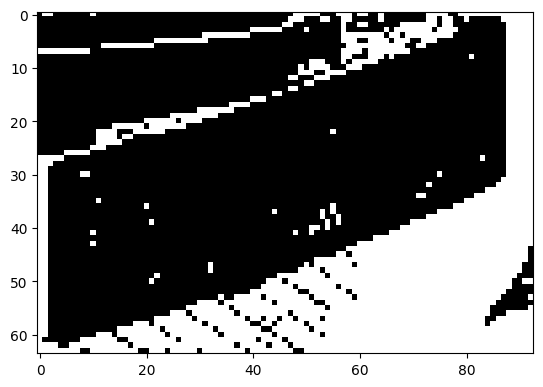

Detected License Plate: 
Processing 416.jpg


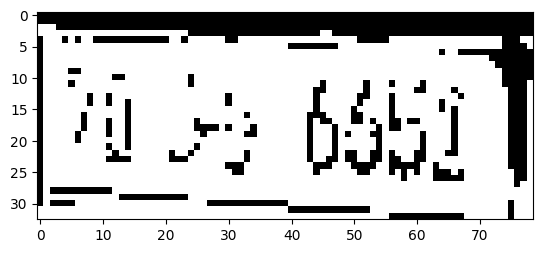

Detected License Plate: Een
Processing 17.jpg


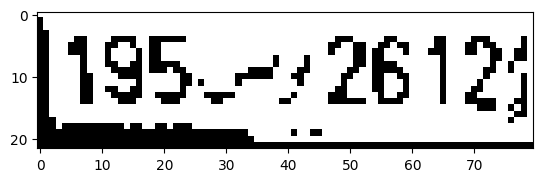

Detected License Plate: 195..-/ 26124
Processing 405.jpg


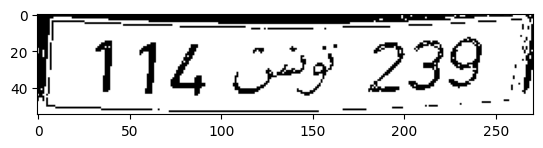

Detected License Plate: 1114 523 239 4
Processing 804.jpg


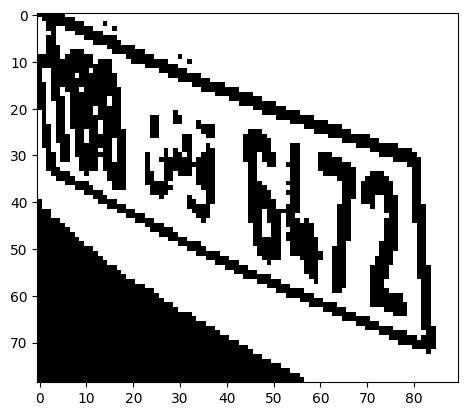

Detected License Plate: 
Processing 93.jpg


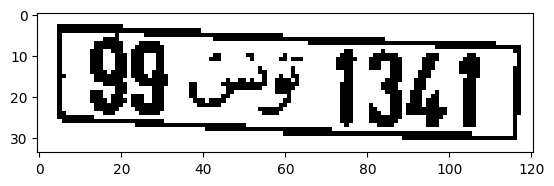

Detected License Plate: 
Processing 472.jpg


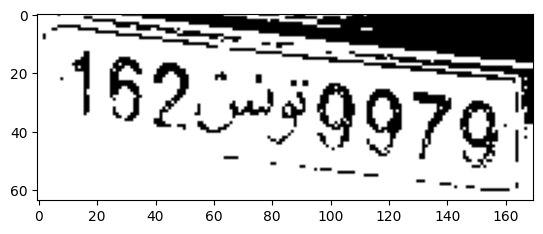

Detected License Plate: 
Processing 361.jpg


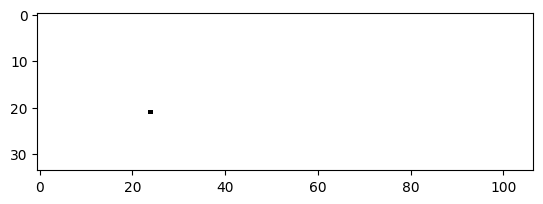

Detected License Plate: Oo
Processing 332.jpg


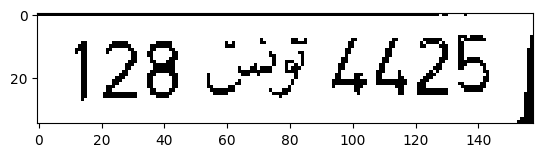

Detected License Plate: 128 9 4425 |
Processing 101.jpg


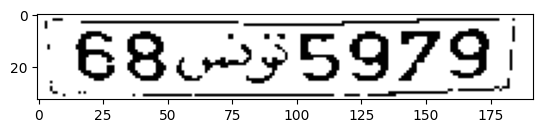

Detected License Plate: 6802359739)
Processing 40.jpg


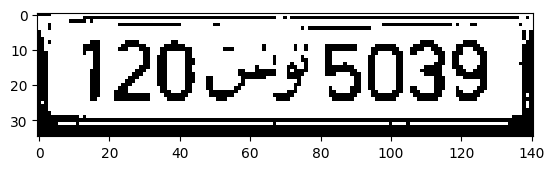

Detected License Plate: | 12095039 |
Processing 510.jpg


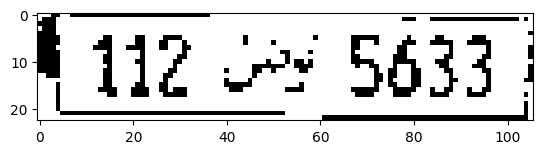

Detected License Plate: 8412 Sy 5633 |
Processing 351.jpg


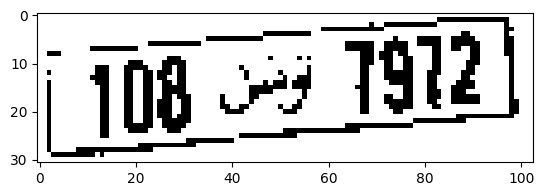

Detected License Plate: [108 os 182
Processing 179.jpg


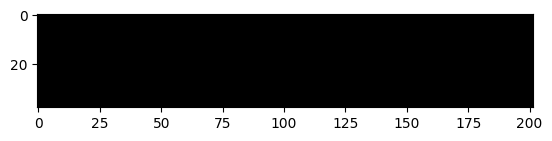

Detected License Plate: ee
Processing 618.jpg


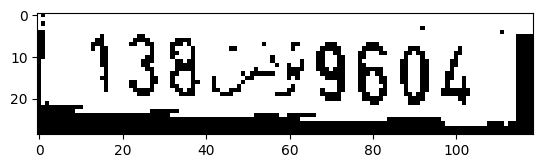

Detected License Plate: 138579604 |
Processing 795.jpg


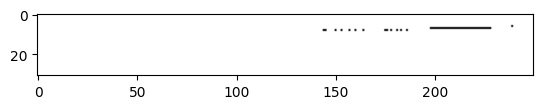

Detected License Plate: —
Processing 866.jpg


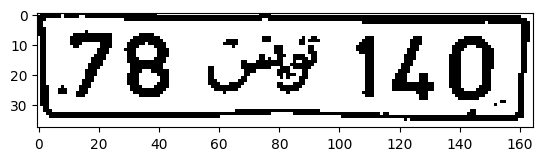

Detected License Plate: 78 > 140
Processing 176.jpg


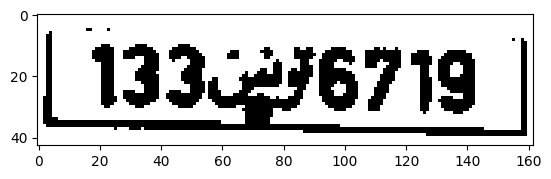

Detected License Plate: 133496719
Processing 868.jpg


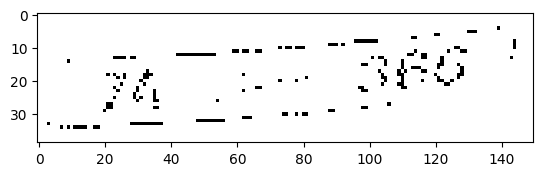

Detected License Plate: Fa ES BES
Processing 443.jpg


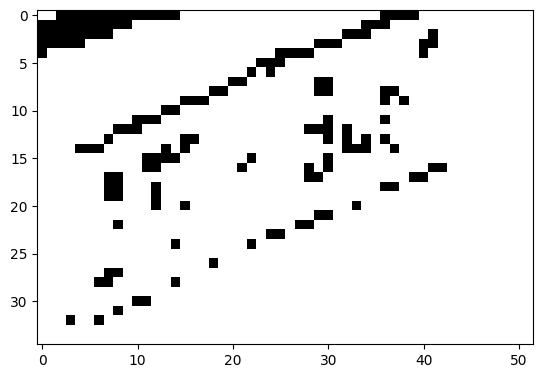

Detected License Plate: 
Processing 340.jpg


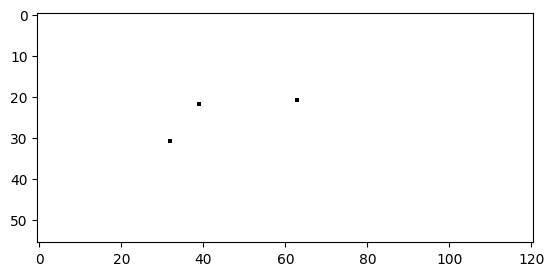

Detected License Plate: oo
Processing 433.jpg


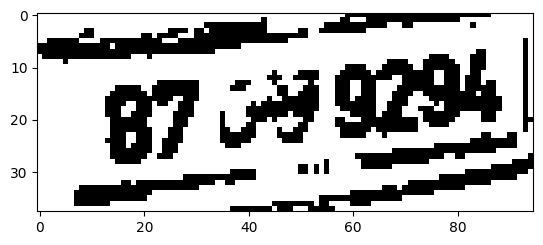

Detected License Plate: "97 9 92
Processing 806.jpg


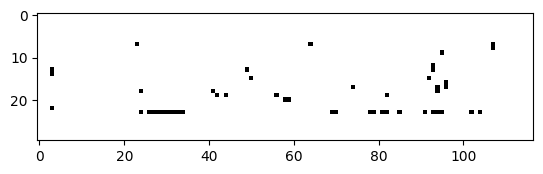

Detected License Plate: _* &
Processing 772.jpg


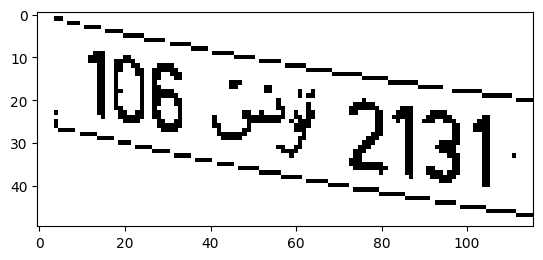

Detected License Plate: eae
Processing 517.jpg


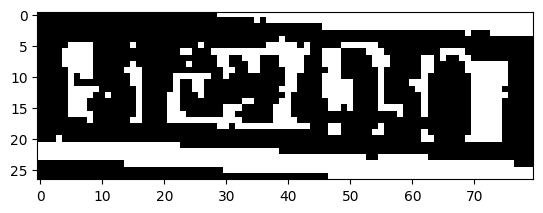

Detected License Plate: Heyy
Processing 580.jpg


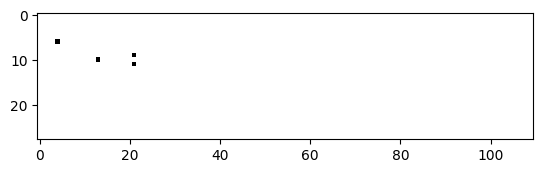

Detected License Plate: Se
Processing 148.jpg


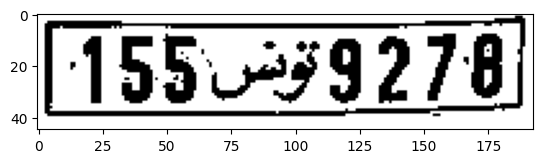

Detected License Plate: 155-+79278
Processing 628.jpg


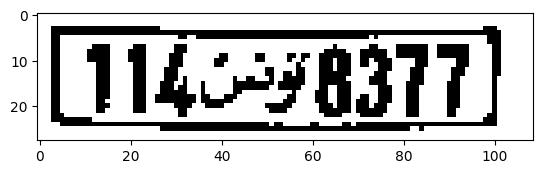

Detected License Plate: WN498377
Processing 656.jpg


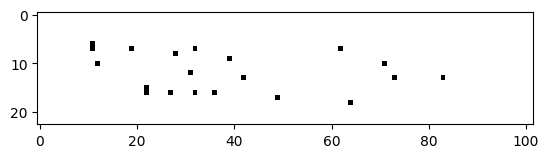

Detected License Plate: OEE
Processing 632.jpg


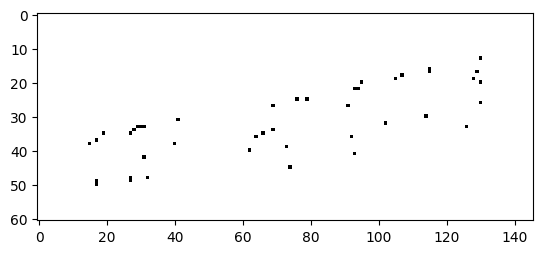

Detected License Plate: 
Processing 321.jpg


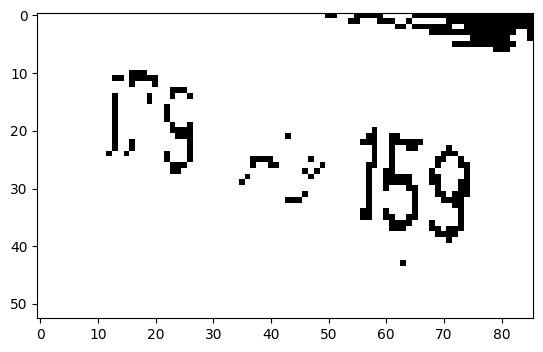

Detected License Plate: MS ea
Processing 721.jpg


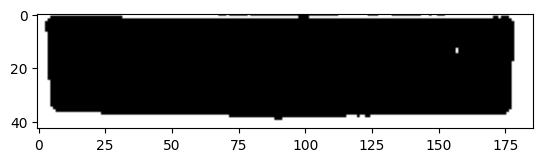

Detected License Plate: iii
Processing 29.jpg


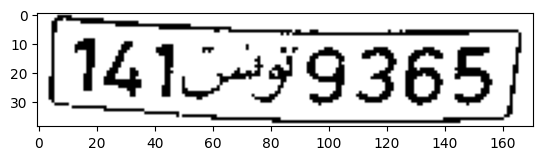

Detected License Plate: 1415-99365
Processing 670.jpg


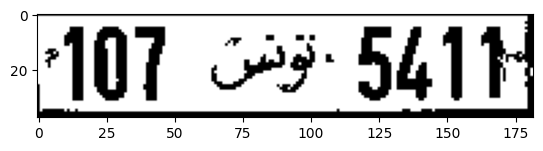

Detected License Plate: 107 3 5414
Processing 42.jpg


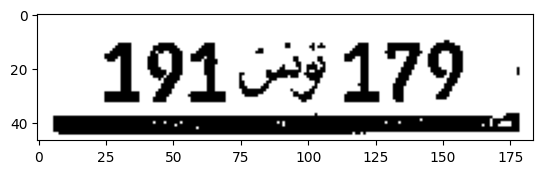

Detected License Plate: 1940-9179 |
Processing 91.jpg


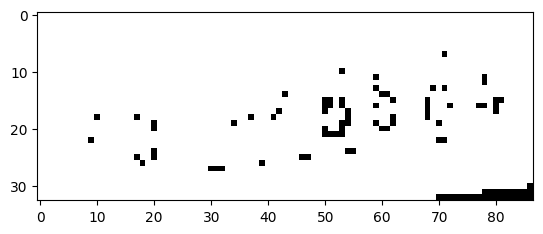

Detected License Plate: 3 tab ee
Processing 334.jpg


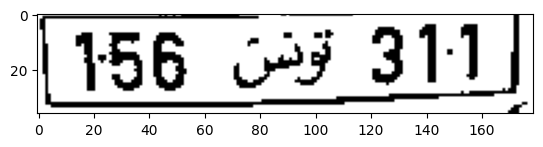

Detected License Plate: 156 OF 311)
Processing 432.jpg


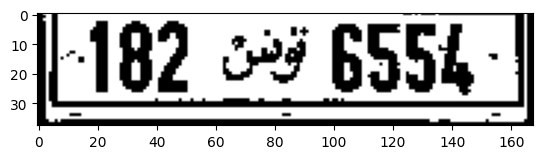

Detected License Plate: 182 3 6554}
Processing 791.jpg


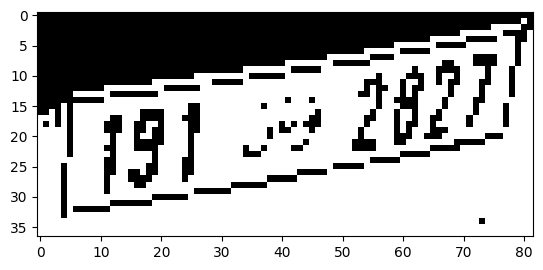

Detected License Plate: 
Processing 86.jpg


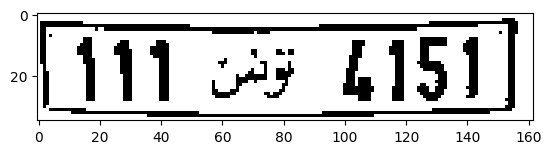

Detected License Plate: Ws 4151
Processing 521.jpg


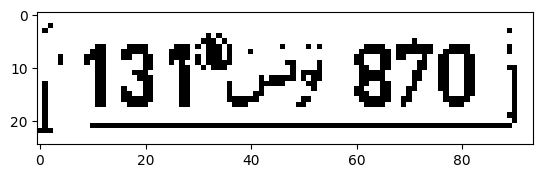

Detected License Plate: 13 4%33 870
Processing 490.jpg


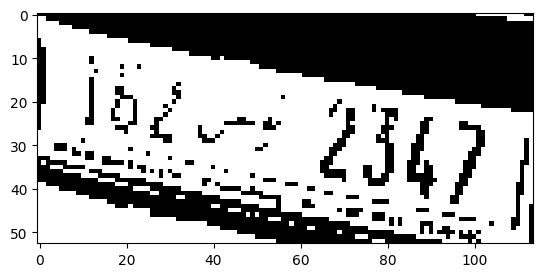

Detected License Plate: 
Processing 251.jpg


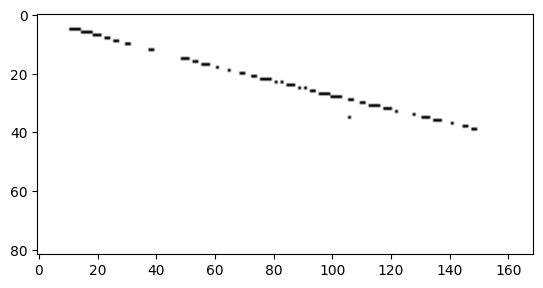

Detected License Plate: ~~ no
Processing 859.jpg


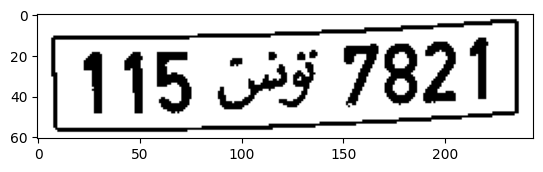

Detected License Plate: 115 05 7821
Processing 890.jpg


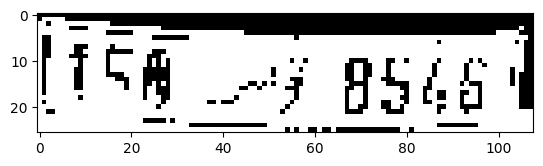

Detected License Plate: LiSq 7 BS48 4
Processing 579.jpg


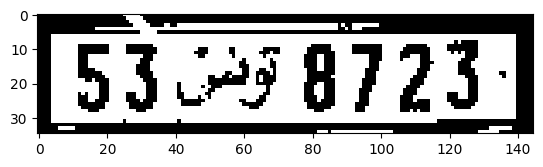

Detected License Plate: 153.049 8723 |
Processing 450.jpg


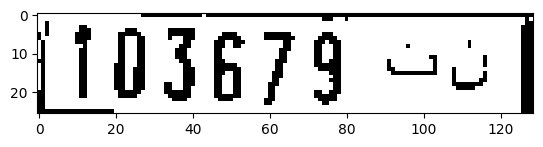

Detected License Plate: 103679 co
Processing 520.jpg


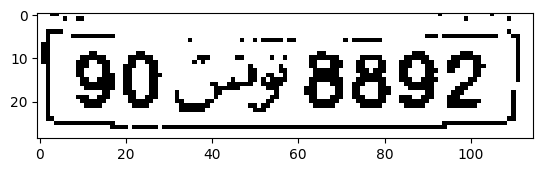

Detected License Plate: (90 5458892}
Processing 689.jpg


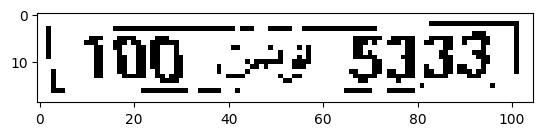

Detected License Plate: 1100547 53331
Processing 127.jpg


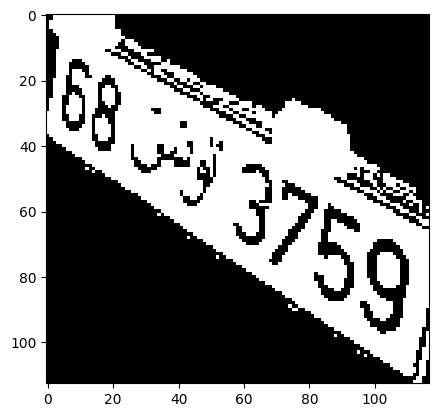

Detected License Plate: RE
Processing 276.jpg


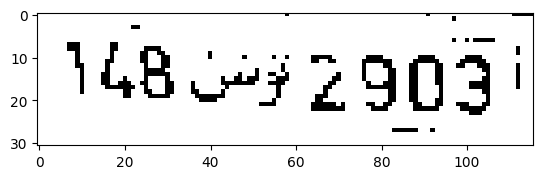

Detected License Plate: 148.43 2.903)
Processing 727.jpg


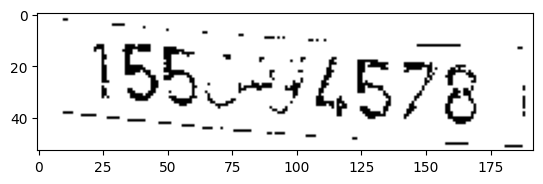

Detected License Plate: ISB CLB 76 |
Processing 349.jpg


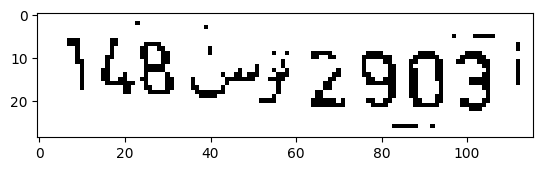

Detected License Plate: V8 72903)
Processing 542.jpg


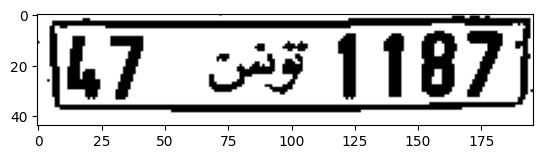

Detected License Plate: b7 43 1187
Processing 780.jpg


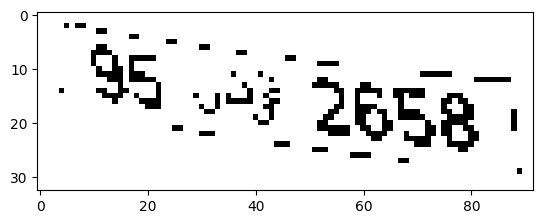

Detected License Plate: SS ese
Processing 702.jpg


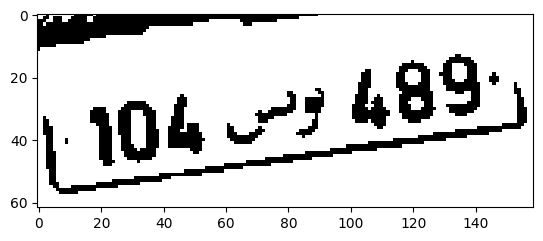

Detected License Plate: 104? 489:
Processing 182.jpg


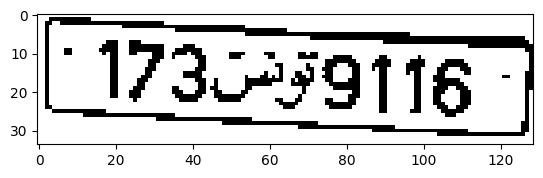

Detected License Plate: 
Processing 106.jpg


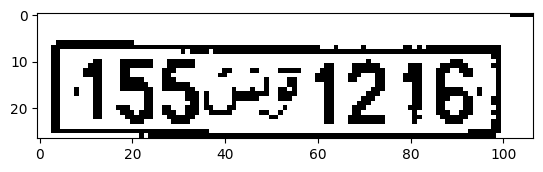

Detected License Plate: 155051216)
Processing 800.jpg


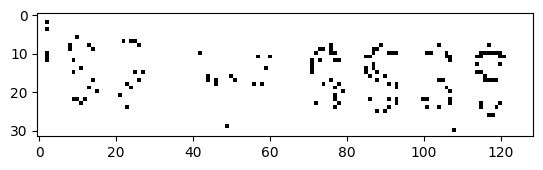

Detected License Plate: Sr ag ae
Processing 386.jpg


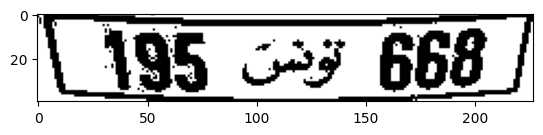

Detected License Plate: (195 27 668
Processing 899.jpg


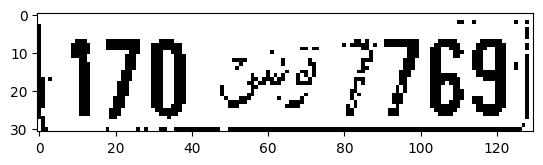

Detected License Plate: 170 35 7769}
Processing 115.jpg


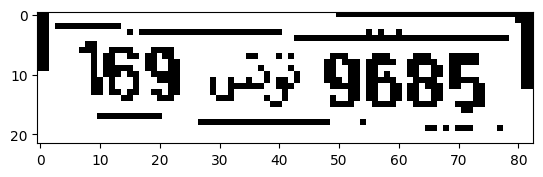

Detected License Plate: 169 5 9685 |
Processing 688.jpg


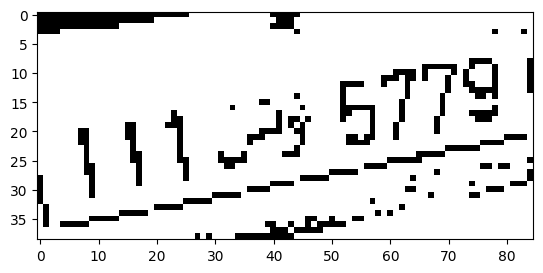

Detected License Plate: asl!
Processing 713.jpg


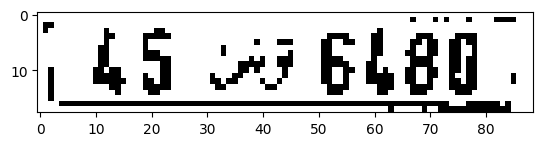

Detected License Plate: AS HF BEBO.
Processing 112.jpg


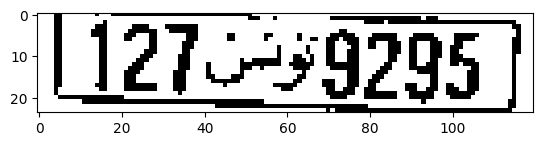

Detected License Plate: 12739795
Processing 243.jpg


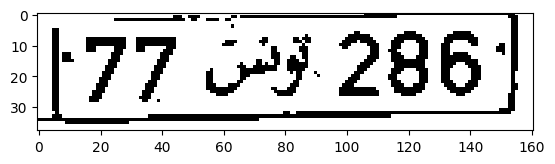

Detected License Plate: |77 O9.286)
Processing 816.jpg


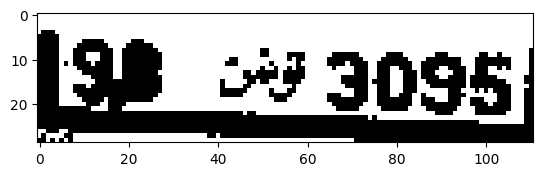

Detected License Plate: [ae 23 3095;
Processing 695.jpg


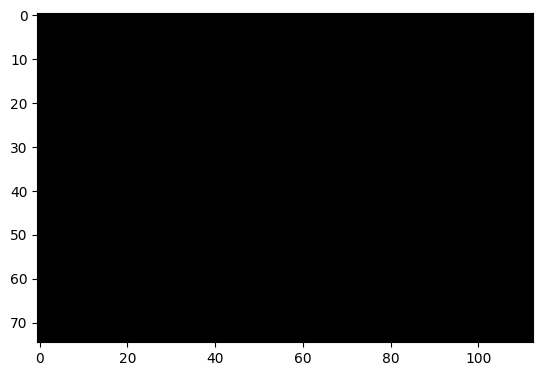

Detected License Plate: a
Processing 336.jpg


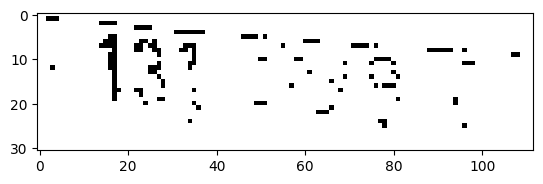

Detected License Plate: AR Pye t
Processing 854.jpg


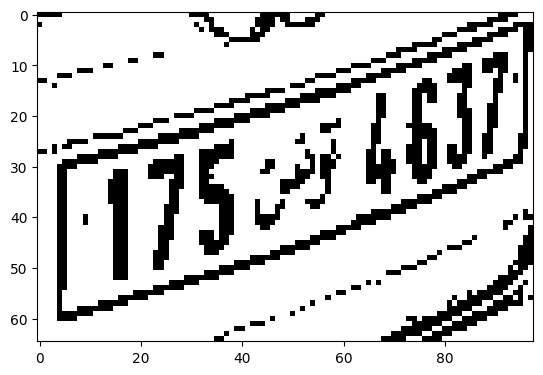

Detected License Plate: ee
Processing 312.jpg


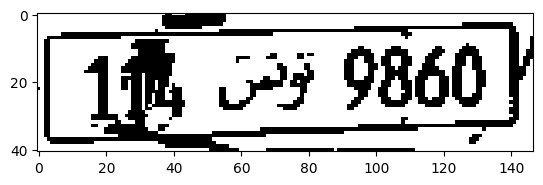

Detected License Plate: fl, 79 9860
Processing 402.jpg


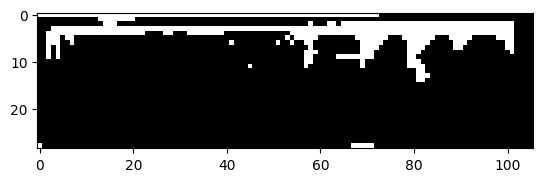

Detected License Plate: -
Processing 774.jpg


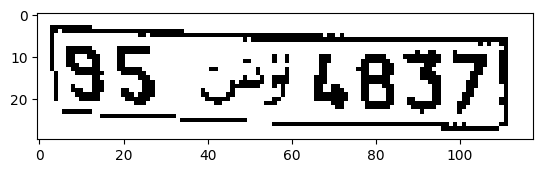

Detected License Plate: 95 94837)
Processing 473.jpg


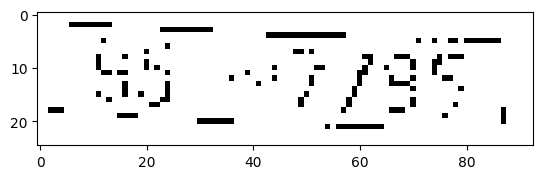

Detected License Plate: ae
Processing 423.jpg


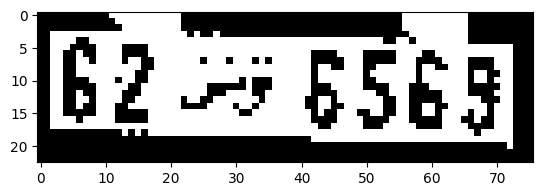

Detected License Plate: 62 3 5565)
Processing 892.jpg


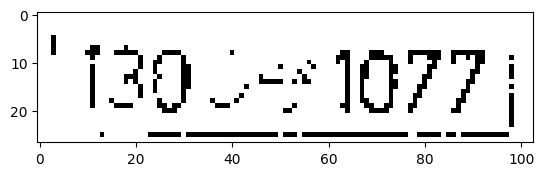

Detected License Plate: "130 L=9 1077}
Processing 793.jpg


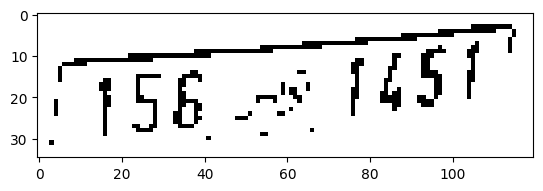

Detected License Plate: 
Processing 152.jpg


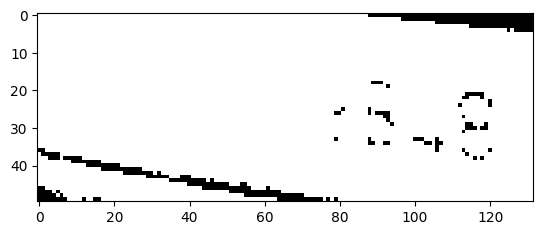

Detected License Plate: NE
Processing 543.jpg


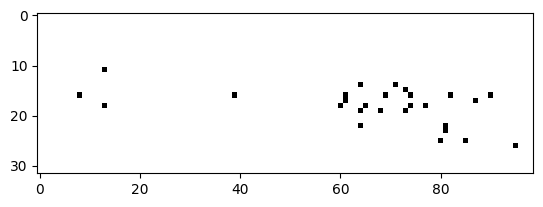

Detected License Plate: ve
Processing 285.jpg


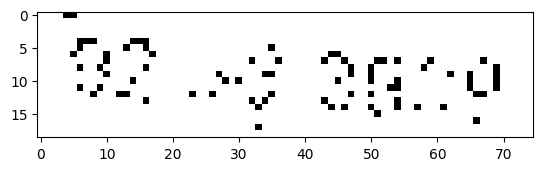

Detected License Plate: SS od Jer
Processing 367.jpg


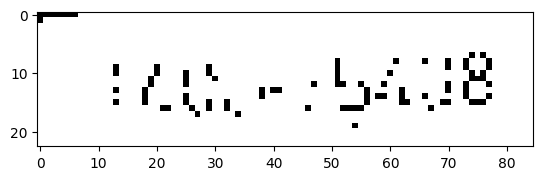

Detected License Plate: HAAS GA
Processing 114.jpg


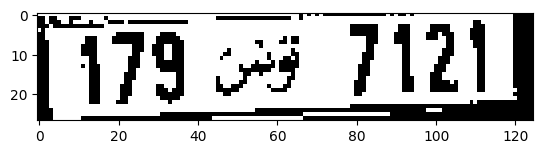

Detected License Plate: 479 3 71211
Processing 699.jpg


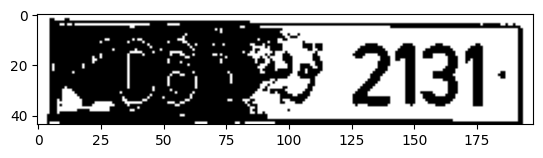

Detected License Plate: 
Processing 484.jpg


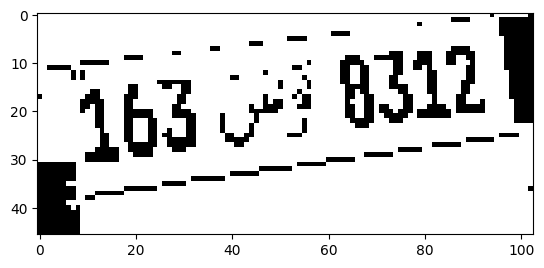

Detected License Plate: “ios
Processing 494.jpg


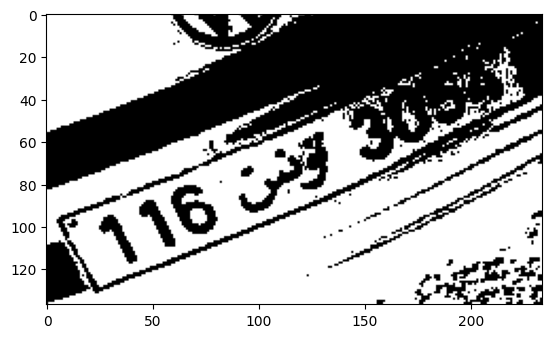

Detected License Plate: 
Processing 146.jpg


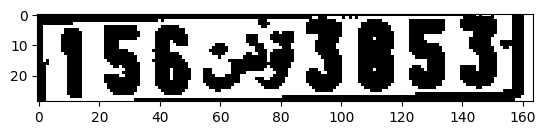

Detected License Plate: 15673653)
Processing 837.jpg


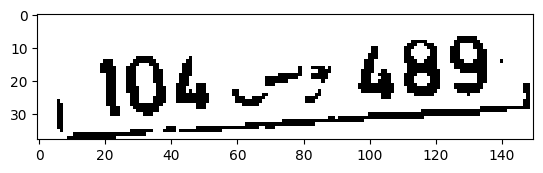

Detected License Plate: 1104 .-7 489,
Processing 749.jpg


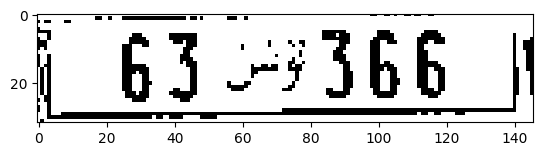

Detected License Plate: | 63-7366 |
Processing 187.jpg


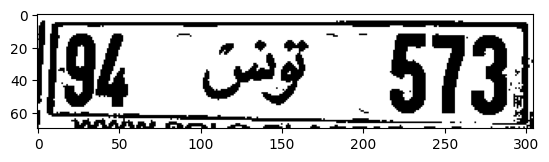

Detected License Plate: (94 Ax 573]
Processing 623.jpg


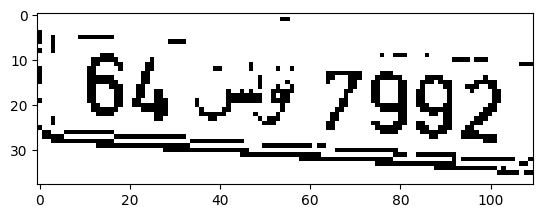

Detected License Plate: 
Processing 489.jpg


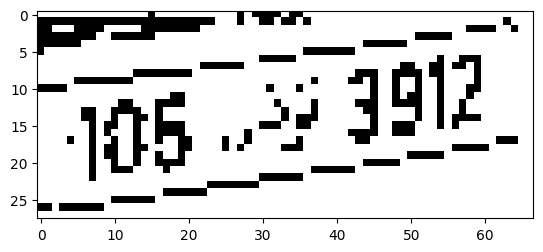

Detected License Plate: 
Processing 264.jpg


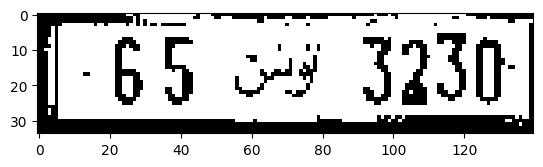

Detected License Plate: 1-65 oY 3230:
Processing 224.jpg


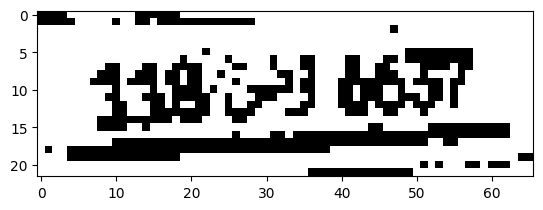

Detected License Plate: BAT
Processing 634.jpg


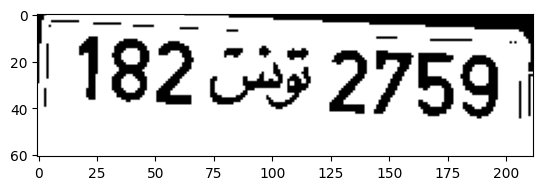

Detected License Plate: | 182 533 2759 |
Processing 451.jpg


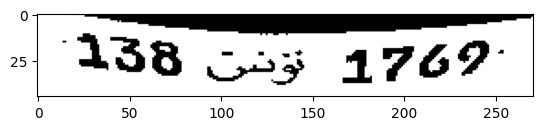

Detected License Plate: 
Processing 223.jpg


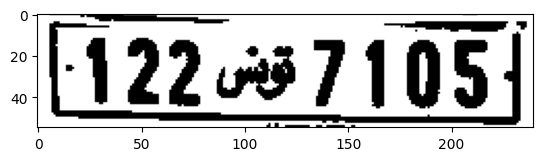

Detected License Plate: [122487105]
Processing 201.jpg


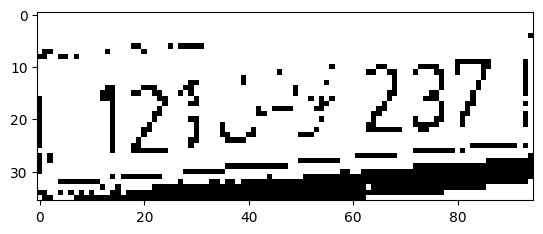

Detected License Plate: 12s 237,
Processing 92.jpg


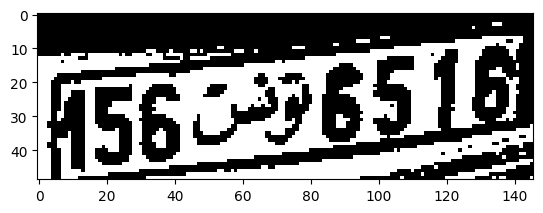

Detected License Plate: 9560396916
Processing 248.jpg


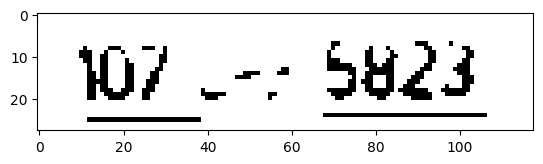

Detected License Plate: 107 .-- $823
Processing 396.jpg


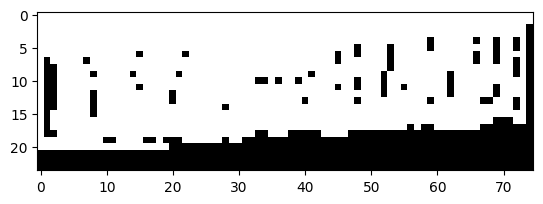

Detected License Plate: iii aoihg
Processing 509.jpg


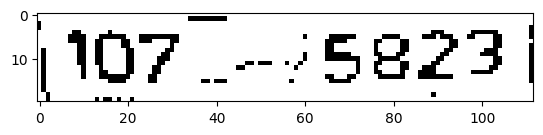

Detected License Plate: | 107 _- 25823 |
Processing 812.jpg


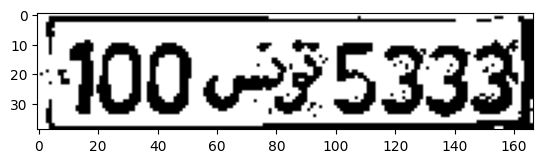

Detected License Plate: 400 295333)
Processing 412.jpg


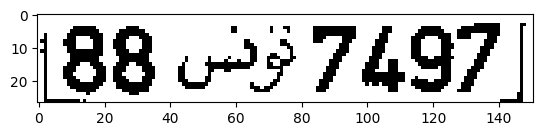

Detected License Plate: (88 3 7497 |
Processing 848.jpg


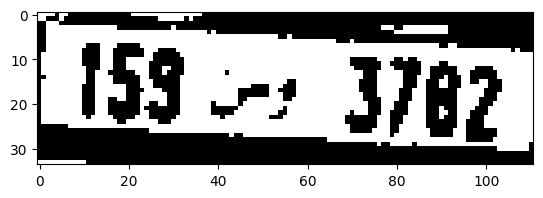

Detected License Plate: 159 —-» 3782
Processing 68.jpg


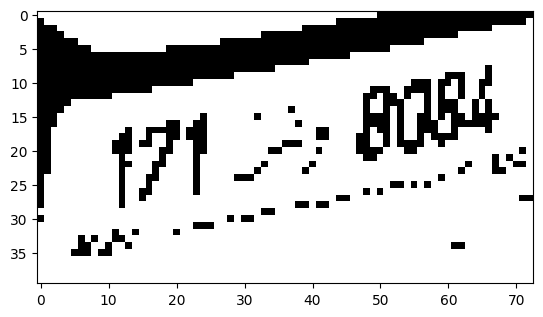

Detected License Plate: 
Processing 463.jpg


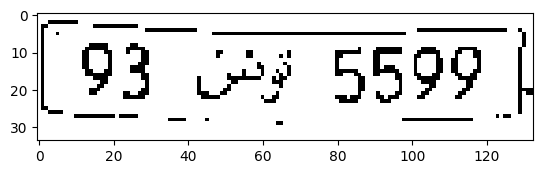

Detected License Plate: [93 JF 5599 |
Processing 298.jpg


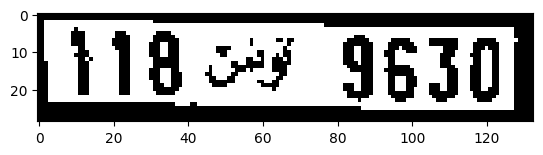

Detected License Plate: 118 os 9630
Processing 908.jpg


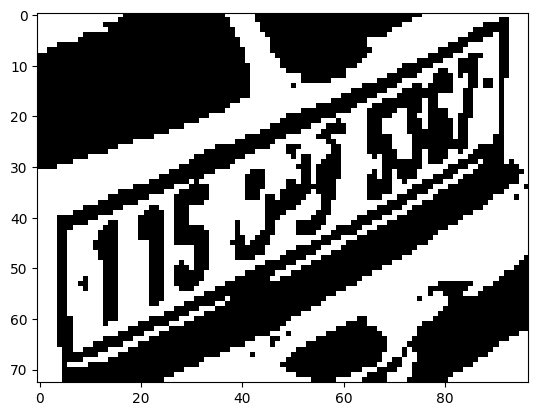

Detected License Plate: ce
Processing 65.jpg


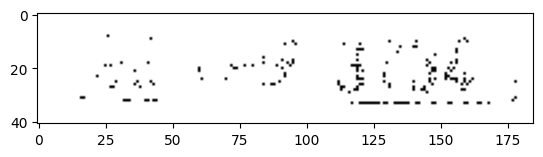

Detected License Plate: a ree
Processing 684.jpg


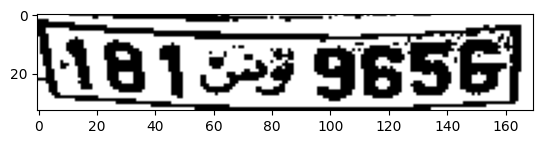

Detected License Plate: A815) 9656]
Processing 2.jpg


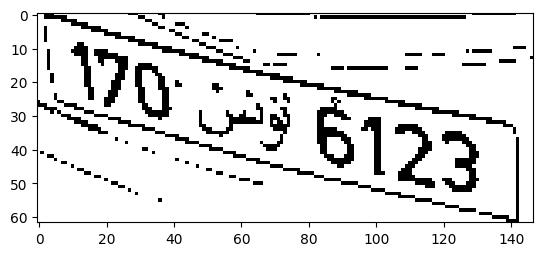

Detected License Plate: 
Processing 347.jpg


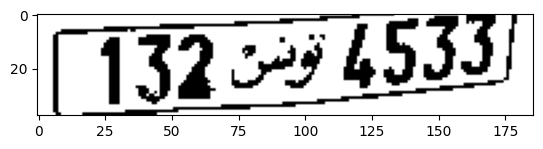

Detected License Plate: (132 9 4953
Processing 698.jpg


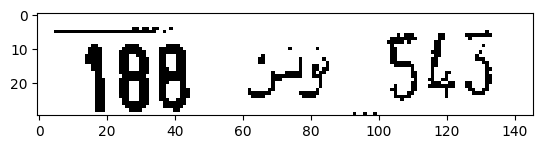

Detected License Plate: 488 coy 5L3
Processing 817.jpg


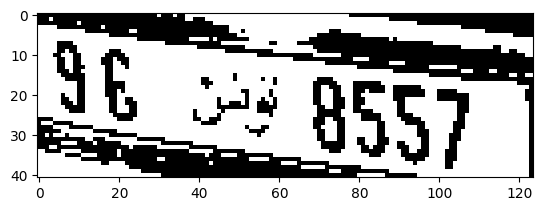

Detected License Plate: 
Processing 493.jpg


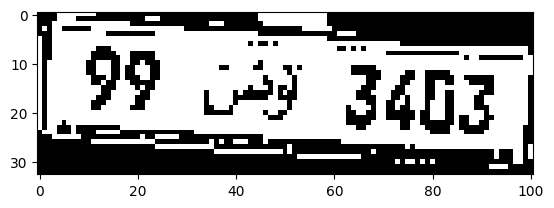

Detected License Plate: 99 oF 3403 |
Processing 802.jpg


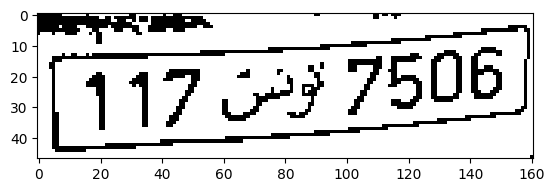

Detected License Plate: Se
Processing 655.jpg


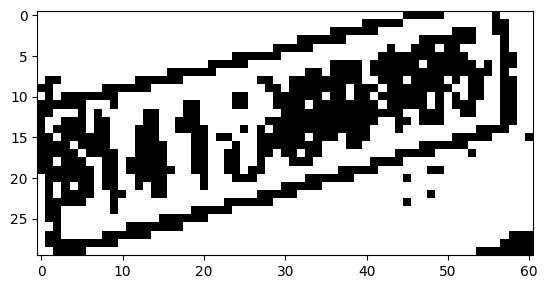

Detected License Plate: 
Processing 131.jpg


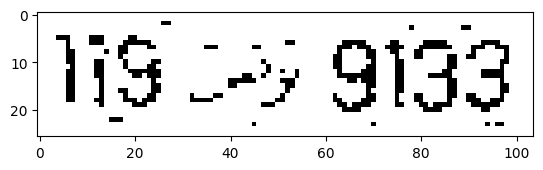

Detected License Plate: HS 243 9133
Processing 317.jpg


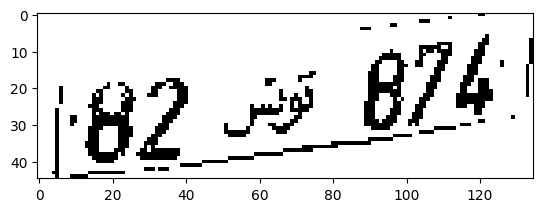

Detected License Plate: 192 ve B74
Processing 869.jpg


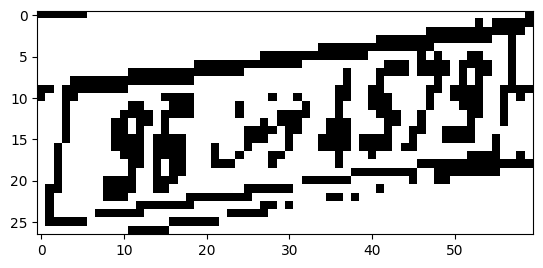

Detected License Plate: 
Processing 273.jpg


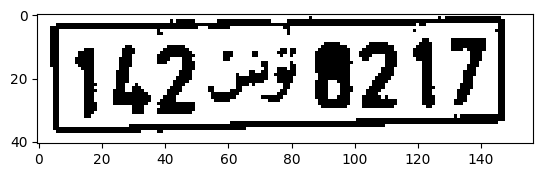

Detected License Plate: 442-9 8217
Processing 6.jpg


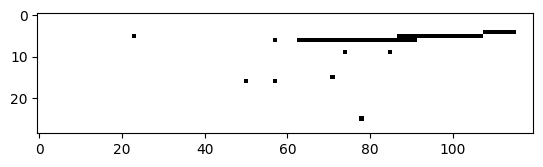

Detected License Plate: Tl
Processing 466.jpg


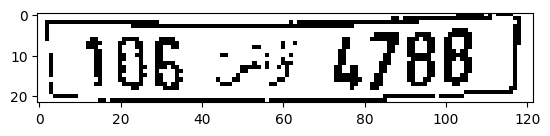

Detected License Plate: 1106 5 4786 |
Processing 600.jpg


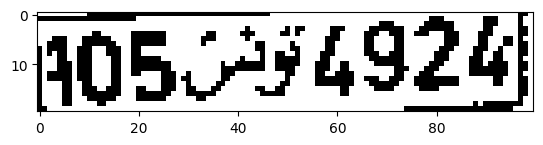

Detected License Plate: 4050-79 4924}
Processing 567.jpg


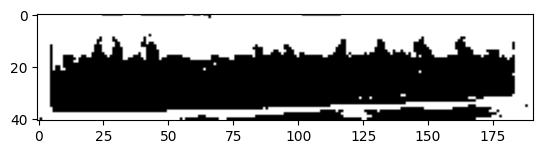

Detected License Plate: es
Processing 211.jpg


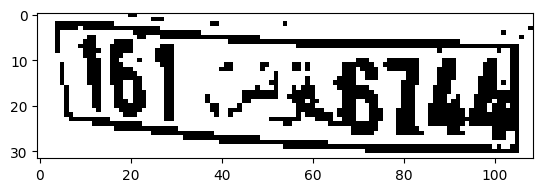

Detected License Plate: 
Processing 75.jpg


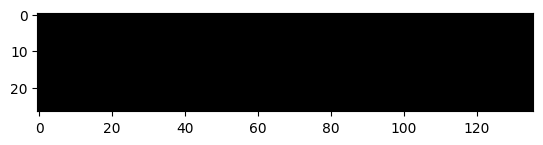

Detected License Plate: 
Processing 763.jpg


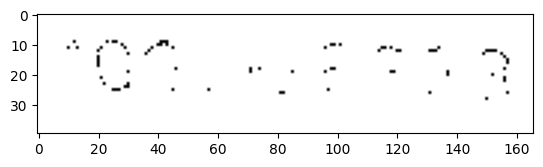

Detected License Plate: oe wey
Processing 344.jpg


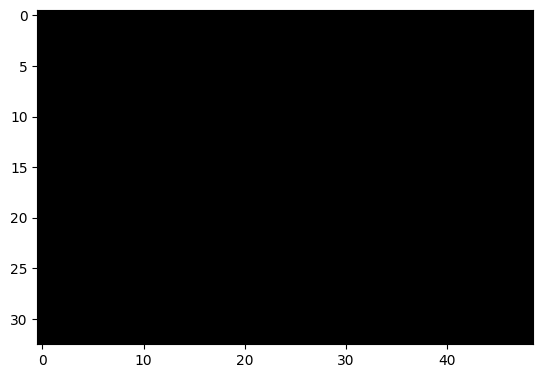

Detected License Plate: a
Processing 696.jpg


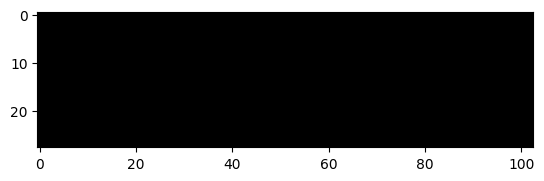

Detected License Plate: OS
Processing 319.jpg


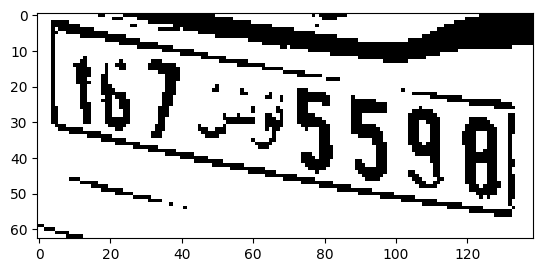

Detected License Plate: 
Processing 742.jpg


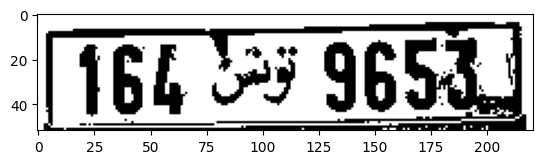

Detected License Plate: 16h 9658,
Processing 604.jpg


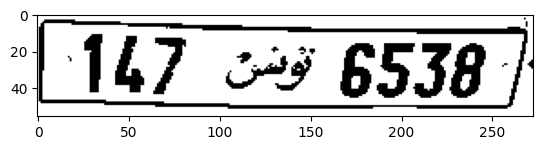

Detected License Plate: 147 5 6538
Processing 857.jpg


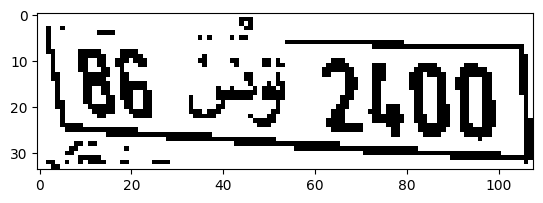

Detected License Plate: 
Processing 13.jpg


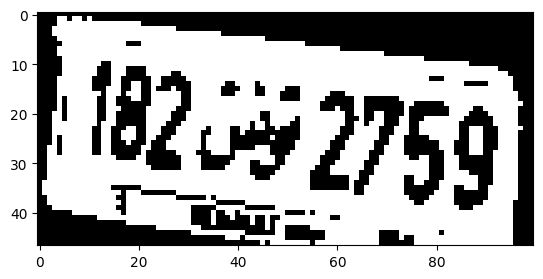

Detected License Plate: 26% 2759
Processing 616.jpg


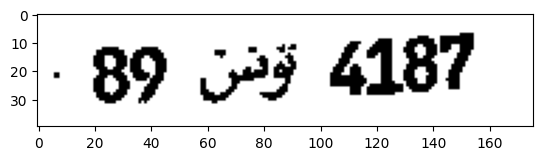

Detected License Plate: - 89 Say 4187
Processing 839.jpg


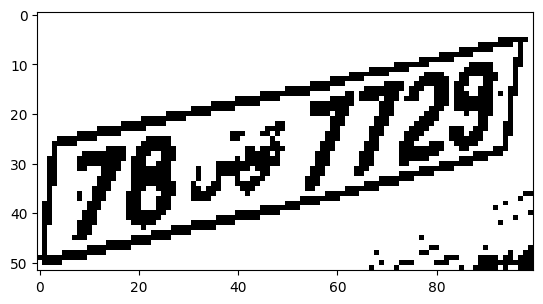

Detected License Plate: (pal
Processing 430.jpg


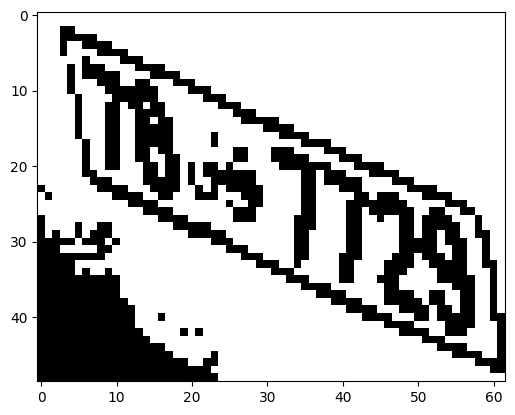

Detected License Plate: Sea
Processing 668.jpg


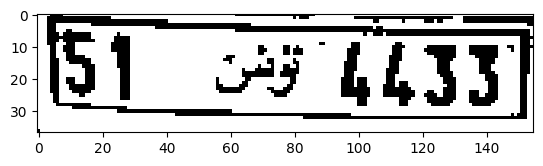

Detected License Plate: ~ =p pw |
Processing 884.jpg


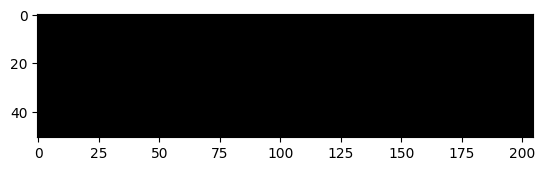

Detected License Plate: BS
Processing 70.jpg


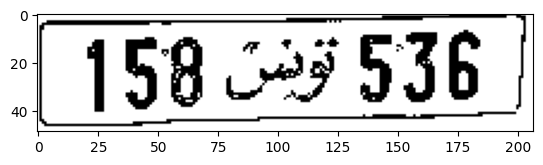

Detected License Plate: 158 249 536
Processing 642.jpg


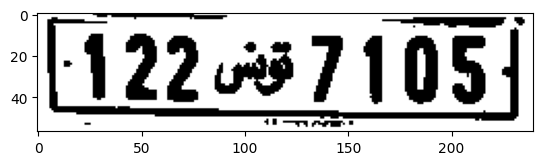

Detected License Plate: [122087105]
Processing 845.jpg


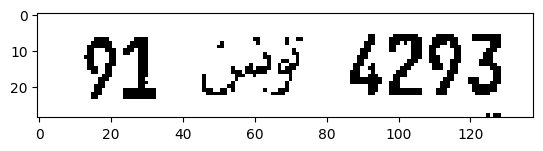

Detected License Plate: 91 Gey 4293
Processing 808.jpg


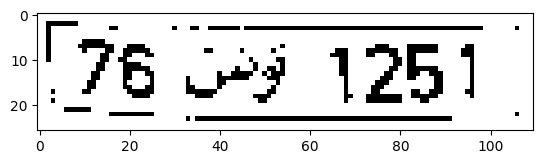

Detected License Plate: (76 43 1251
Processing 903.jpg


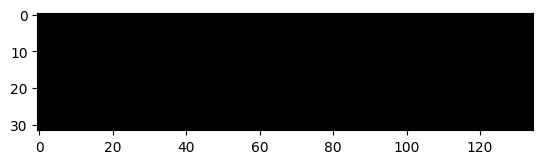

Detected License Plate: OS
Processing 84.jpg


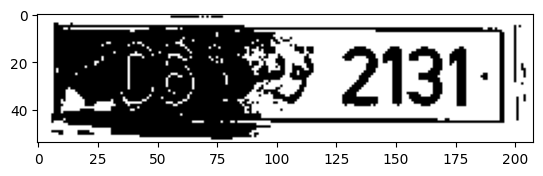

Detected License Plate: Mees 2131)
Processing 501.jpg


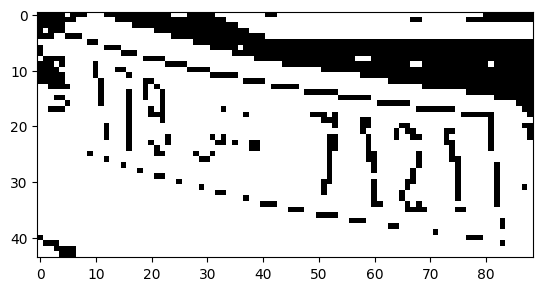

Detected License Plate: oon
Processing 732.jpg


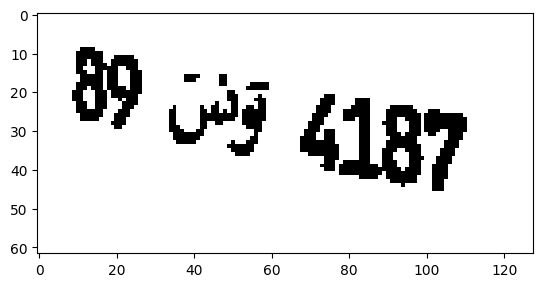

Detected License Plate: 909 apy
Processing 723.jpg


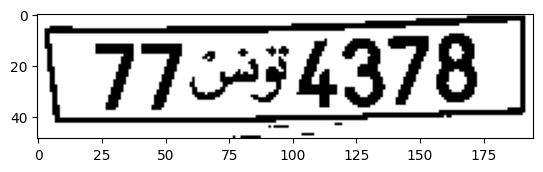

Detected License Plate: 
Processing 761.jpg


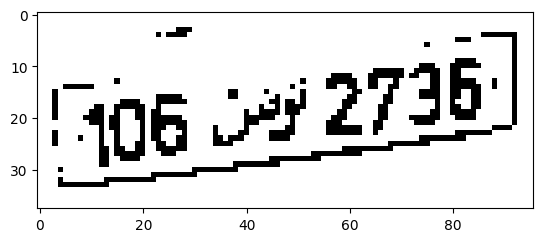

Detected License Plate: 06 278k
Processing 758.jpg


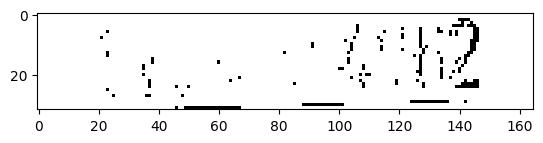

Detected License Plate: coe JA
Processing 836.jpg


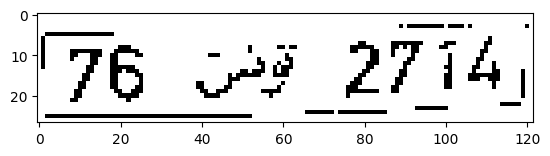

Detected License Plate: 76 oF 2774,
Processing 887.jpg


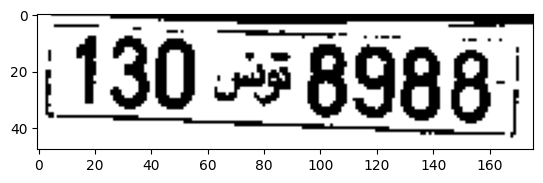

Detected License Plate: (13058988,
Processing 590.jpg


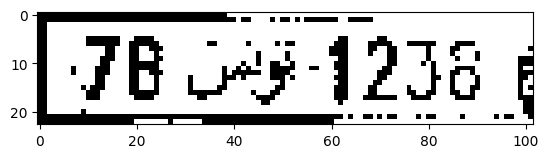

Detected License Plate: TB Ae-4256 |
Processing 216.jpg


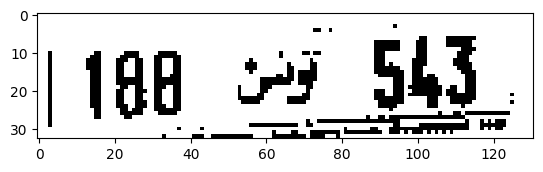

Detected License Plate: | 188 <9 SAS.
Processing 435.jpg


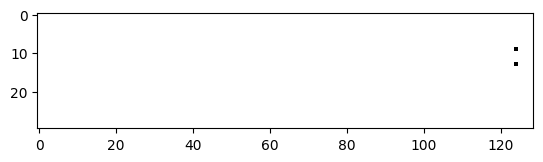

Detected License Plate: Se :
Processing 353.jpg


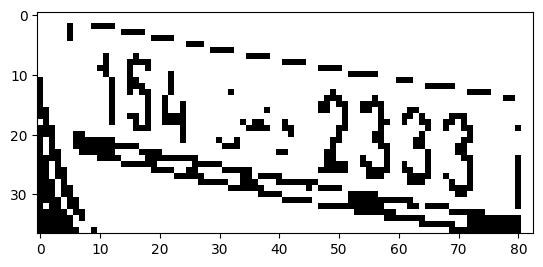

Detected License Plate: 
Processing 564.jpg


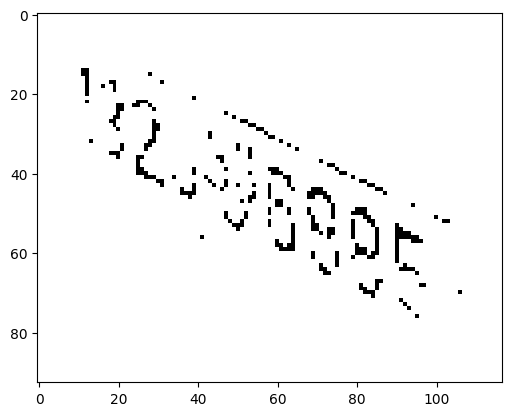

Detected License Plate: 
Processing 906.jpg


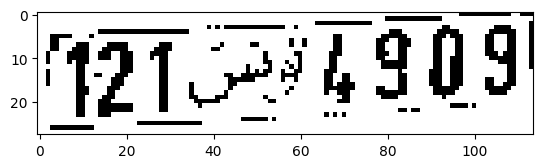

Detected License Plate: Th 909!
Processing 178.jpg


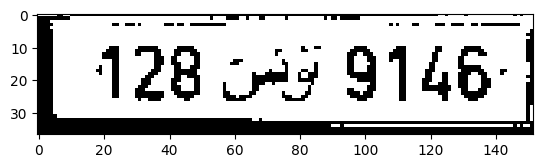

Detected License Plate: ] 128 <7 9146 |
Processing 856.jpg


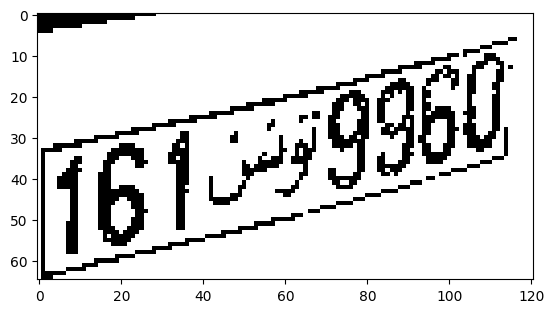

Detected License Plate: él 59065
Processing 303.jpg


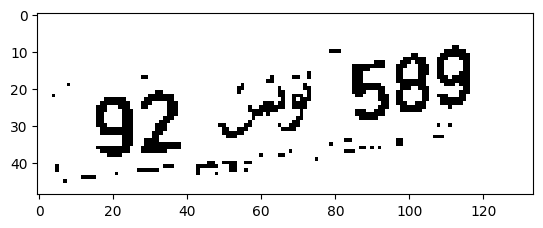

Detected License Plate: 92 7 589
Processing 284.jpg


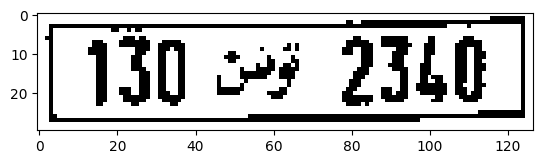

Detected License Plate: 130 37 2340
Processing 663.jpg


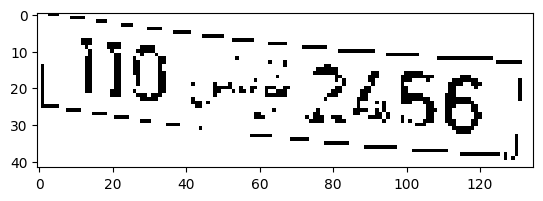

Detected License Plate: IS 2 a8 5
Processing 119.jpg


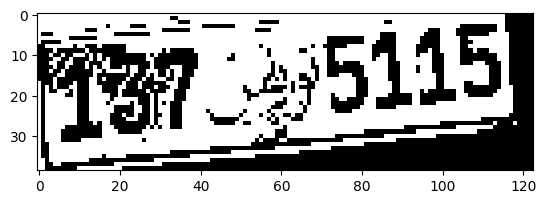

Detected License Plate: gg? 2/5145}
Processing 328.jpg


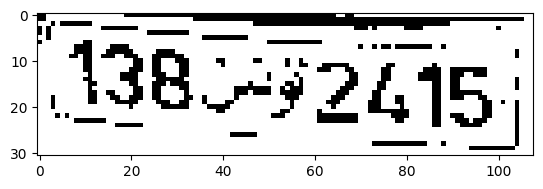

Detected License Plate: 
Processing 32.jpg


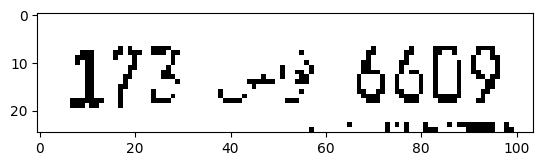

Detected License Plate: 172 3 6609
Processing 453.jpg


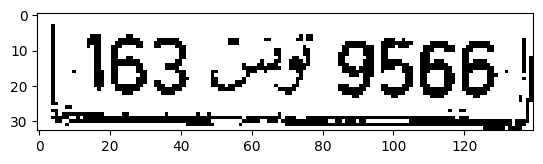

Detected License Plate: 163 57 9566-4
Processing 682.jpg


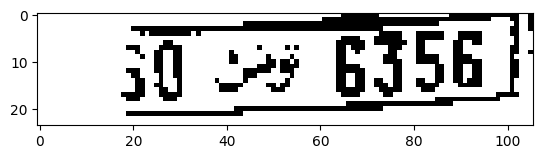

Detected License Plate: 30 7 B56 4
Processing 707.jpg


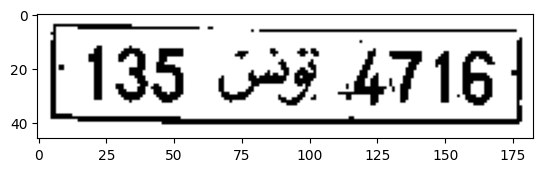

Detected License Plate: L135 G38 4716]
Processing 790.jpg


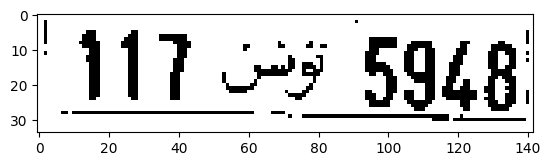

Detected License Plate: WT 9 5948,
Processing 502.jpg


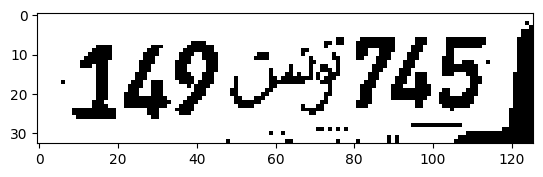

Detected License Plate: 14959765 |
Processing 189.jpg


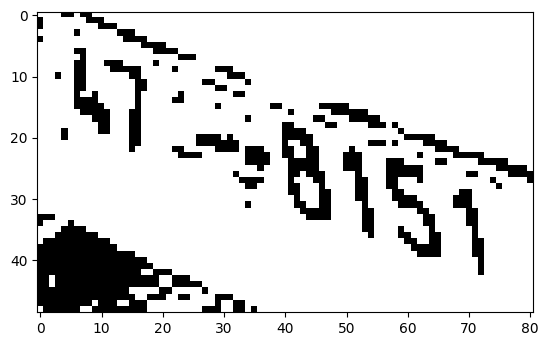

Detected License Plate: Ste
Processing 644.jpg


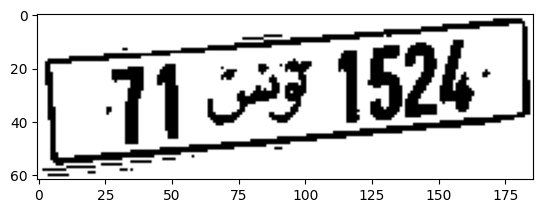

Detected License Plate: 
Processing 737.jpg


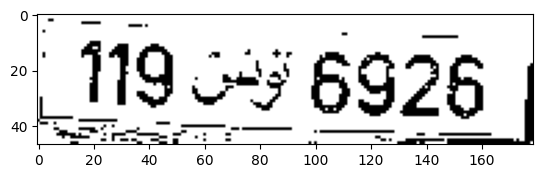

Detected License Plate: 19 4 6926 |
Processing 506.jpg


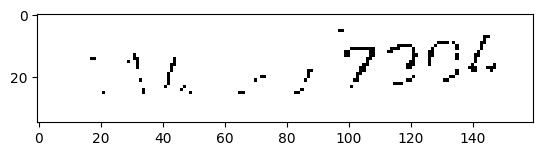

Detected License Plate: Vp FAO
Processing 196.jpg


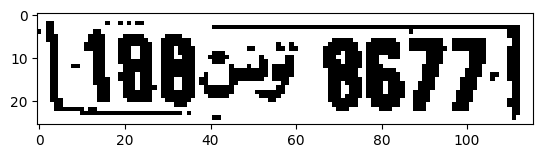

Detected License Plate: [1982-7 8677:
Processing 646.jpg


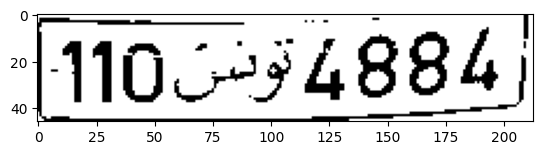

Detected License Plate: NO-F4884)
Processing 170.jpg


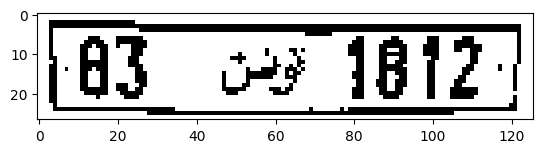

Detected License Plate: 83 3 1812
Processing 481.jpg


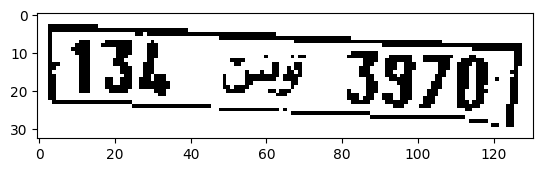

Detected License Plate: 13k_ 3353970
Processing 215.jpg


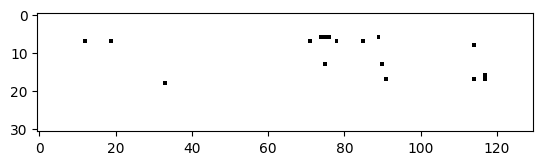

Detected License Plate: “
Processing 571.jpg


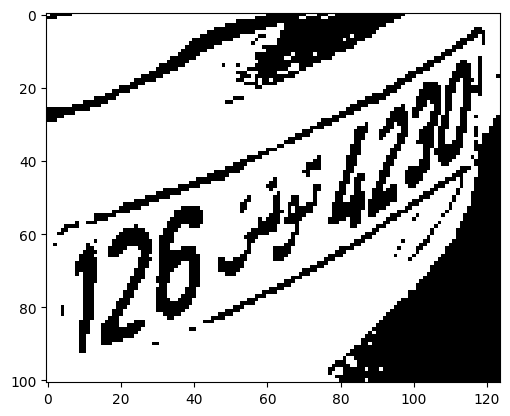

Detected License Plate: 
Processing 108.jpg


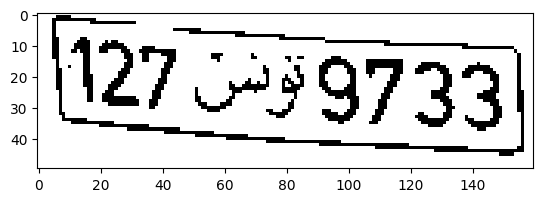

Detected License Plate: 127 39733
Processing 356.jpg


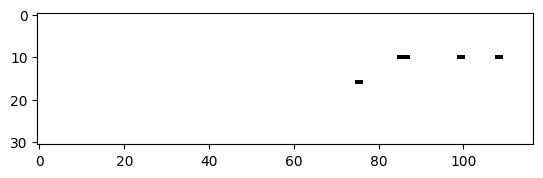

Detected License Plate: -
Processing 756.jpg


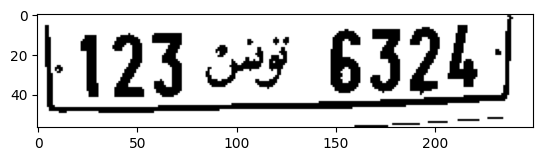

Detected License Plate: 1123 4% 6324)
Processing 855.jpg


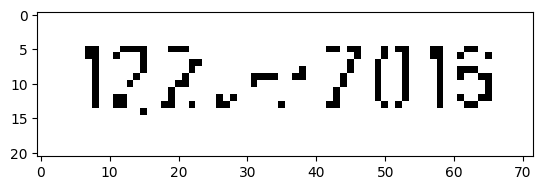

Detected License Plate: W227 01S
Processing 687.jpg


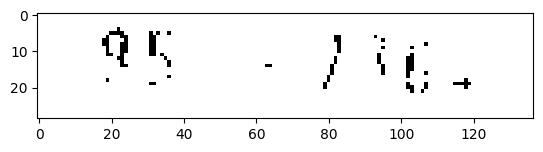

Detected License Plate: ay hg.
Processing 891.jpg


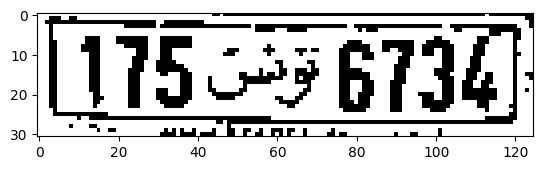

Detected License Plate: 
Processing 594.jpg


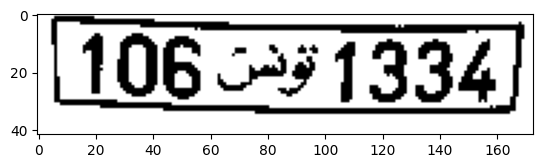

Detected License Plate: 
Processing 889.jpg


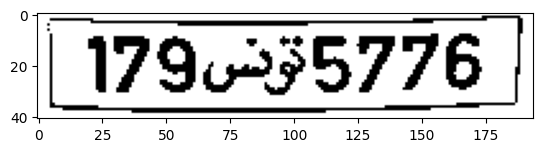

Detected License Plate: 179235776
Processing 587.jpg


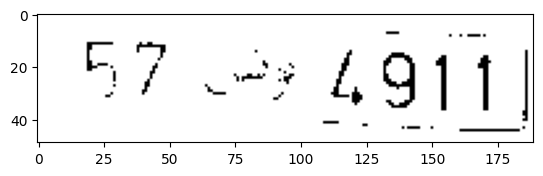

Detected License Plate: 57 9 4911
Processing 426.jpg


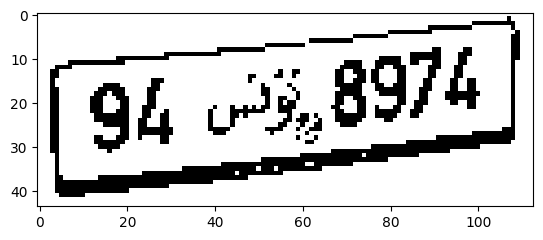

Detected License Plate: 
Processing 438.jpg


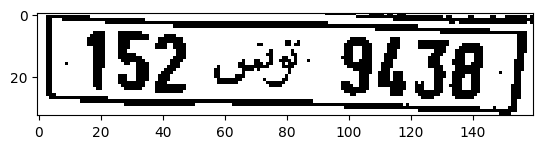

Detected License Plate: 
Processing 139.jpg


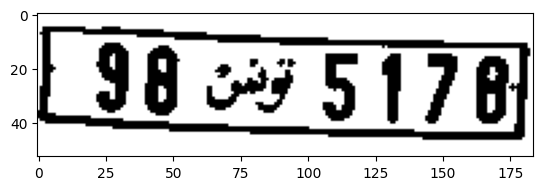

Detected License Plate: 96 5 5178
Processing 603.jpg


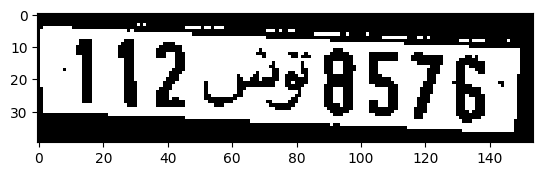

Detected License Plate: 112438576-
Processing 185.jpg


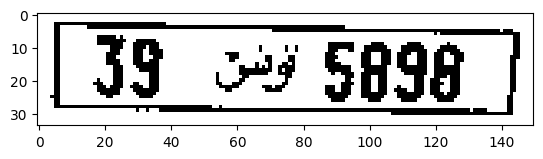

Detected License Plate: 39 54 §898
Processing 45.jpg


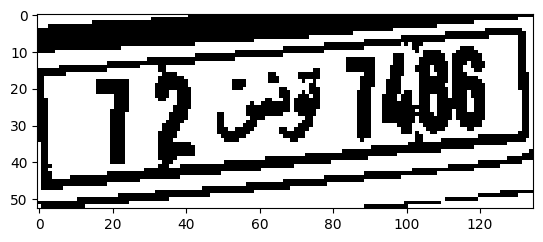

Detected License Plate: 
Processing 71.jpg


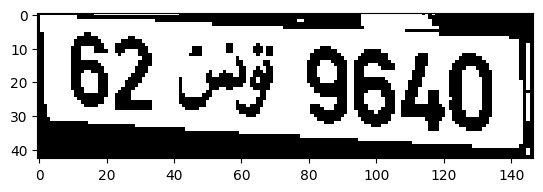

Detected License Plate: 62 9 9640 |
Processing 595.jpg


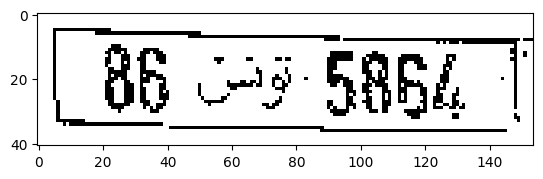

Detected License Plate: 86 9 5864 T
Processing 730.jpg


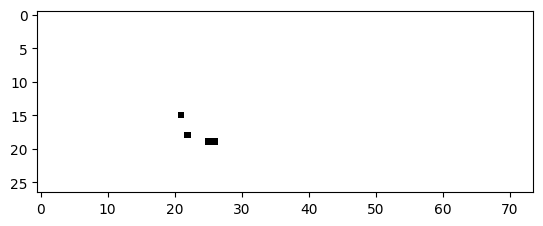

Detected License Plate: a
Processing 849.jpg


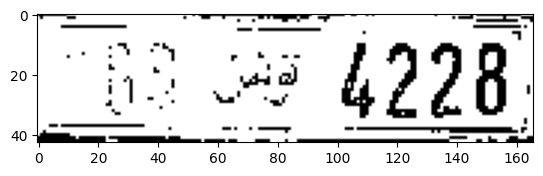

Detected License Plate: 
Processing 627.jpg


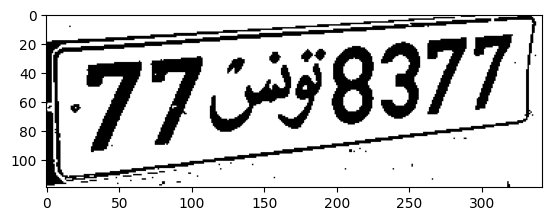

Detected License Plate: 
Processing 141.jpg


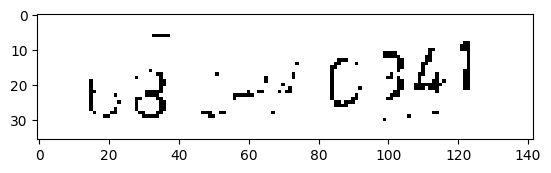

Detected License Plate: ug cf 6341
Processing 21.jpg


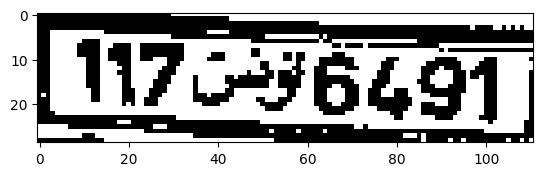

Detected License Plate: M7649 |
Processing 500.jpg


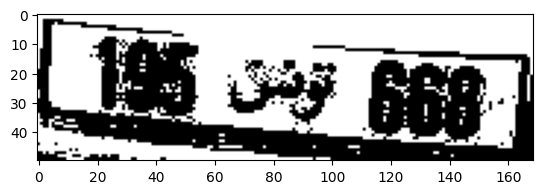

Detected License Plate: 
Processing 881.jpg


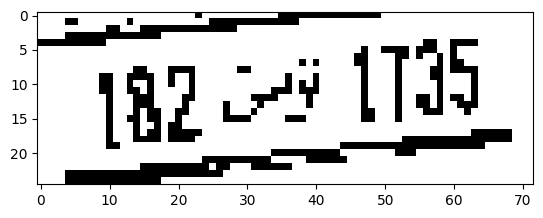

Detected License Plate: 
Processing 631.jpg


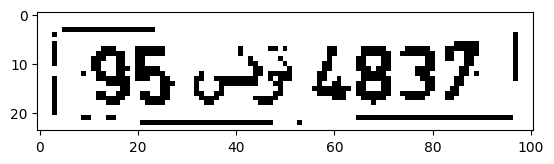

Detected License Plate: 1-95 39 4837 !
Processing 503.jpg


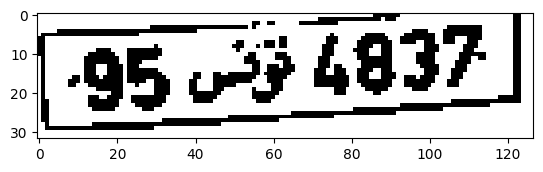

Detected License Plate: 
Processing 898.jpg


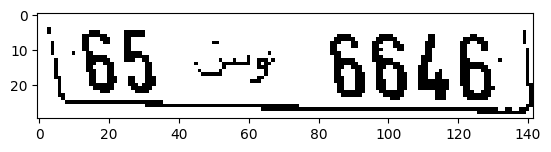

Detected License Plate: ($5 =» 8646
Processing 620.jpg


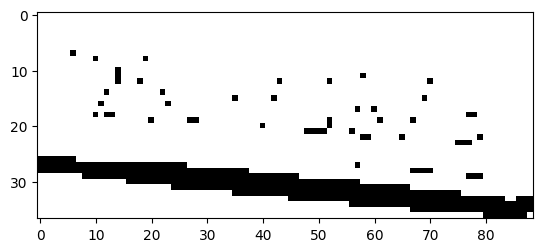

Detected License Plate: 
Processing 896.jpg


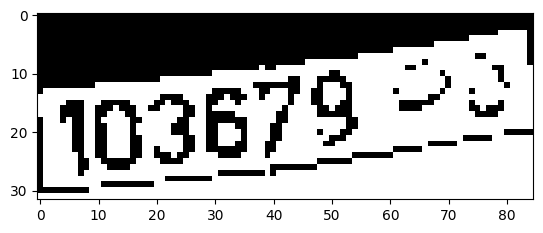

Detected License Plate: 1036732
Processing 184.jpg


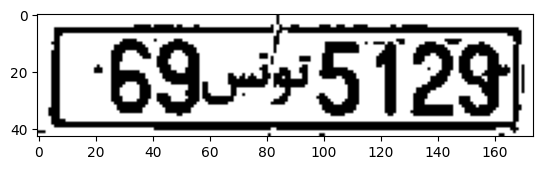

Detected License Plate: [69.5 129]
Processing 126.jpg


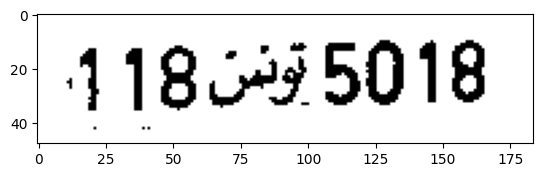

Detected License Plate: 1185475018
Processing 879.jpg


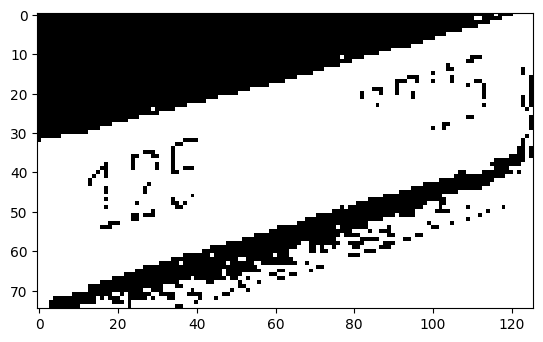

Detected License Plate: 
Processing 228.jpg


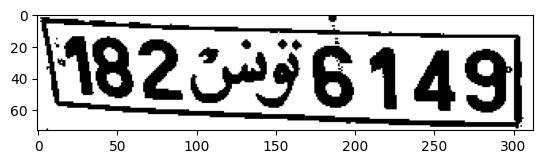

Detected License Plate: 182256149
Processing 381.jpg


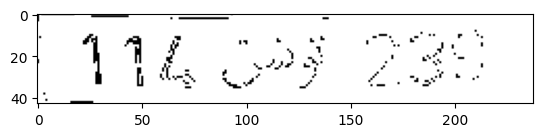

Detected License Plate: 4d cer Ps
Processing 651.jpg


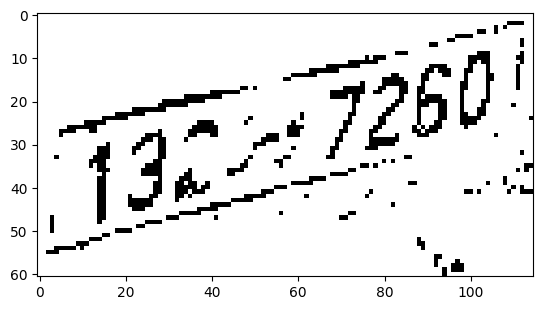

Detected License Plate: 
Processing 418.jpg


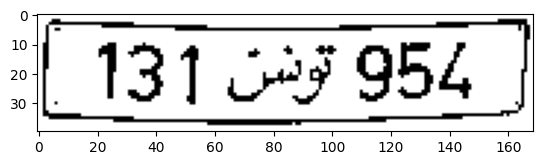

Detected License Plate: 131 SAF 954
Processing 548.jpg


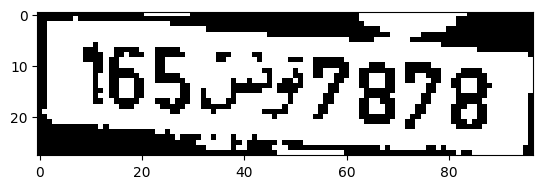

Detected License Plate: 1655557878 |
Processing 385.jpg


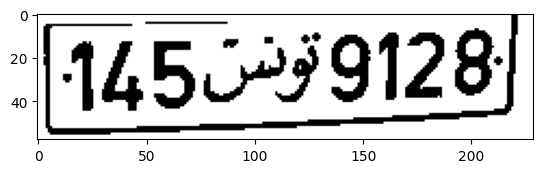

Detected License Plate: 1450499128:
Processing 741.jpg


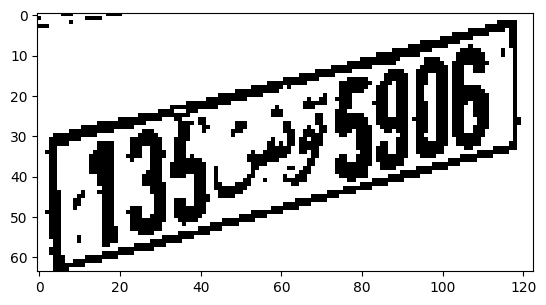

Detected License Plate: ree
Processing 468.jpg


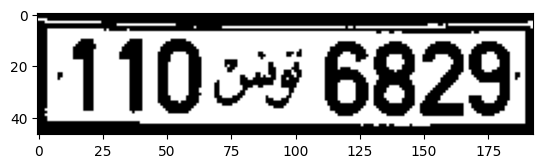

Detected License Plate: 11004 6829!
Processing 278.jpg


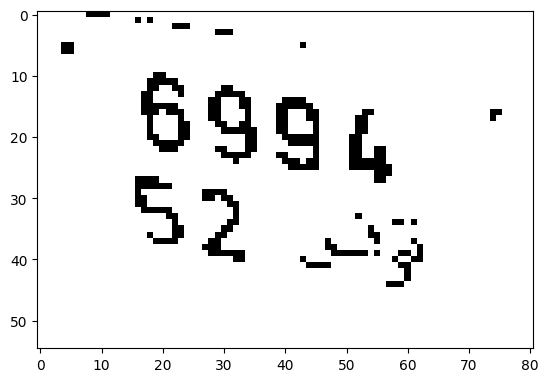

Detected License Plate: «B94:
Processing 166.jpg


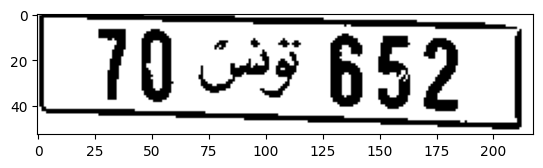

Detected License Plate: 10 5 652
Processing 743.jpg


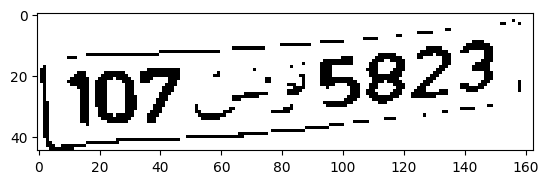

Detected License Plate: 1072275823.
Processing 400.jpg


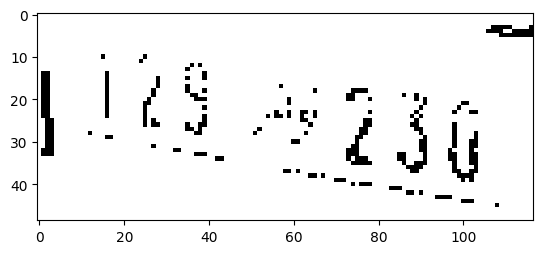

Detected License Plate: pies “2G
Processing 257.jpg


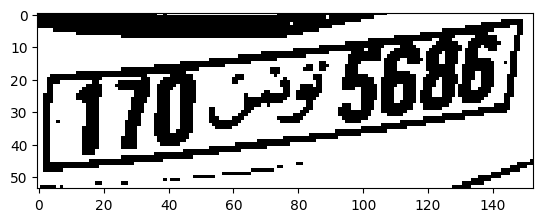

Detected License Plate: 
Processing 235.jpg


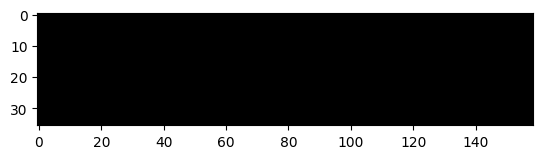

Detected License Plate: ee
Processing 160.jpg


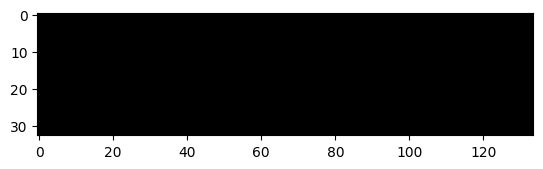

Detected License Plate: OS
Processing 209.jpg


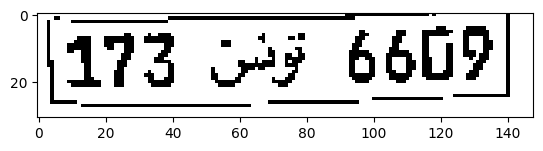

Detected License Plate: {473 cA¥ 6609)
Processing 138.jpg


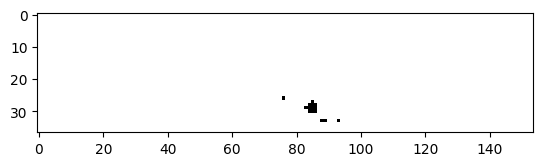

Detected License Plate: .
Processing 740.jpg


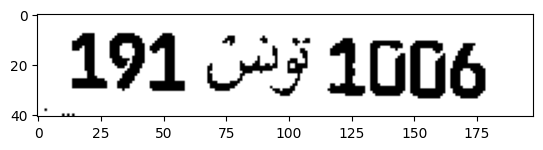

Detected License Plate: 191 53 1006
Processing 364.jpg


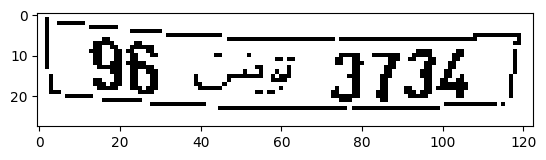

Detected License Plate: (95 Sr 3734 |
Processing 164.jpg


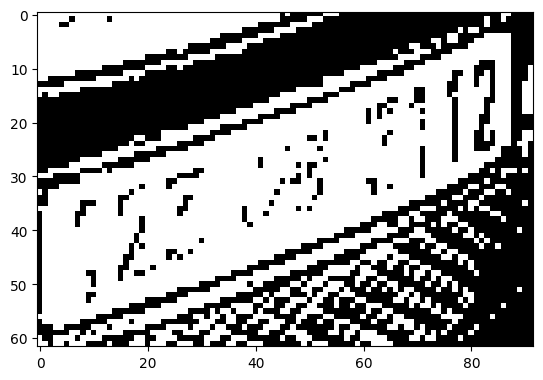

Detected License Plate: 
Processing 716.jpg


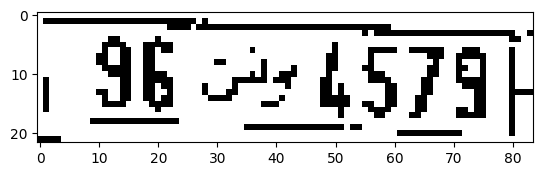

Detected License Plate: 
Processing 636.jpg


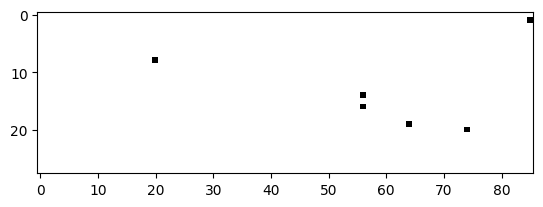

Detected License Plate: a
Processing 330.jpg


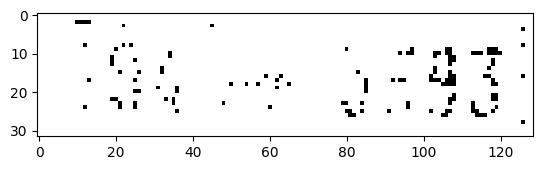

Detected License Plate: 
Processing 408.jpg


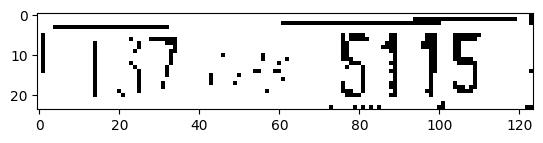

Detected License Plate: Mystere SF15 |
Processing 599.jpg


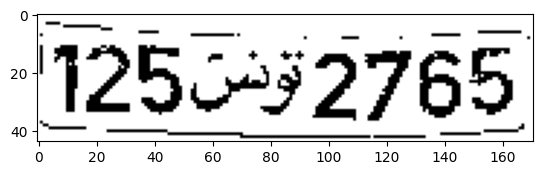

Detected License Plate: 125552765
Processing 483.jpg


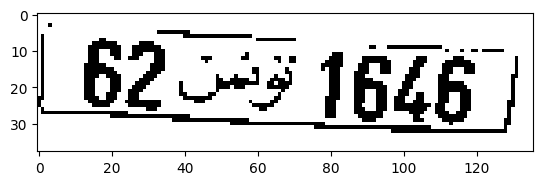

Detected License Plate: 625-5 16267
Processing 495.jpg


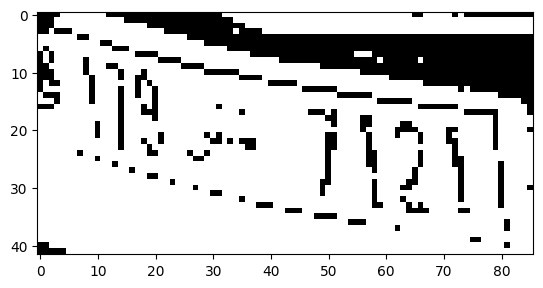

Detected License Plate: om
Processing 163.jpg


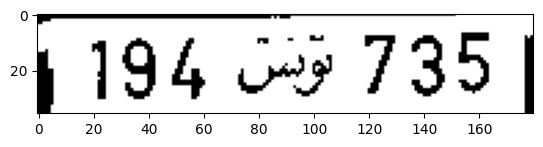

Detected License Plate: 1194 Oey 735 |
Processing 272.jpg


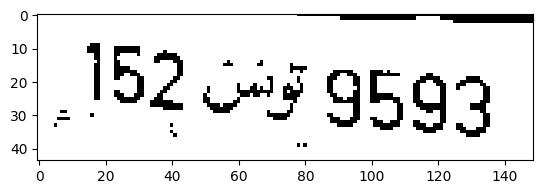

Detected License Plate: 152 545 9593
Processing 514.jpg


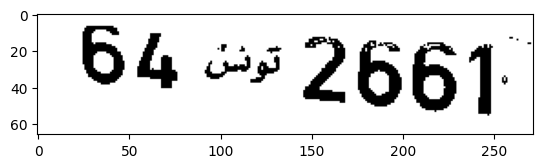

Detected License Plate: 64 5 2661.
Processing 614.jpg


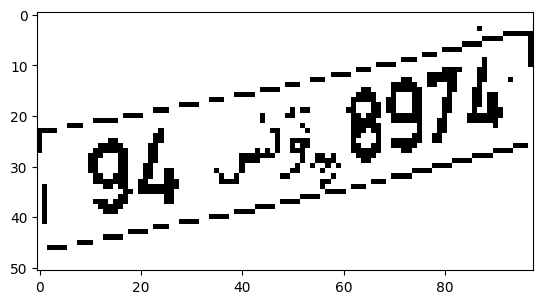

Detected License Plate: pe
Processing 217.jpg


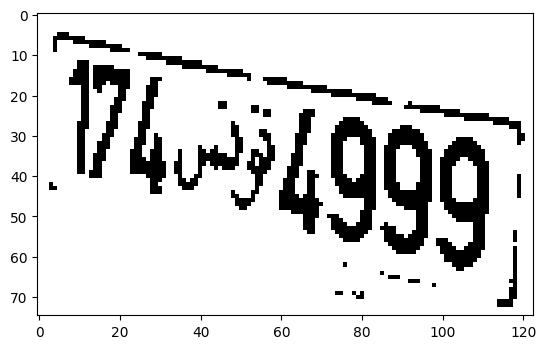

Detected License Plate: Whesiag9
Processing 154.jpg


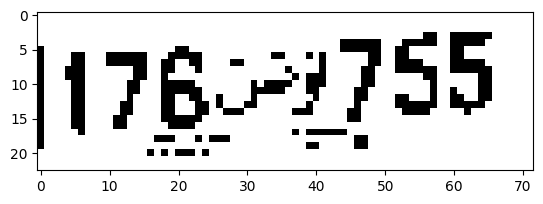

Detected License Plate: 176254755
Processing 410.jpg


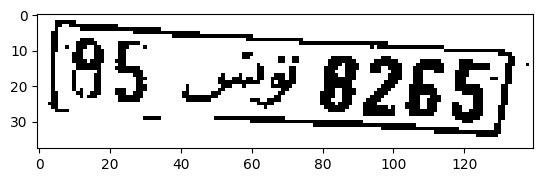

Detected License Plate: (85 49 6265)
Processing 274.jpg


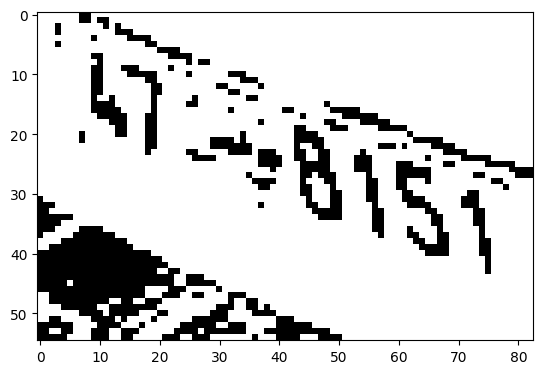

Detected License Plate: 
Processing 496.jpg


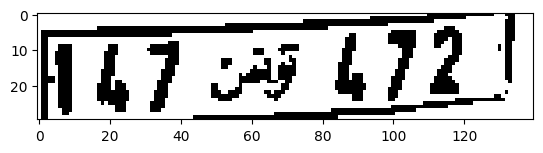

Detected License Plate: ha? 472!
Processing 572.jpg


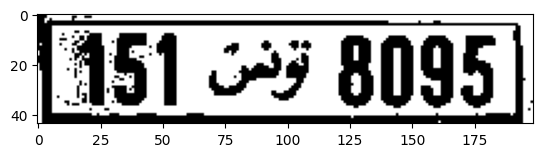

Detected License Plate: 451 249 8095
Processing 80.jpg


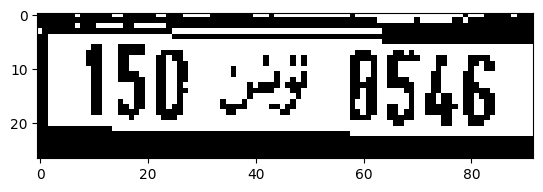

Detected License Plate: 150 23 546
Processing 256.jpg


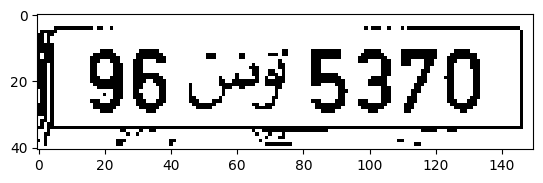

Detected License Plate: [ 96 5595370
Processing 83.jpg


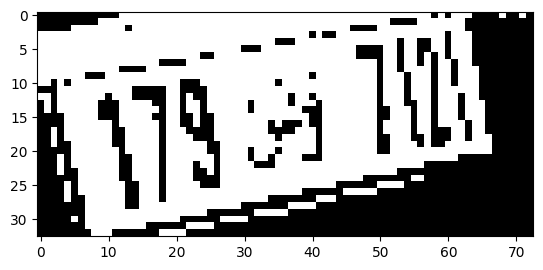

Detected License Plate: it a Ay
Processing 815.jpg


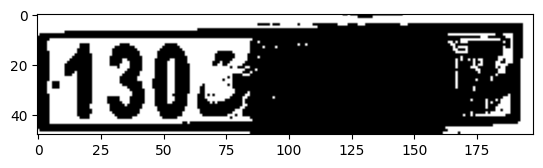

Detected License Plate: 130 a
Processing 230.jpg


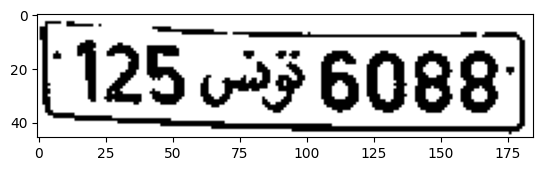

Detected License Plate: [125 35 6088)
Processing 621.jpg


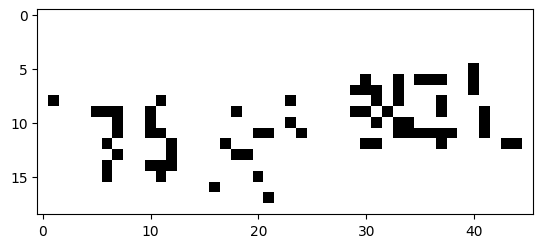

Detected License Plate: 3g
Processing 674.jpg


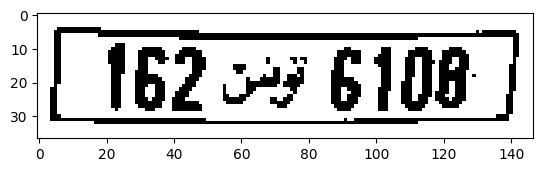

Detected License Plate: 162-7 6108
Processing 265.jpg


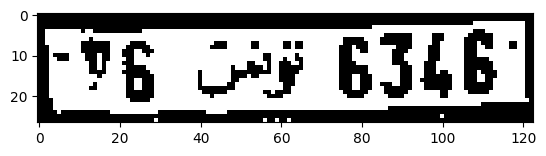

Detected License Plate: r?g OFF 6346"
Processing 33.jpg


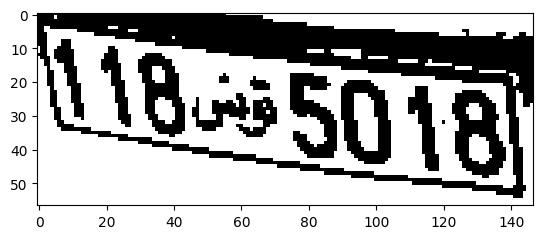

Detected License Plate: Mes5o 1B
Processing 339.jpg


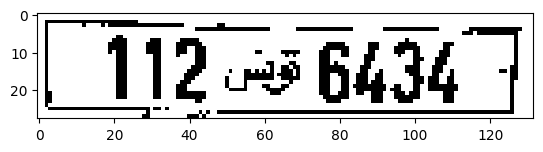

Detected License Plate: [112 35 6434
Processing 57.jpg


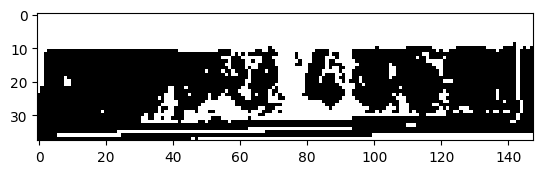

Detected License Plate: 
Processing 653.jpg


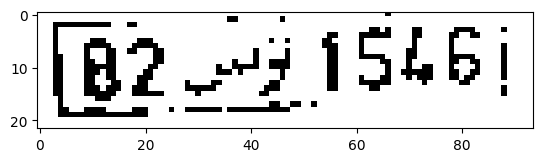

Detected License Plate: (B27 1546)
Processing 821.jpg


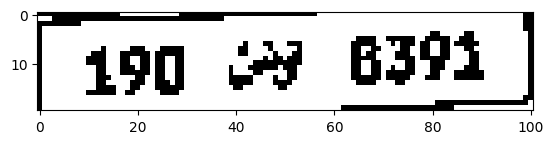

Detected License Plate: 190 AF 6392
Processing 19.jpg


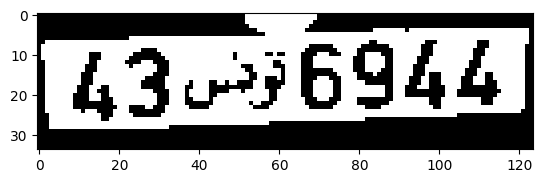

Detected License Plate: 63036944
Processing 365.jpg


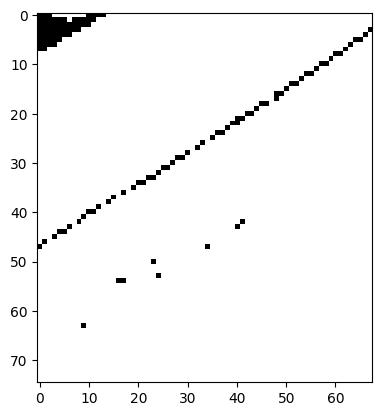

Detected License Plate: SA
Processing 300.jpg


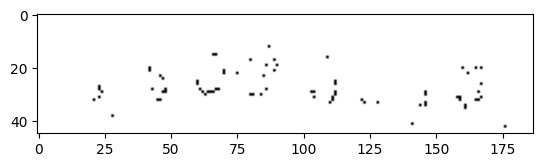

Detected License Plate: se Baa
Processing 831.jpg


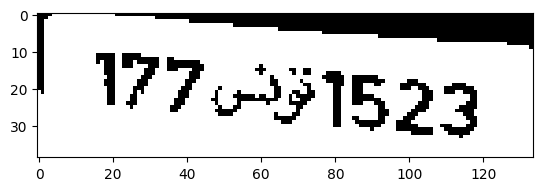

Detected License Plate: 1 177.251523
Processing 582.jpg


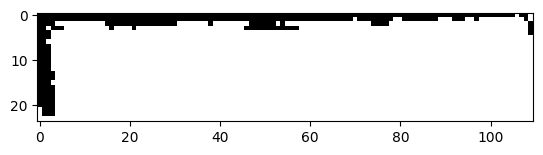

Detected License Plate: bP
Processing 348.jpg


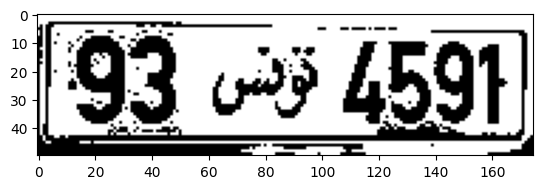

Detected License Plate: [93.95 4591
Processing 712.jpg


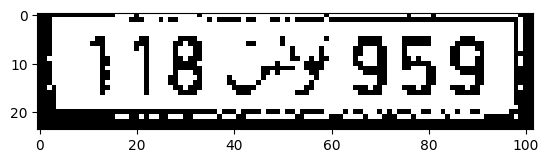

Detected License Plate: 4182959}
Processing 315.jpg


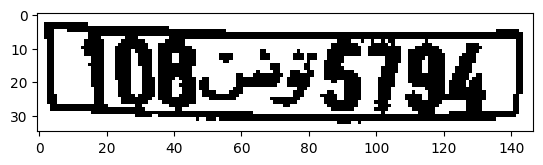

Detected License Plate: [10875794 )
Processing 873.jpg


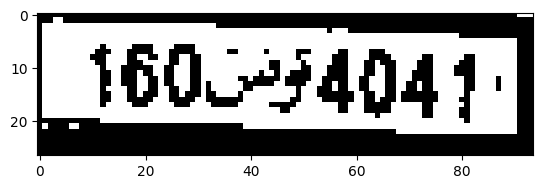

Detected License Plate: 
Processing 237.jpg


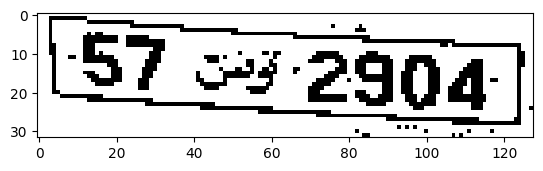

Detected License Plate: 
Processing 409.jpg


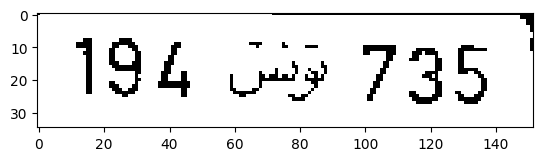

Detected License Plate: 194 Gay 735_
Processing 902.jpg


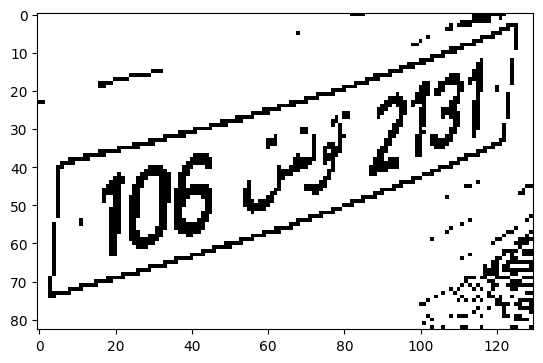

Detected License Plate: 
Processing 96.jpg


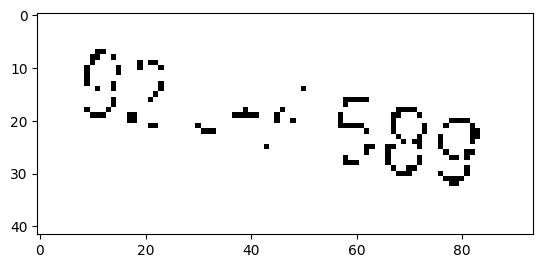

Detected License Plate: 82 ae 589
Processing 129.jpg


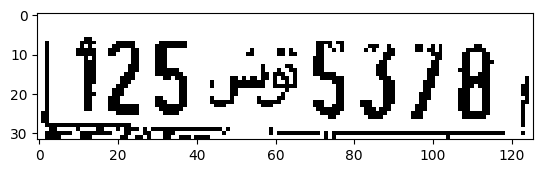

Detected License Plate: 112585378
Processing 266.jpg


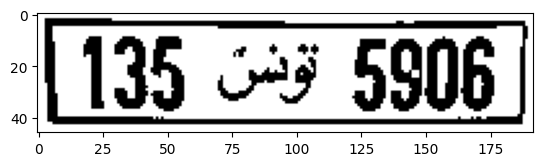

Detected License Plate: 135 &5 5906
Processing 9.jpg


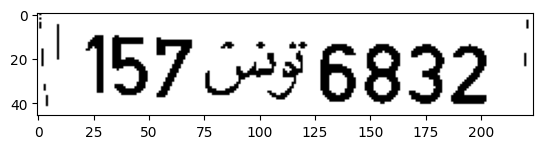

Detected License Plate: | 157 5556832
Processing 375.jpg


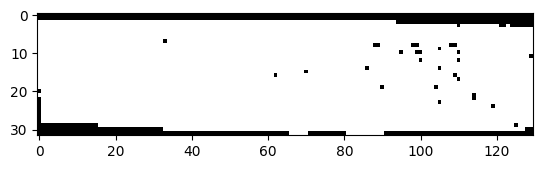

Detected License Plate: ee
Processing 532.jpg


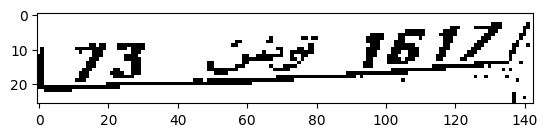

Detected License Plate: 
Processing 726.jpg


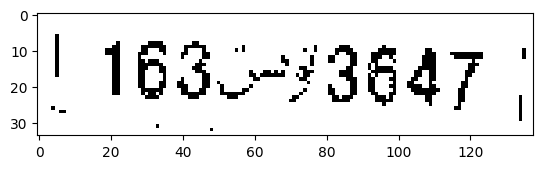

Detected License Plate: | 1635-73647 |
Processing 76.jpg


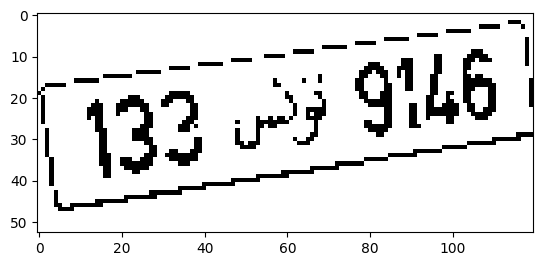

Detected License Plate: 
Processing 282.jpg


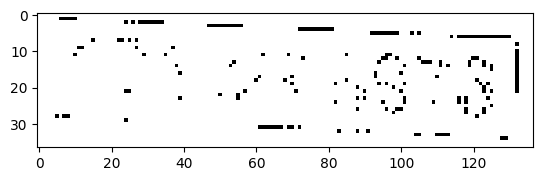

Detected License Plate: ee =|
Processing 871.jpg


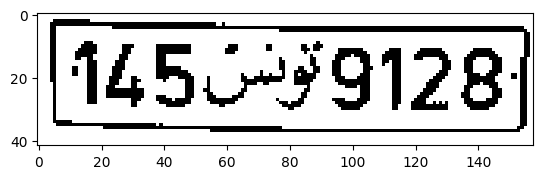

Detected License Plate: 145.499128;
Processing 474.jpg


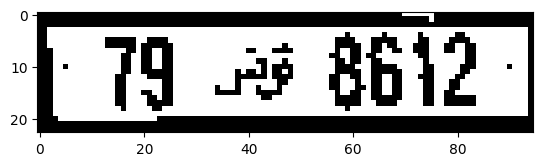

Detected License Plate: 79 75 8612
Processing 733.jpg


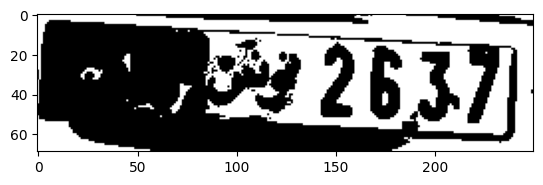

Detected License Plate: 
Processing 229.jpg


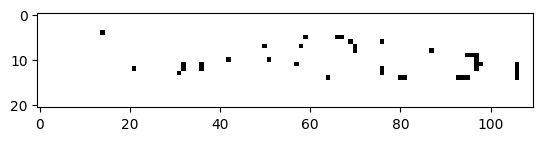

Detected License Plate: 
Processing 827.jpg


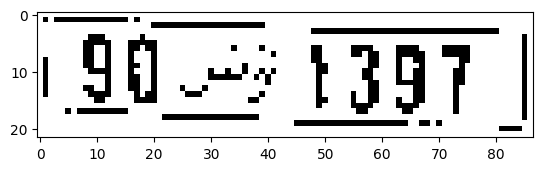

Detected License Plate: | 90 =) 1397 |
Processing 515.jpg


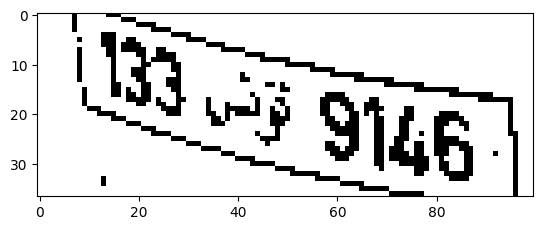

Detected License Plate: Baw
Processing 729.jpg


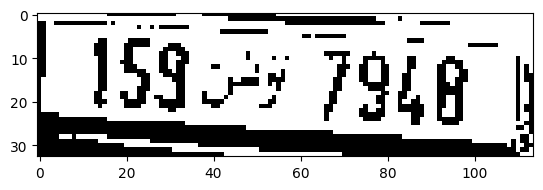

Detected License Plate: 15927 7948 |
Processing 715.jpg


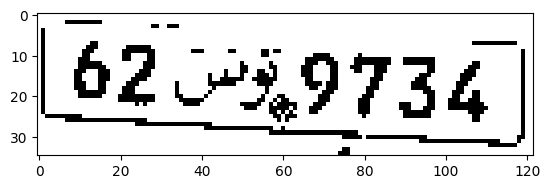

Detected License Plate: 
Processing 277.jpg


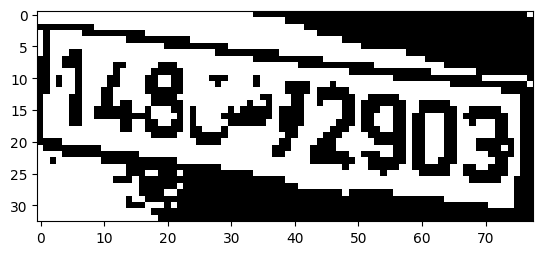

Detected License Plate: M8 I2gn3
Processing 136.jpg


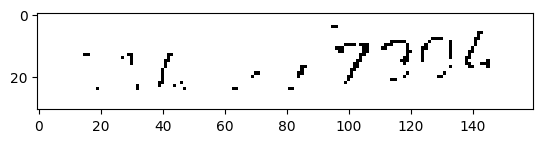

Detected License Plate: tp PINE
Processing 703.jpg


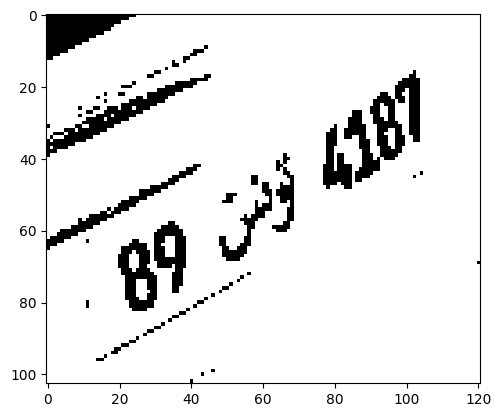

Detected License Plate: 
Processing 508.jpg


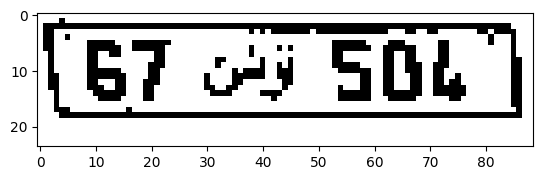

Detected License Plate: 87 5 S04
Processing 782.jpg


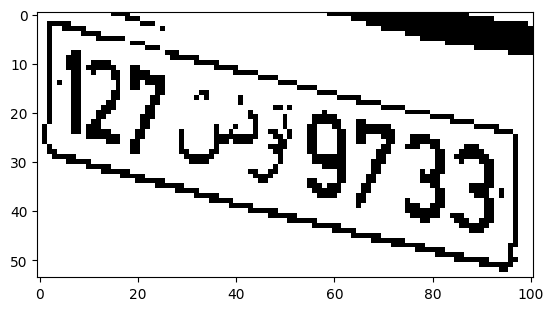

Detected License Plate: ear
Processing 842.jpg


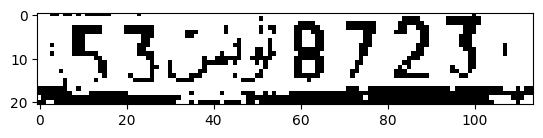

Detected License Plate: Bag B 725°
Processing 318.jpg


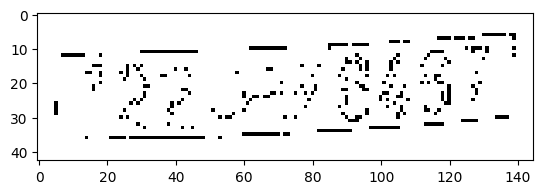

Detected License Plate: ESR use
Processing 872.jpg


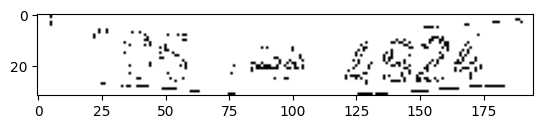

Detected License Plate: “Soa ZERe
Processing 171.jpg


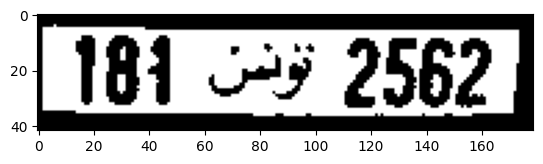

Detected License Plate: 181 5-5 2562
Processing 664.jpg


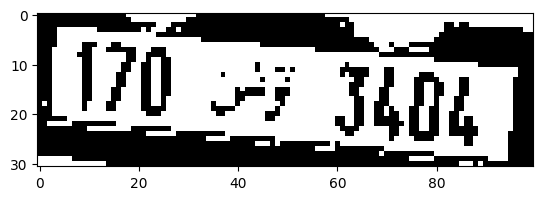

Detected License Plate: 
Processing 324.jpg


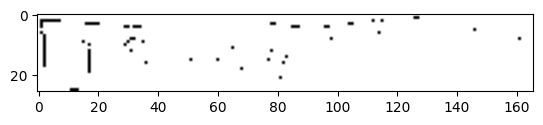

Detected License Plate: bpm ee
Processing 133.jpg


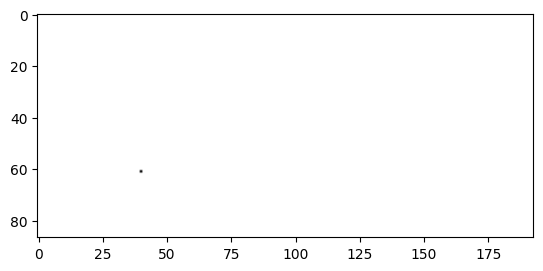

Detected License Plate: oe
Processing 20.jpg


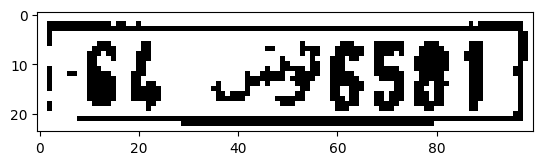

Detected License Plate: 6h 6581
Processing 295.jpg


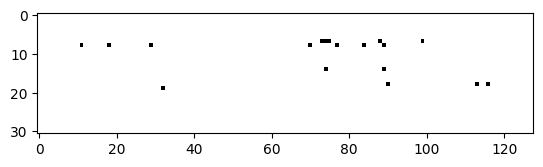

Detected License Plate: :
Processing 204.jpg


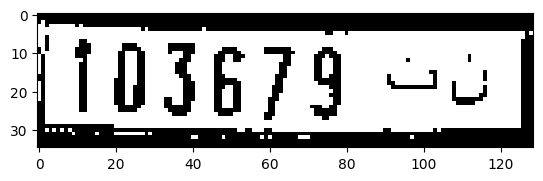

Detected License Plate: 103679 oo
Processing 537.jpg


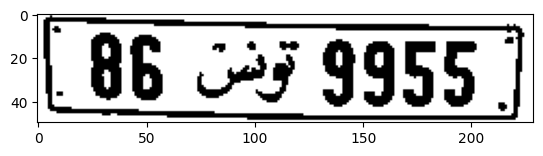

Detected License Plate: . 86 C47 9955 |
Processing 497.jpg


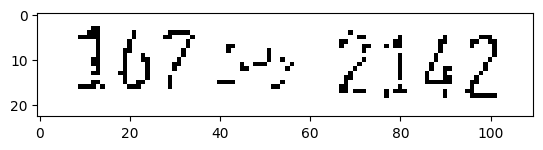

Detected License Plate: TO? + 2142
Processing 840.jpg


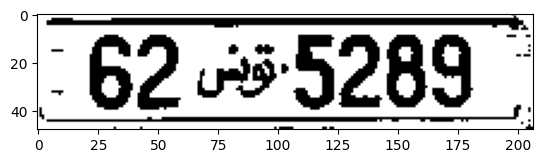

Detected License Plate: 62055289
Processing 370.jpg


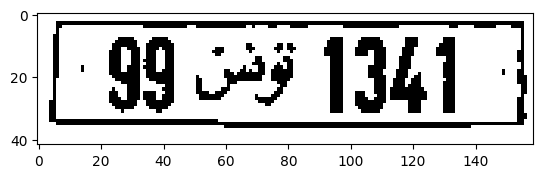

Detected License Plate: 99 39 1341
Processing 374.jpg


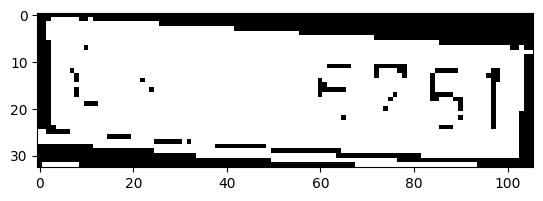

Detected License Plate: 
Processing 824.jpg


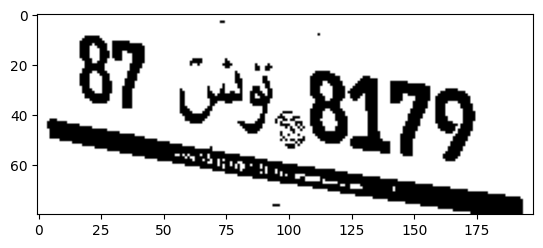

Detected License Plate: 
Processing 241.jpg


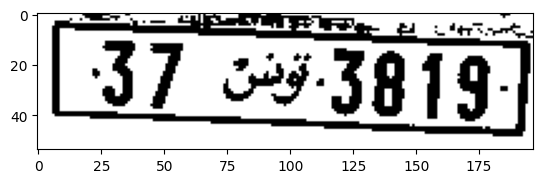

Detected License Plate: [37 249-3919]
Processing 322.jpg


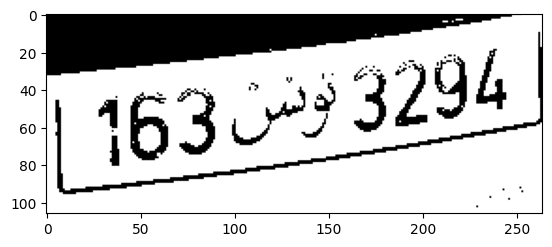

Detected License Plate: 1630? 3294
Processing 505.jpg


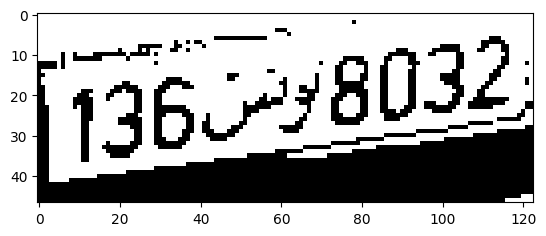

Detected License Plate: 1360-78032
Processing 78.jpg


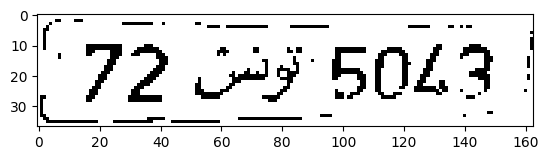

Detected License Plate: 72 AF 5OL3 |
Processing 60.jpg


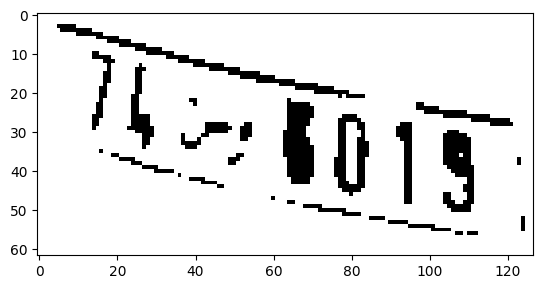

Detected License Plate: 
Processing 357.jpg


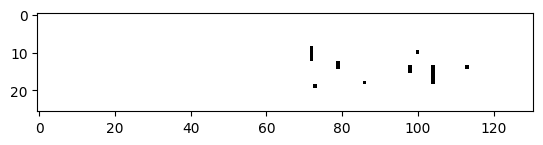

Detected License Plate: tea
Processing 794.jpg


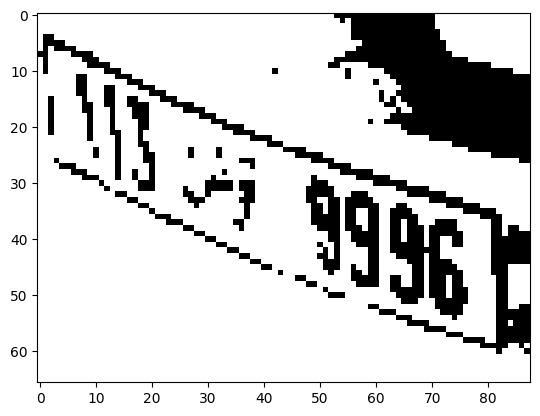

Detected License Plate: ag
Processing 652.jpg


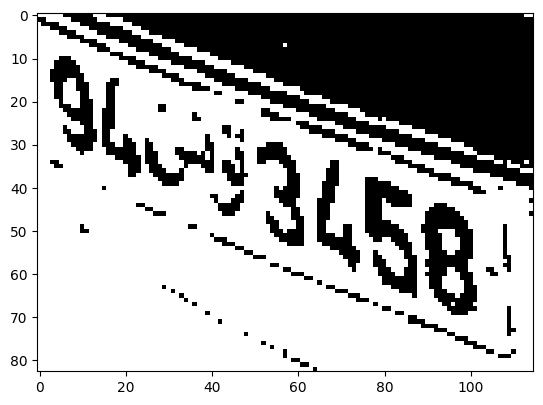

Detected License Plate: 
Processing 130.jpg


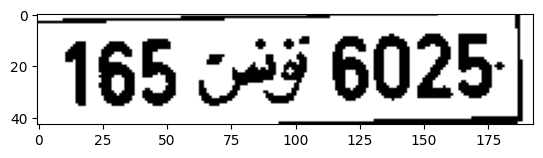

Detected License Plate: 165 <9 6025:
Processing 316.jpg


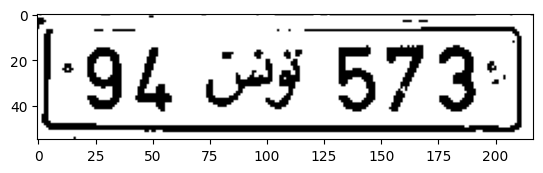

Detected License Plate: [94 oF 573°
Processing 94.jpg


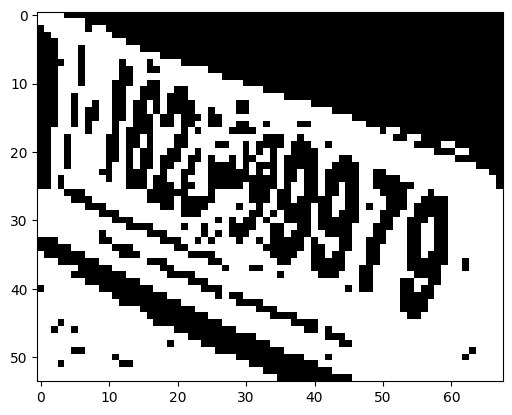

Detected License Plate: ean
Processing 638.jpg


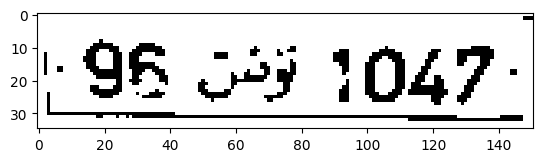

Detected License Plate: QB O59 1047-
Processing 50.jpg


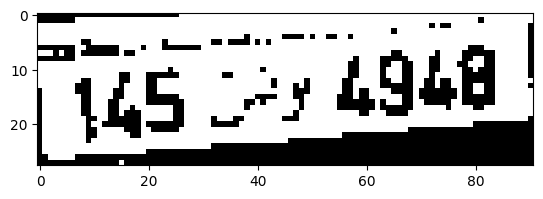

Detected License Plate: aS oy £98 |
Processing 762.jpg


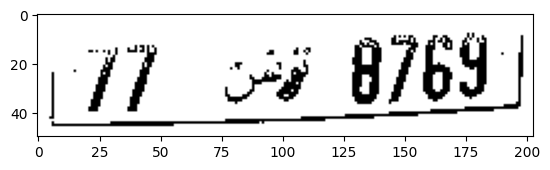

Detected License Plate: iT 8 8769
Processing 553.jpg


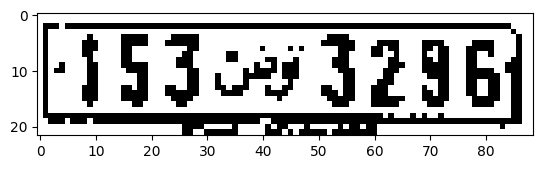

Detected License Plate: [15308 3296}
Processing 82.jpg


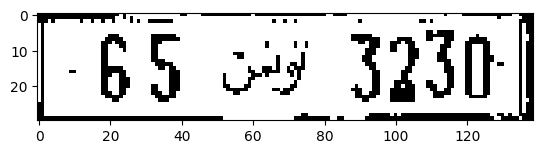

Detected License Plate: 65 ov 3230]
Processing 578.jpg


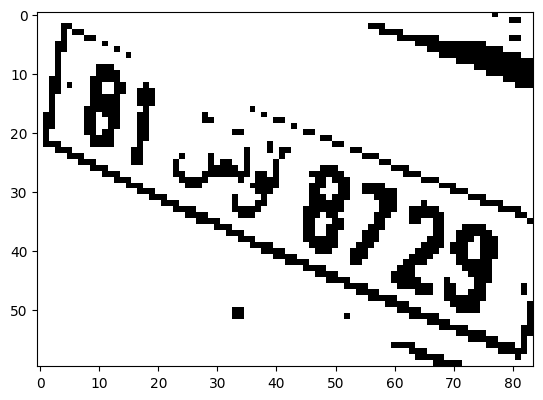

Detected License Plate: 
Processing 236.jpg


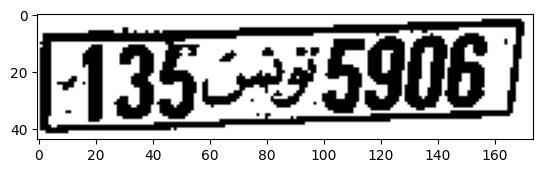

Detected License Plate: 4350275906
Processing 550.jpg


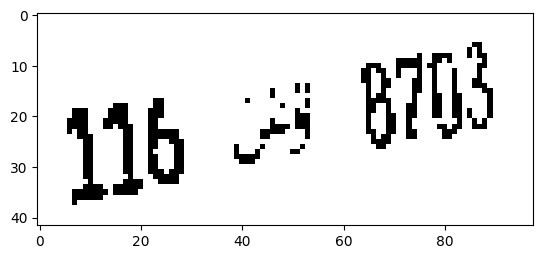

Detected License Plate: wip 3
Processing 61.jpg


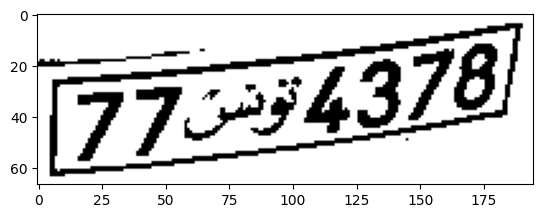

Detected License Plate: 
Processing 519.jpg


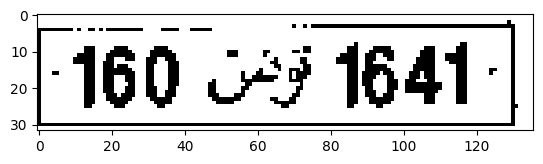

Detected License Plate: 160 c43 1641-
Processing 676.jpg


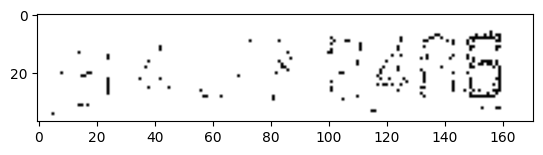

Detected License Plate: als FRG
Processing 832.jpg


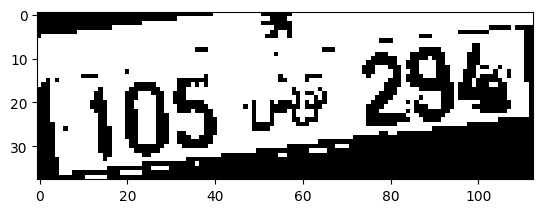

Detected License Plate: 305.28 29%
Processing 437.jpg


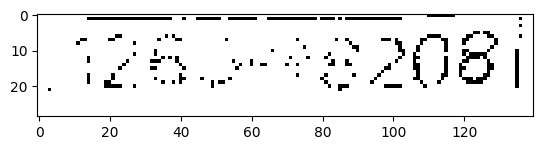

Detected License Plate: TB 8208 |
Processing 759.jpg


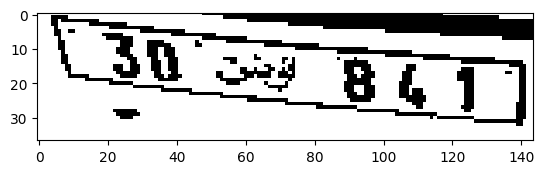

Detected License Plate: 
Processing 607.jpg


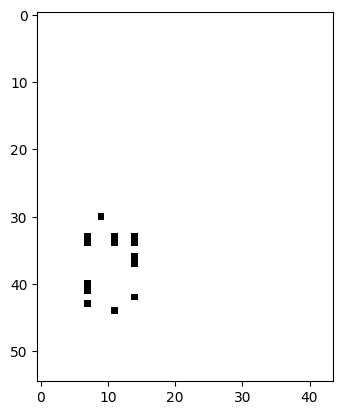

Detected License Plate: a
Processing 797.jpg


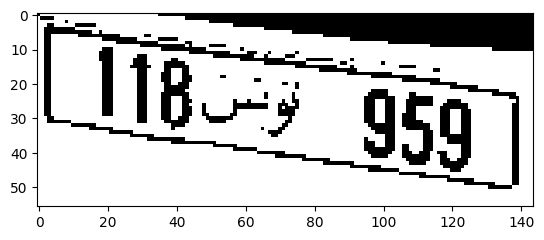

Detected License Plate: teary
Processing 74.jpg


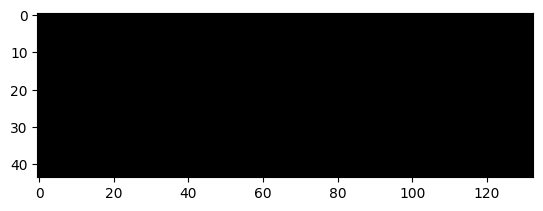

Detected License Plate: OO
Processing 764.jpg


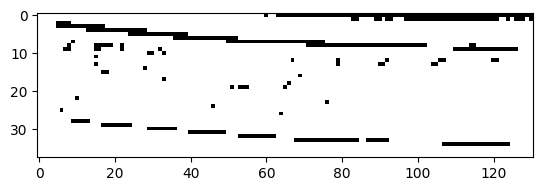

Detected License Plate: 
Processing 511.jpg


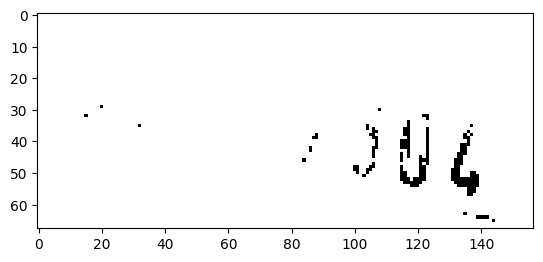

Detected License Plate: 306
Processing 455.jpg


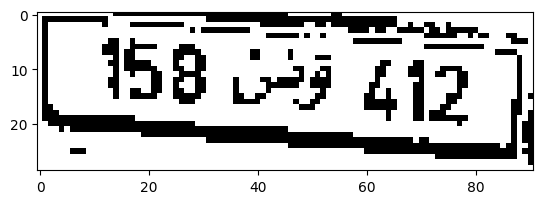

Detected License Plate: 58 42 ]
Processing 371.jpg


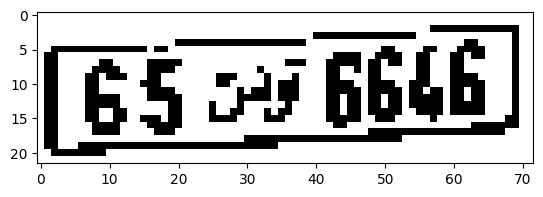

Detected License Plate: 
Processing 499.jpg


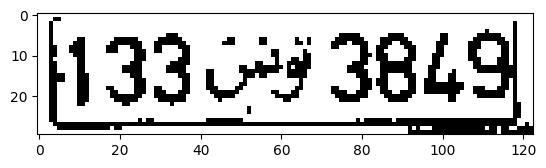

Detected License Plate: 133.047 3849,
Processing 360.jpg


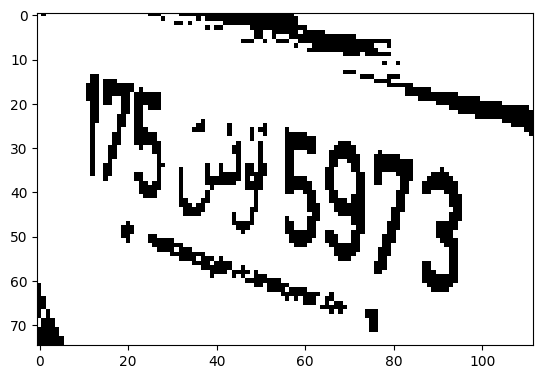

Detected License Plate: 
Processing 117.jpg


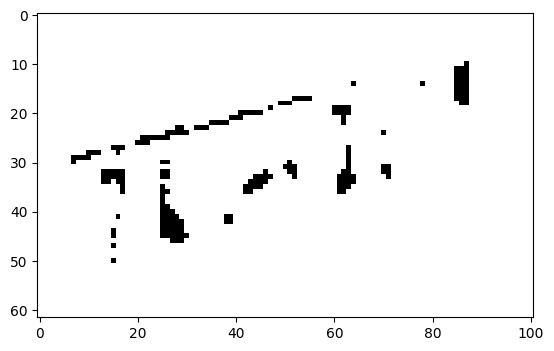

Detected License Plate: atek ‘
Processing 588.jpg


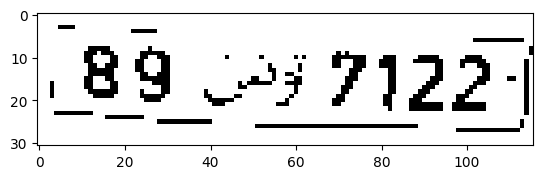

Detected License Plate: 83 5957122 |
Processing 852.jpg


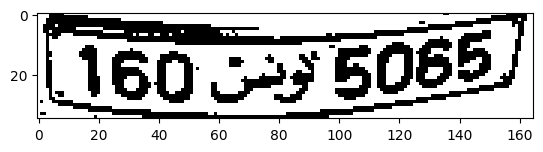

Detected License Plate: L160 cay 5068:
Processing 608.jpg


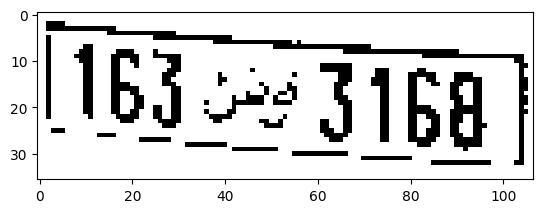

Detected License Plate: [16322 3168
Processing 212.jpg


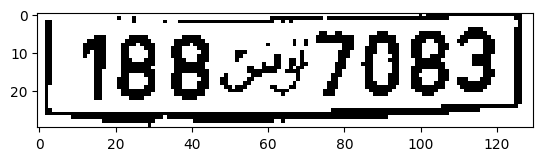

Detected License Plate: 18837083
Processing 306.jpg


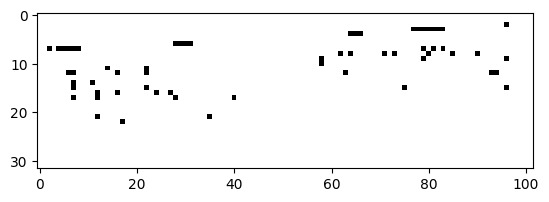

Detected License Plate: Fen!
Processing 7.jpg


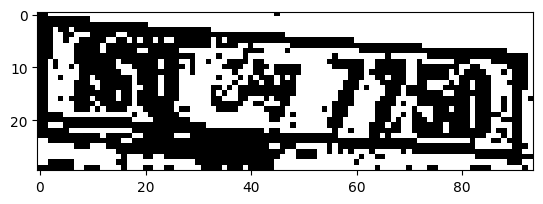

Detected License Plate: ESET
Processing 796.jpg


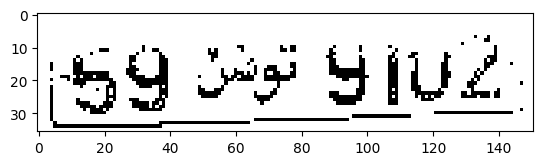

Detected License Plate: 69 Se Gud:
Processing 89.jpg


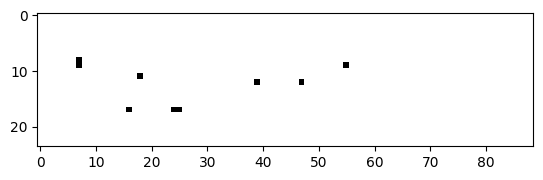

Detected License Plate: Se
Processing 471.jpg


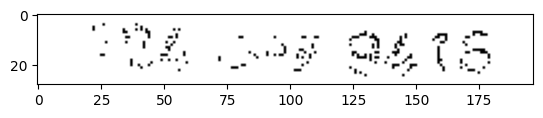

Detected License Plate: ME os OATS
Processing 469.jpg


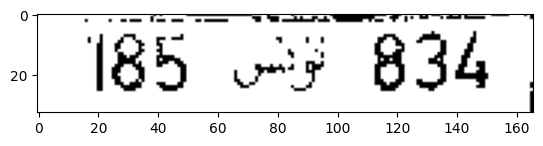

Detected License Plate: 185 oy 834_
Processing 36.jpg


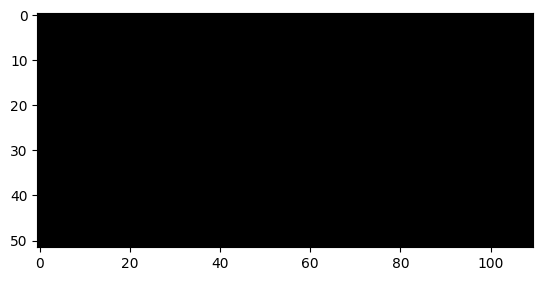

Detected License Plate: 
Processing 379.jpg


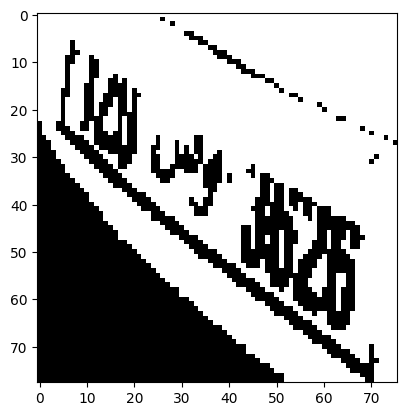

Detected License Plate: 
Processing 113.jpg


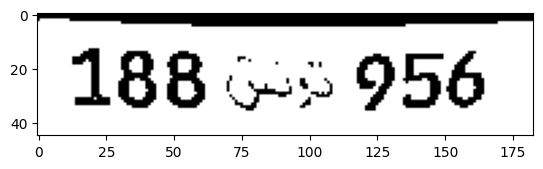

Detected License Plate: 188 G5 956
Processing 641.jpg


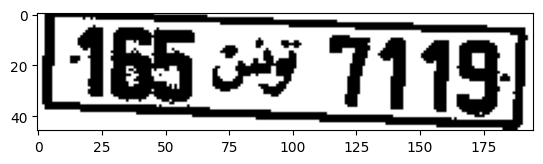

Detected License Plate: 165 69 7775)
Processing 825.jpg


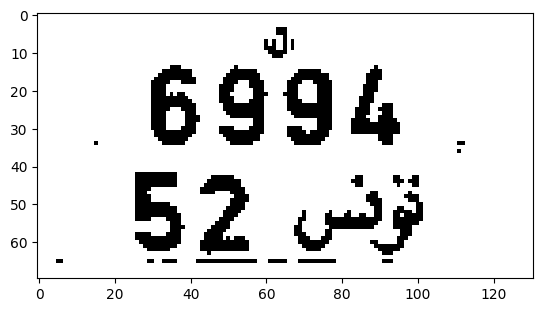

Detected License Plate: g994
Processing 633.jpg


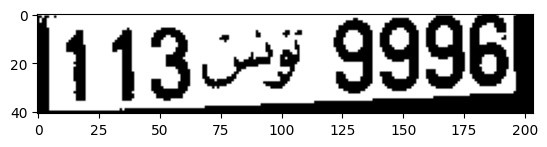

Detected License Plate: 1113.9 9996)
Processing 551.jpg


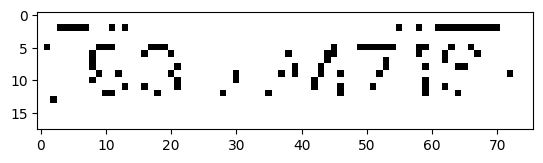

Detected License Plate: TER MAIR:
Processing 444.jpg


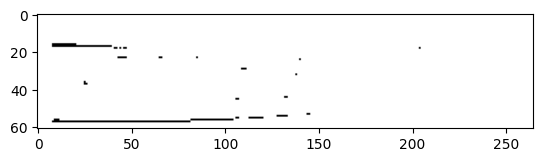

Detected License Plate: ee
Processing 660.jpg


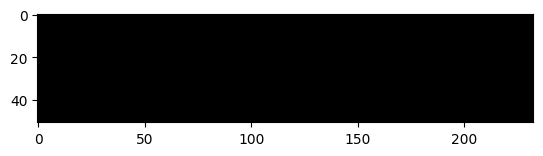

Detected License Plate: OS
Processing 43.jpg


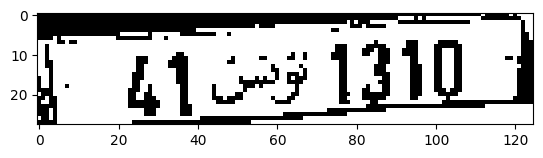

Detected License Plate: Yao 1310 4
Processing 90.jpg


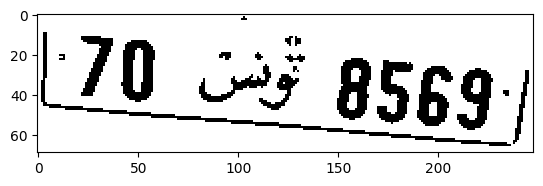

Detected License Plate: 70 5 8569;
Processing 1.jpg


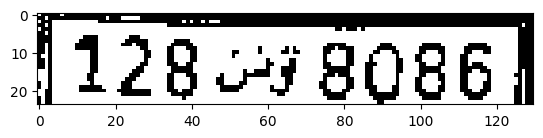

Detected License Plate: 128 37 8086 |
Processing 516.jpg


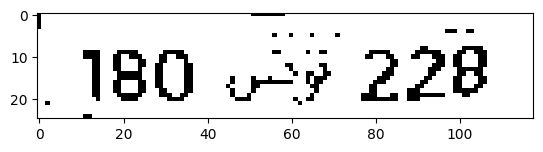

Detected License Plate: 180 we 228
Processing 388.jpg


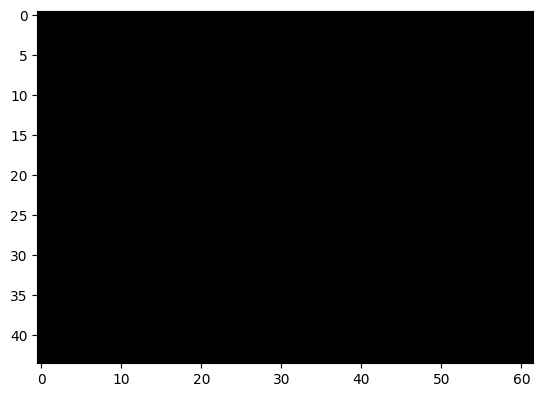

Detected License Plate: a
Processing 736.jpg


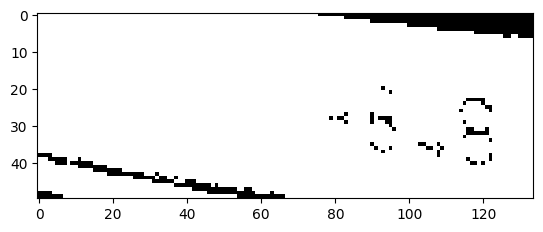

Detected License Plate: we EE
Processing 834.jpg


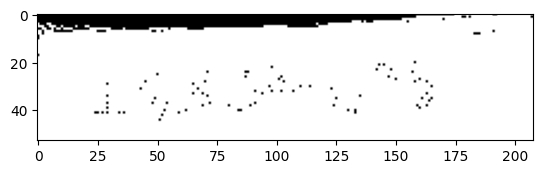

Detected License Plate: 
Processing 609.jpg


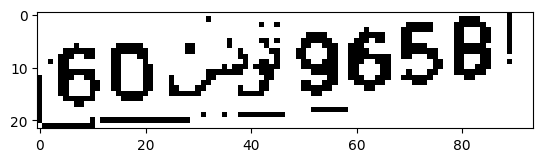

Detected License Plate: 600499658"
Processing 546.jpg


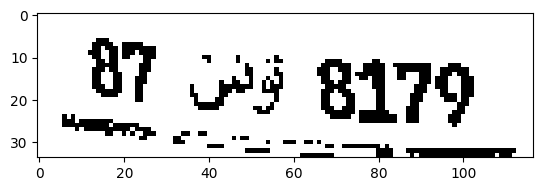

Detected License Plate: 2733 8179
Processing 683.jpg


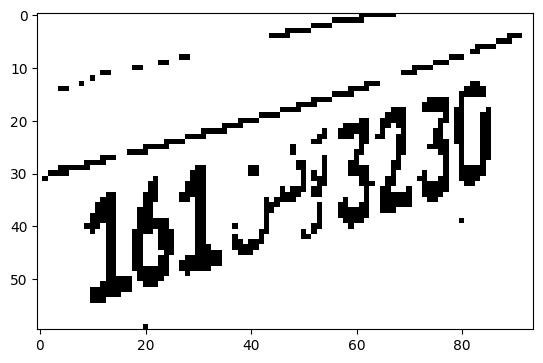

Detected License Plate: go
Processing 399.jpg


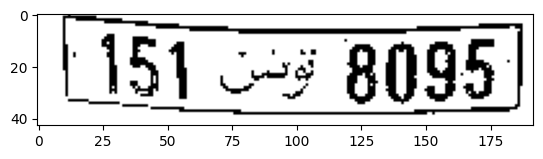

Detected License Plate: 1151 3 8095
Processing 534.jpg


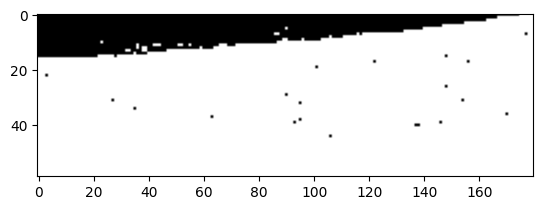

Detected License Plate: =
Processing 395.jpg


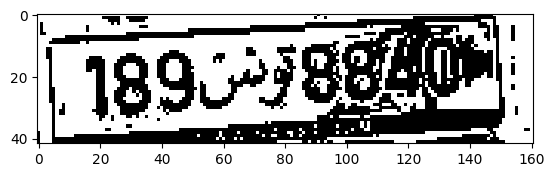

Detected License Plate: 
Processing 175.jpg


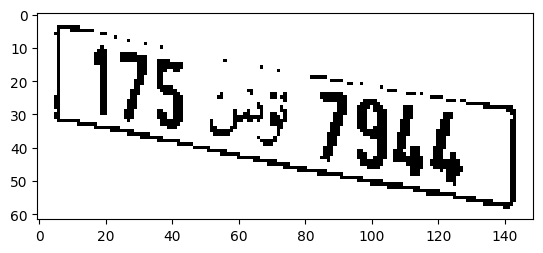

Detected License Plate: 195 3s Wie
Processing 722.jpg


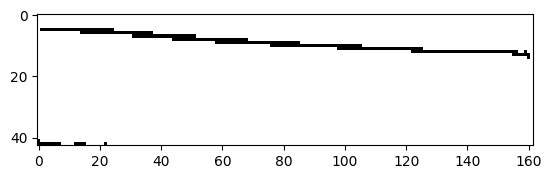

Detected License Plate: —
Processing 261.jpg


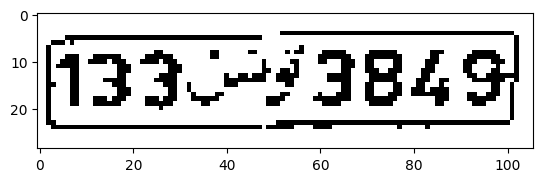

Detected License Plate: i3373849
Processing 421.jpg


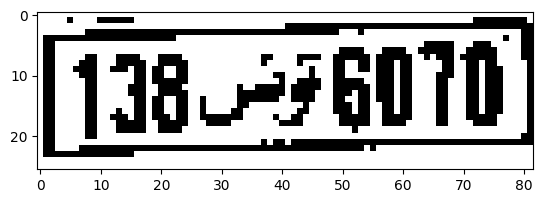

Detected License Plate: 13876070.
Processing 667.jpg


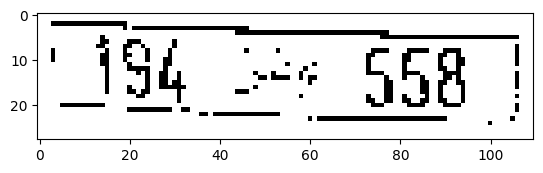

Detected License Plate: 
Processing 720.jpg


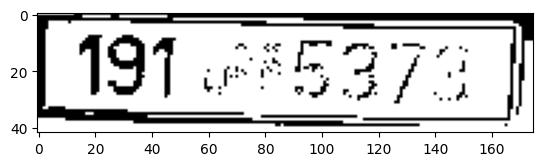

Detected License Plate: 197 5372 |
Processing 22.jpg


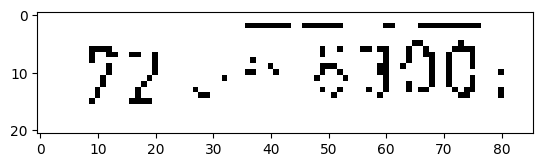

Detected License Plate: Fe o> BING:
Processing 678.jpg


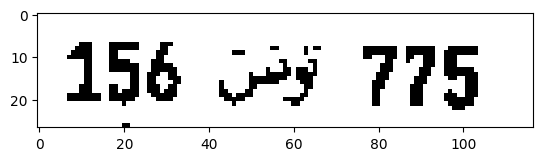

Detected License Plate: 156 3¥ 775
Processing 864.jpg


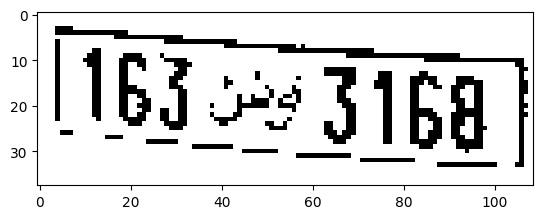

Detected License Plate: SERS
Processing 486.jpg


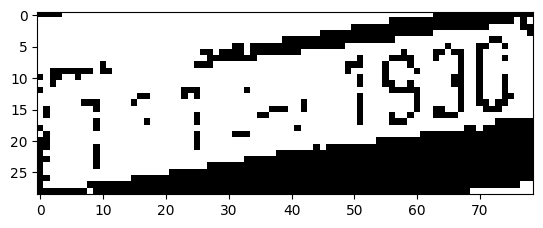

Detected License Plate: 
Processing 513.jpg


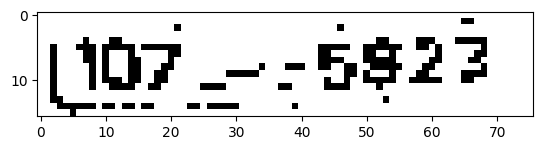

Detected License Plate: (107 _--5922
Processing 250.jpg


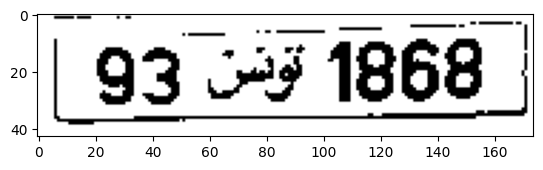

Detected License Plate: | 93 23 1868 |
Processing 3.jpg


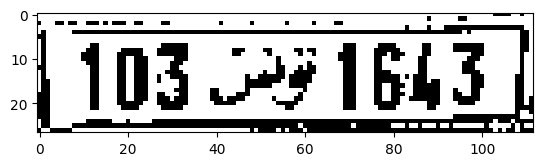

Detected License Plate: 103 097 1643 |
Processing 311.jpg


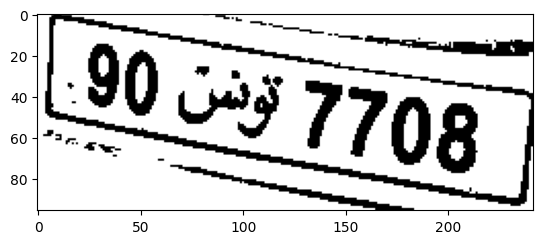

Detected License Plate: 90 B78
Processing 97.jpg


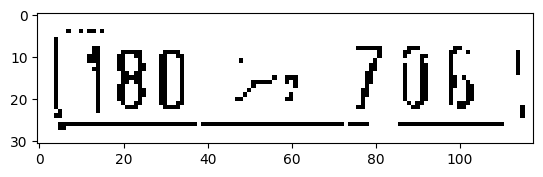

Detected License Plate: [180 =: 706 '
Processing 492.jpg


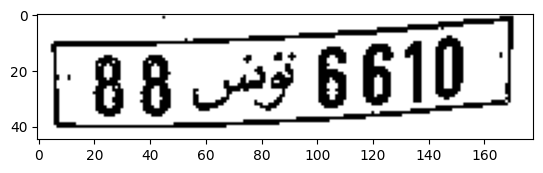

Detected License Plate: 88 047 6610
Processing 523.jpg


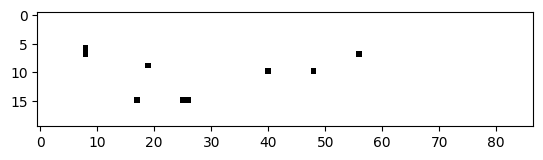

Detected License Plate: ee
Processing 863.jpg


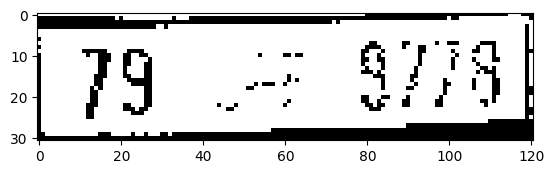

Detected License Plate: 79 F978]
Processing 665.jpg


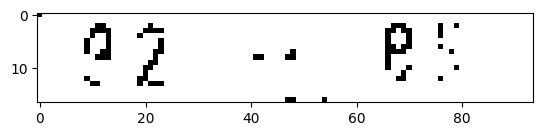

Detected License Plate: a7 -+ RE
Processing 739.jpg


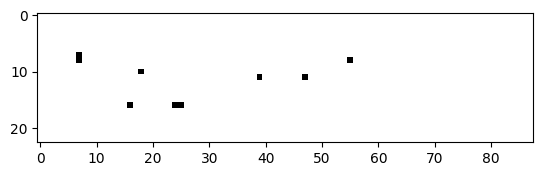

Detected License Plate: Te
Processing 894.jpg


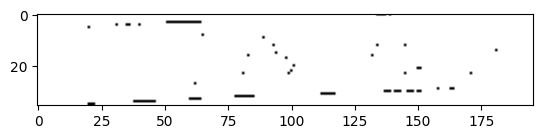

Detected License Plate: 
Processing 123.jpg


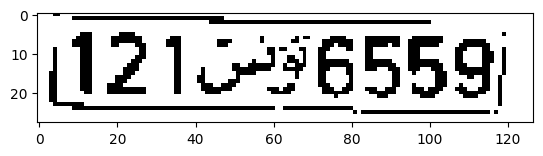

Detected License Plate: (1215-96559)
Processing 299.jpg


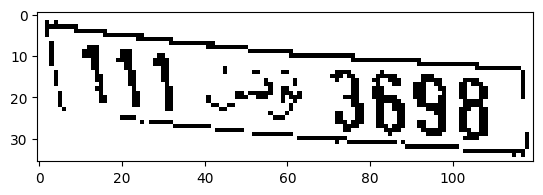

Detected License Plate: 
Processing 637.jpg


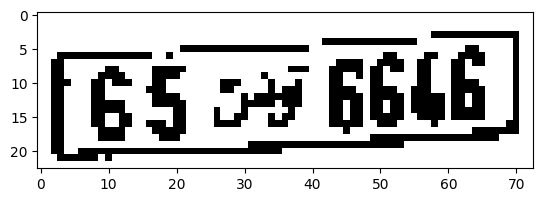

Detected License Plate: (es oy 666)
Processing 773.jpg


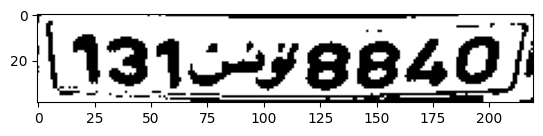

Detected License Plate: 11315478840)
Processing 560.jpg


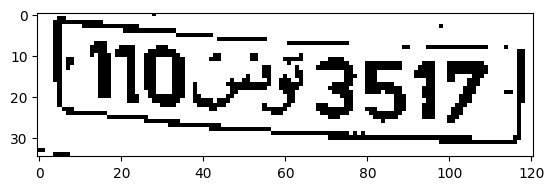

Detected License Plate: (NOs453517
Processing 58.jpg


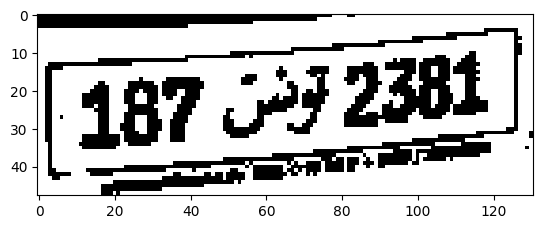

Detected License Plate: 
Processing 116.jpg


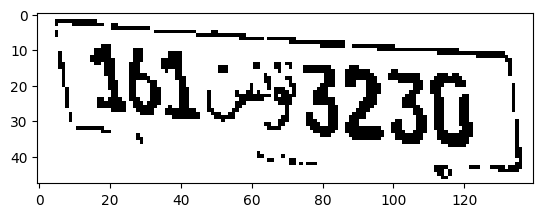

Detected License Plate: \Mbics323g)
Processing 270.jpg


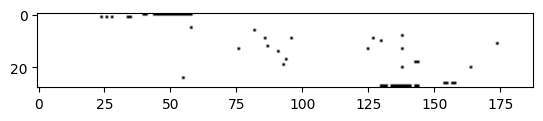

Detected License Plate: ots
Processing 159.jpg


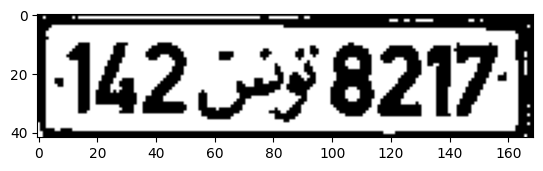

Detected License Plate: 142.543 8217;
Processing 227.jpg


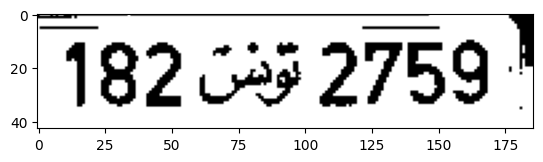

Detected License Plate: 182.535 2759"
Processing 100.jpg


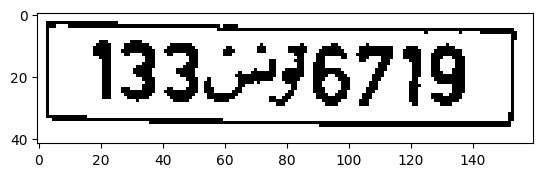

Detected License Plate: 13396719
Processing 398.jpg


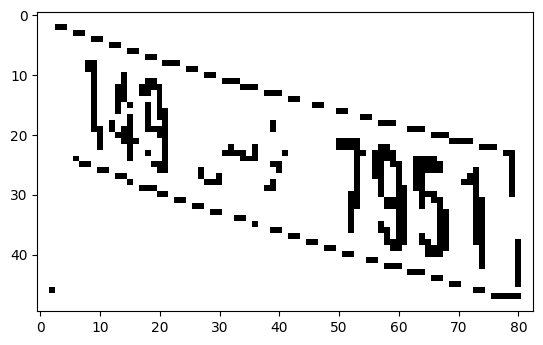

Detected License Plate: a ier
Processing 888.jpg


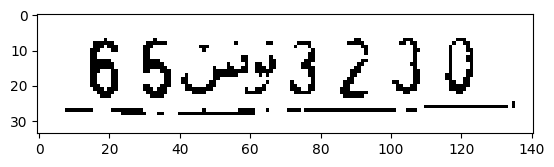

Detected License Plate: 65093230
Processing 207.jpg


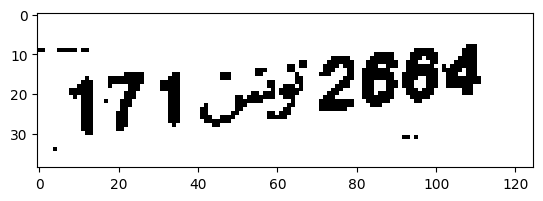

Detected License Plate: 171.559 2664
Processing 828.jpg


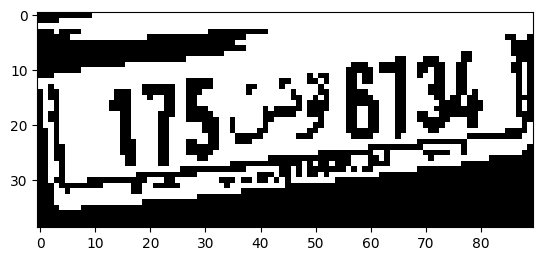

Detected License Plate: 53 34)
Processing 393.jpg


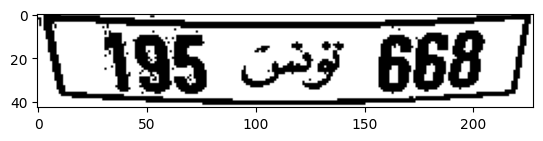

Detected License Plate: (495 co 668
Processing 457.jpg


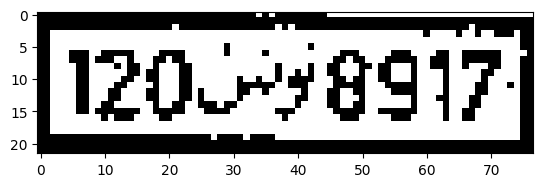

Detected License Plate: 12078917}
Processing 522.jpg


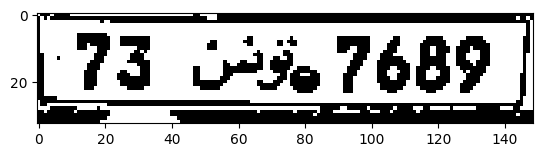

Detected License Plate: 73 5. 7689 |
Processing 819.jpg


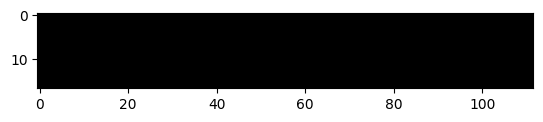

Detected License Plate: Be
Processing 789.jpg


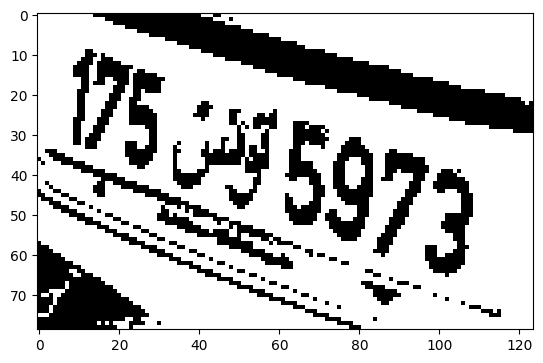

Detected License Plate: 
Processing 530.jpg


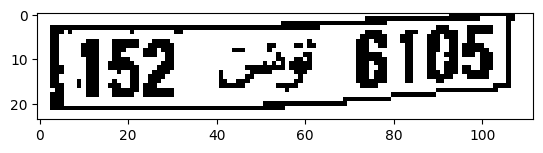

Detected License Plate: 
Processing 777.jpg


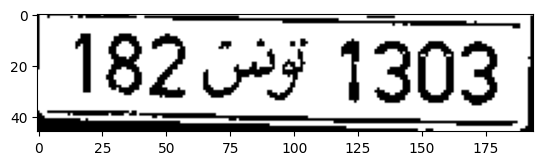

Detected License Plate: 182. 4F 1303,
Processing 308.jpg


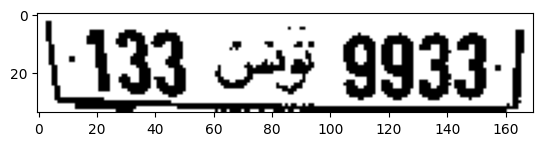

Detected License Plate: (133 443 9933.
Processing 310.jpg


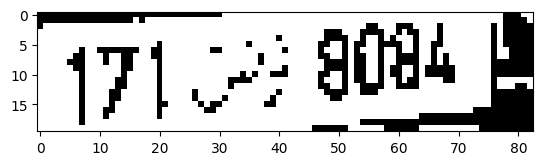

Detected License Plate: 47] 2 9084 B
Processing 462.jpg


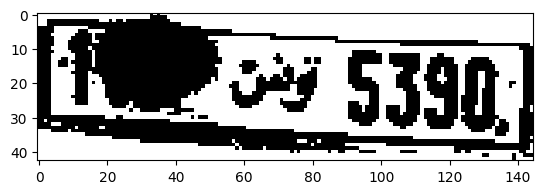

Detected License Plate: 
Processing 245.jpg


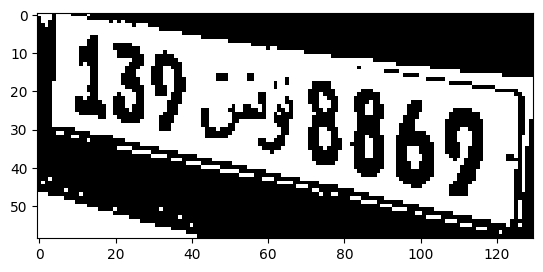

Detected License Plate: i) 88691
Processing 85.jpg


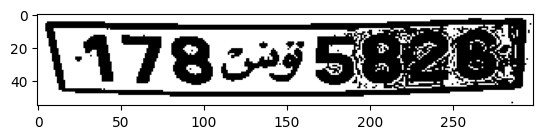

Detected License Plate: 
Processing 705.jpg


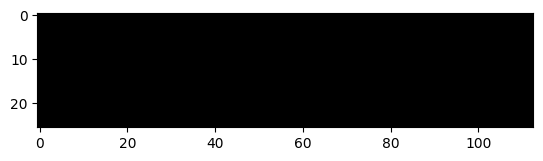

Detected License Plate: OB
Processing 597.jpg


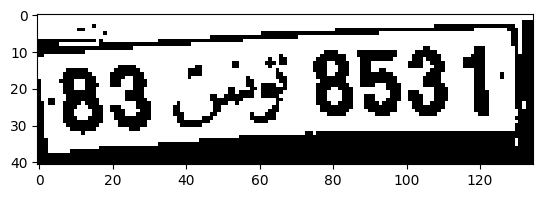

Detected License Plate: 83 23 8531)
Processing 527.jpg


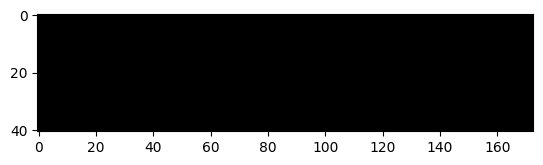

Detected License Plate: OS
Processing 325.jpg


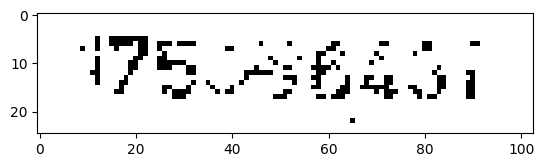

Detected License Plate: VRCABEST
Processing 280.jpg


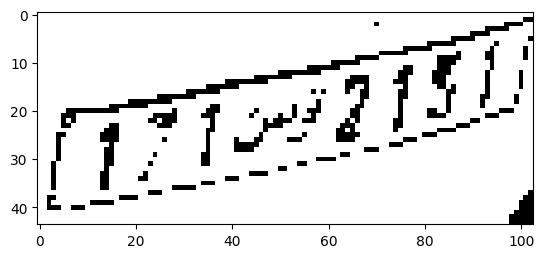

Detected License Plate: ree
Processing 569.jpg


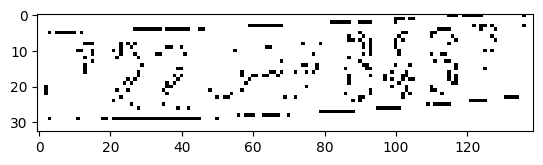

Detected License Plate: eae a
Processing 787.jpg


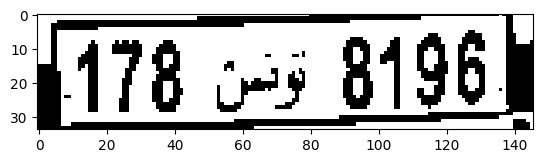

Detected License Plate: 1178 0-3 8196)
Processing 491.jpg


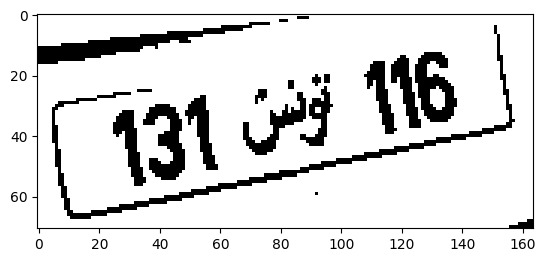

Detected License Plate: raat oA 1.
Processing 625.jpg


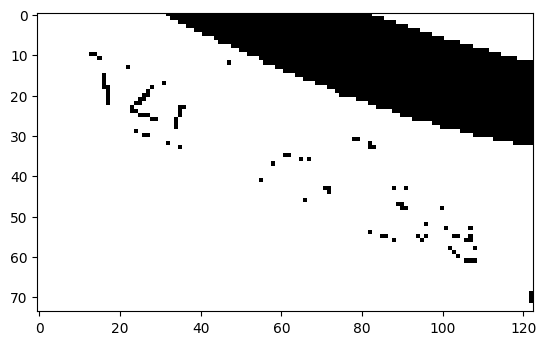

Detected License Plate: 4 os
Processing 192.jpg


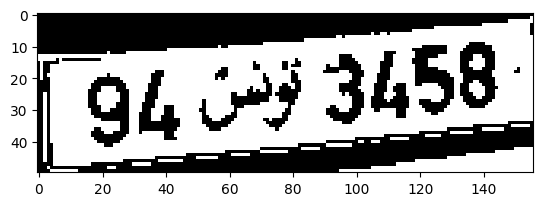

Detected License Plate: 
Processing 427.jpg


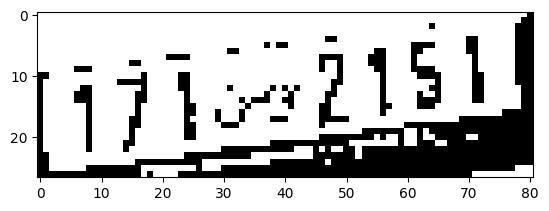

Detected License Plate: 7p ise2
Processing 904.jpg


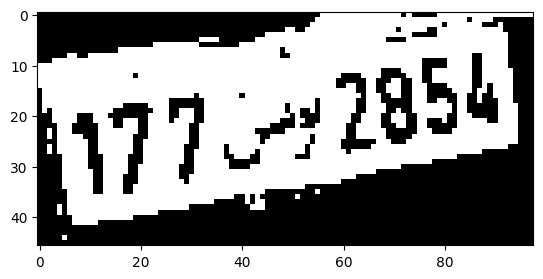

Detected License Plate: 774 ps
Processing 775.jpg


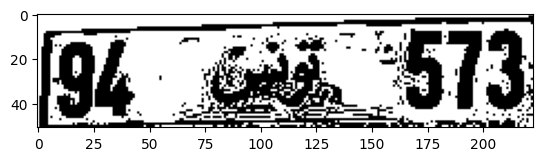

Detected License Plate: G4 tet, “513
Processing 464.jpg


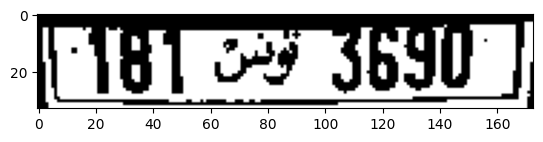

Detected License Plate: 
Processing 109.jpg


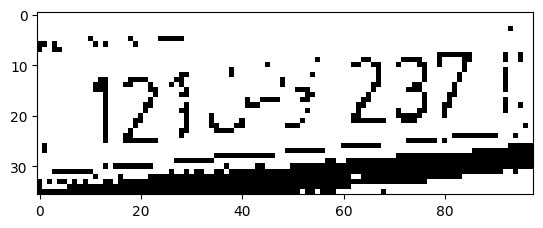

Detected License Plate: “12423 237
Processing 765.jpg


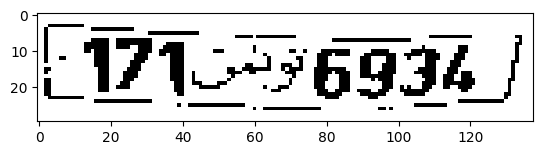

Detected License Plate: W135 6954 |
Processing 785.jpg


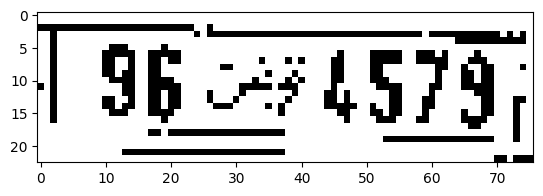

Detected License Plate: | 96 74579,
Processing 190.jpg


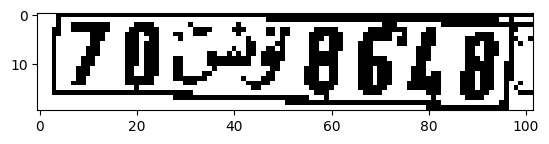

Detected License Plate: 
Processing 748.jpg


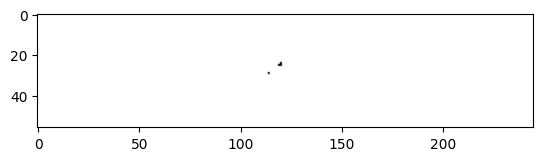

Detected License Plate: .
Processing 813.jpg


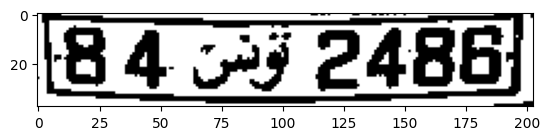

Detected License Plate: 18 4 3 2485)
Processing 671.jpg


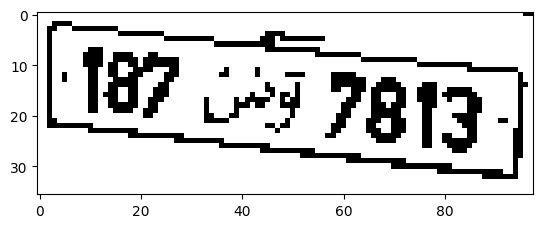

Detected License Plate: 187 7 7813
Processing 454.jpg


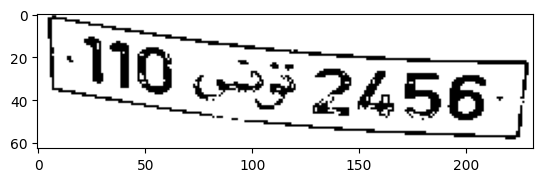

Detected License Plate: UG 53256]
Processing 709.jpg


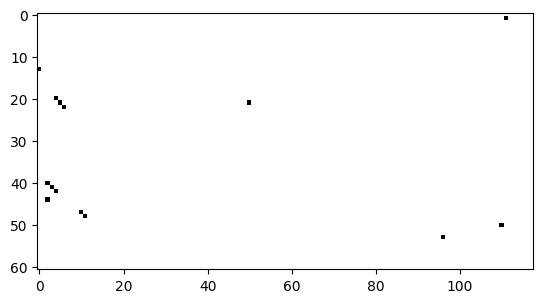

Detected License Plate: 
Processing 37.jpg


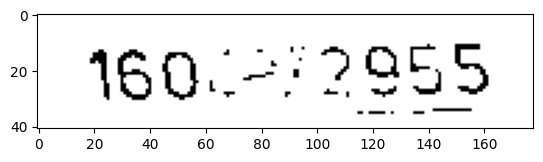

Detected License Plate: 1602/2955
Processing 79.jpg


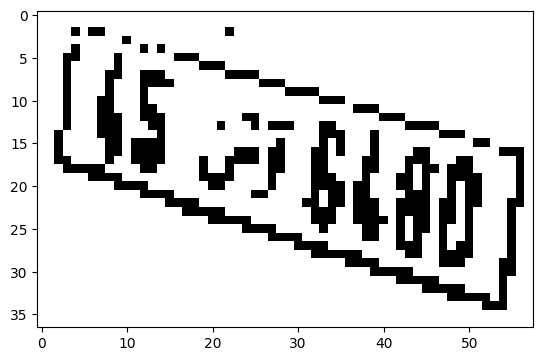

Detected License Plate: 
Processing 287.jpg


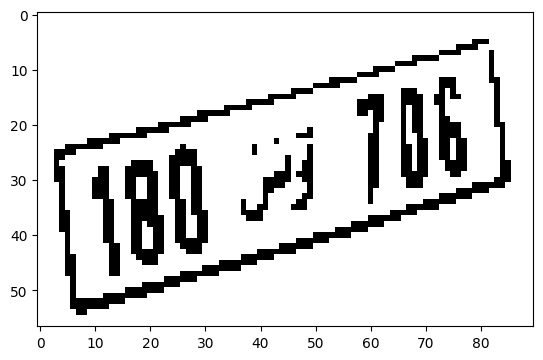

Detected License Plate: 
Processing 292.jpg


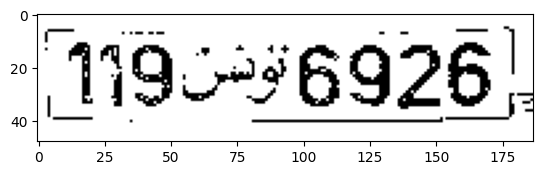

Detected License Plate: 119636926!
Processing 11.jpg


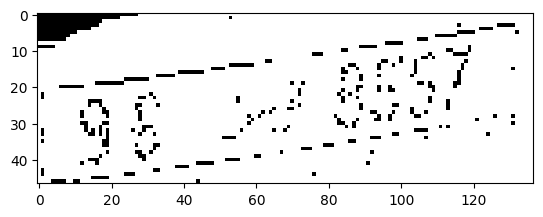

Detected License Plate: se.
Processing 268.jpg


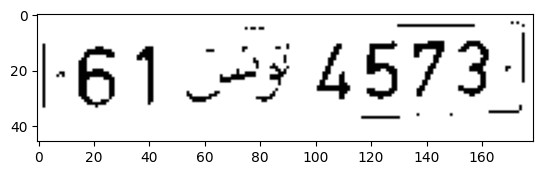

Detected License Plate: 61 9 4573
Processing 38.jpg


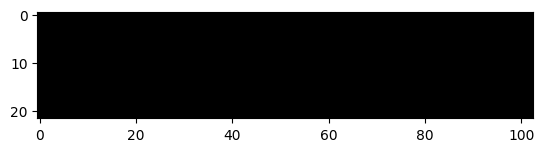

Detected License Plate: OS
Processing 363.jpg


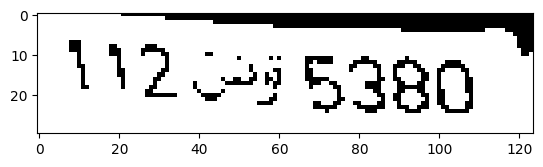

Detected License Plate: V2.5 5380
Processing 843.jpg


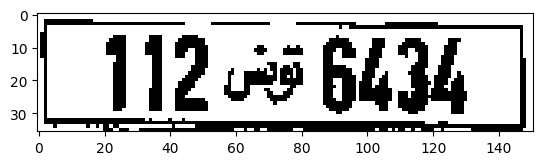

Detected License Plate: 112 3 6434
Processing 143.jpg


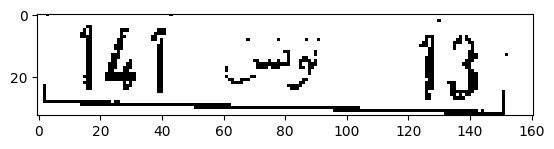

Detected License Plate: Jjéi Sy 13:
Processing 575.jpg


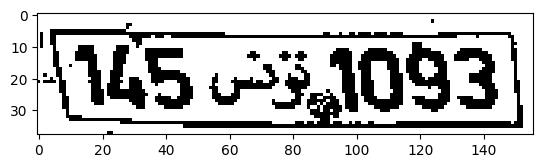

Detected License Plate: VES 25,1093
Processing 771.jpg


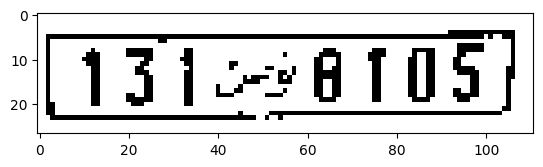

Detected License Plate: 1316105


In [7]:
import pytesseract
from PIL import Image

# Function to extract text using Tesseract
def ocr_license_plate(image_path):
    # Load the image
    image = cv.imread(image_path)

    # Optionally, preprocess the image (grayscale, resize, etc.)
    gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)  # Convert to grayscale
    ret, thresh = cv.threshold(gray, 127, 255, cv.THRESH_BINARY_INV)  # Threshold to binarize

    # Display the image if needed
    plt.imshow(thresh, cmap='gray')
    plt.show()

    # Use Tesseract to extract text
    license_plate_text = pytesseract.image_to_string(thresh, config='--psm 7')  # '--psm 7' treats image as a single line of text
    return license_plate_text.strip()

# Path to the directory containing license plate images
images_directory = '/content/license_plates_recognition_train'  # Replace with your path

# Loop through all images in the directory
for image_name in os.listdir(images_directory):
    if image_name.endswith(('.jpg', '.png', '.jpeg')):  # Check if the file is an image
        image_path = os.path.join(images_directory, image_name)
        print(f"Processing {image_name}")

        # Extract text using OCR
        plate_text = ocr_license_plate(image_path)

        # Print or store the recognized license plate text
        print(f"Detected License Plate: {plate_text}")
